In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 2
setup_one_gpu(GPU)

Picking GPU 2


In [2]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio
from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder
from tf_lab.point_clouds.autoencoder import Configuration as Conf
import tf_lab.point_clouds.encoders_decoders as enc_dec

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id

from tf_lab.autopredictors.plotting import plot_original_pclouds_vs_reconstructed, \
                                           plot_train_val_test_curves, plot_reconstructions_at_epoch

from tf_lab.autopredictors.evaluate import eval_model, read_saved_epochs

from tf_lab.autopredictors.exploration import latent_embedding_of_entire_dataset
                                                  
from general_tools.in_out.basics import create_dir, delete_files_in_directory, files_in_subdirs
from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.nips.data_sets.shape_net import pc_loader as sn_pc_loader
from tf_lab.point_clouds.raw_gan import RawGAN
from tf_lab.point_clouds.raw_gan_gp import RawGAN_GP
from tf_lab.point_clouds.latent_gan import LatentGAN
from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder


from tf_lab.nips.evaluate_gan import entropy_of_occupancy_grid, jensen_shannon_divergence, \
                                     sample_pclouds_distances

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.autopredictors.exploration import find_neighbors

from tf_lab.nips.helper import pclouds_centered_and_half_sphere

from tf_lab.point_clouds.generators_discriminators import latent_code_discriminator_two_layers, latent_code_generator_two_layers    

from tf_lab.icml.ae_farm_helper import relevant_class

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
n_pc_samples = 2048
do_training = True
do_plotting = True
ae_loss = 'emd'

save_synthetic_samples = True
save_model = True
saver_step = 10

class_name = raw_input('Give me the class type: ').lower()
ae_id = raw_input('Give me the AE/experiment ID: ').lower()
cmp_type = raw_input('Comparison Type ("best" epoch vs. "max_min" epoch): ').lower()

syn_id = shape_net_category_to_synth_id()[class_name]

experiment_name = '_'.join(['nb_wgan_gp_ae', ae_id, ae_loss, class_name, str(n_pc_samples), cmp_type, 'epoch'])

top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/synthetic_point_clouds'

train_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/gan/nb_gan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir);

Give me the class type: chair
Give me the AE/experiment ID: 12
Comparison Type ("best" epoch vs. "max_min" epoch): best


In [5]:
# Load Raw Point-Clouds of class
pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
pclouds_path = osp.join(pclouds_path, syn_id)
file_names = pio.load_filenames_of_input_data(pclouds_path, '.ply')
pclouds, model_ids, syn_ids = pio.load_crude_point_clouds(file_names=file_names, n_threads=50, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(pclouds), )

6778 files containing complete point clouds were found.


In [6]:
ae_help = relevant_class(ae_loss)

In [7]:
# Load Auto-Encoder
ae_net_name = 'ae_farm_' + class_name + '_conv_arch_' + ae_id + '_2048pts_' + ae_loss
ae_net_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/ae_farming', ae_net_name)
ae_conf = Conf.load(osp.join(ae_net_dir, 'configuration'))
reset_tf_graph()
ae = PointNetAutoEncoder(ae_net_name, ae_conf)
bneck = ae.bottleneck_size
assert(ae_help.experiment_id_to_bneck[int(ae_id)] == bneck) 

if cmp_type.startswith('best'):
    load_epoch, _ = ae_help.best_epochs[bneck]
    print load_epoch
elif cmp_type.startswith('max'):
    load_epoch, _ = ae_help.max_min_epochs[bneck]
else:
    assert(False)
    saved_epochs = read_saved_epochs(ae_conf.train_dir)
    load_epoch = saved_epochs[-1]

ae.restore_model(ae_conf.train_dir, load_epoch, verbose=True)

990
Model restored in epoch 990.


In [8]:
# Convert raw-data to latent codes.
raw_data = PointCloudDataSet(pclouds, init_shuffle=False)
_, latent_codes, _ = latent_embedding_of_entire_dataset(raw_data, ae, ae_conf)
training_data = PointCloudDataSet(latent_codes)

In [17]:
# reconstructed = ae.decode(latent_codes)
# save_dir = osp.join(top_data_dir, 'OUT/icml/ae_reconstructed_point_clouds')
# create_dir(save_dir)
# save_file = osp.join(save_dir, 'ae_' + ae_id + '_2048pts_' + ae_loss + '_' + cmp_type)
# np.savez(save_file, reconstructed)

In [9]:
# TODO : make GAN conf.
init_lr = 0.0001
batch_size = 50

noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = ae.bottleneck_size
max_epochs = 1500

n_syn_samples = training_data.num_examples  # Same number as original GT data.
n_out = [ae.bottleneck_size]

lam = 10
beta = 0.5
disc_kwargs = {'b_norm': False}
reset_tf_graph()
gan = RawGAN_GP(experiment_name, init_lr, lam, n_out, noise_dim,\
                latent_code_discriminator_two_layers, latent_code_generator_two_layers,\
                beta=beta, disc_kwargs=disc_kwargs)


1 (-0.50743358863724608, 0.37180276263367246)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1 is not in all_model_checkpoint_paths. Manually adding it.


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


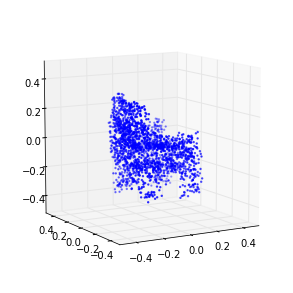

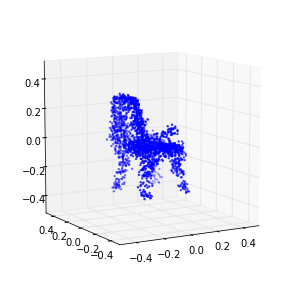

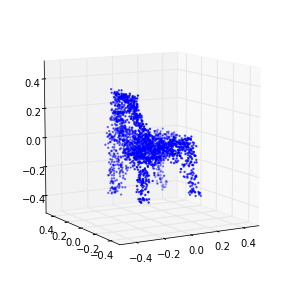

2 (-1.1316041778635095, 0.65718486794718989)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-2 is not in all_model_checkpoint_paths. Manually adding it.


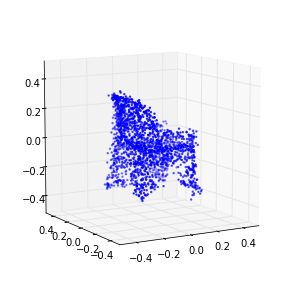

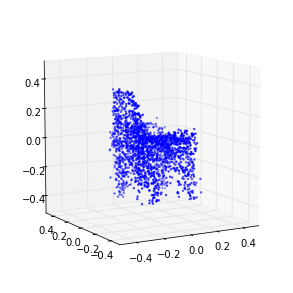

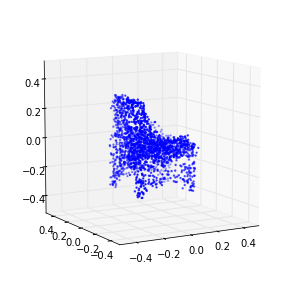

3 (-1.0108075587837784, 0.50229268934991622)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-3 is not in all_model_checkpoint_paths. Manually adding it.


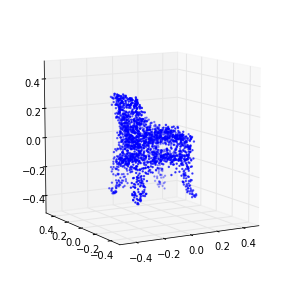

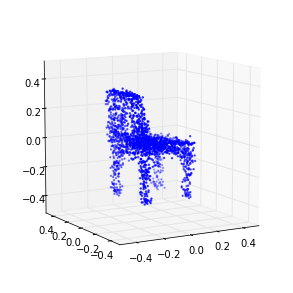

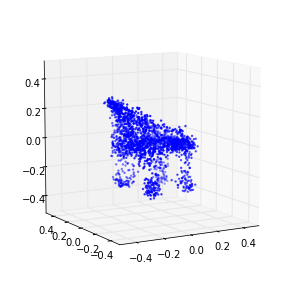

4 (-0.96265876293182373, 0.44166395178547613)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-4 is not in all_model_checkpoint_paths. Manually adding it.


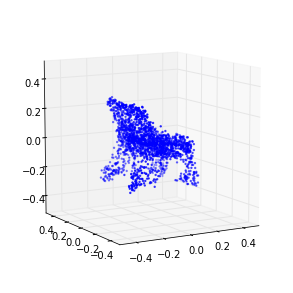

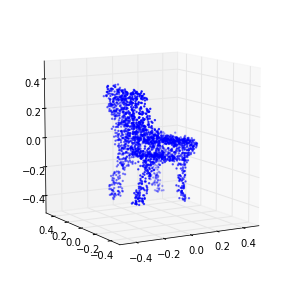

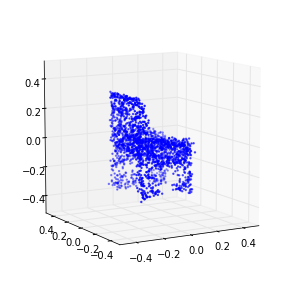

5 (-0.93042101639288444, 0.3685424835593612)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-5 is not in all_model_checkpoint_paths. Manually adding it.


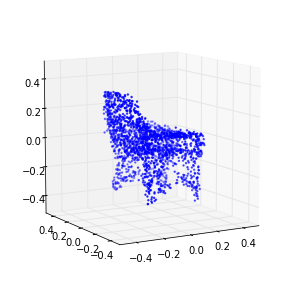

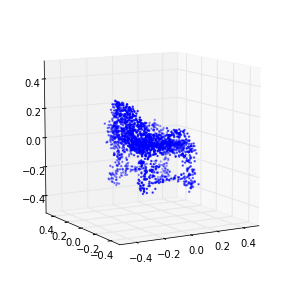

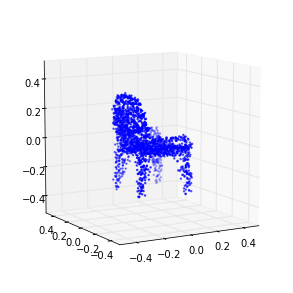

6 (-0.92174530161751644, 0.32349954159171496)
7 (-0.92247597111596003, 0.26037554442882538)
8 (-0.92576866635569821, 0.20220422082477146)
9 (-0.92617239157358811, 0.1836560688636921)
10 (-0.92322960208963467, 0.13574817528327307)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


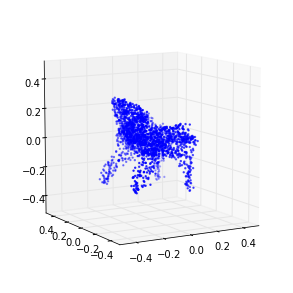

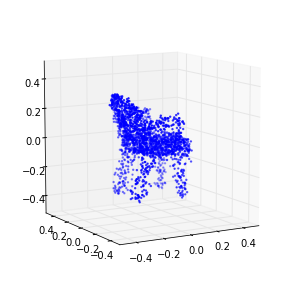

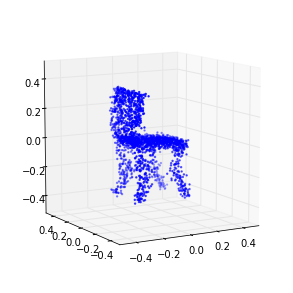

11 (-0.9145194168444033, 0.12530325849850973)
12 (-0.90389156827220207, 0.096197201559940979)
13 (-0.89422352578904896, 0.082460841646900887)
14 (-0.8766600502861871, 0.067858667147380328)
15 (-0.8617853314788253, 0.076928020213489184)
16 (-0.84275566030431681, 0.039639202394971144)
17 (-0.82321417419998733, 0.046712068409693462)
18 (-0.80018570952945289, 0.044630402112724607)
19 (-0.78556436874248359, 0.032038204716863458)
20 (-0.76132375620029591, 0.037817163099707278)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


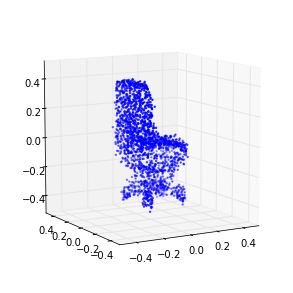

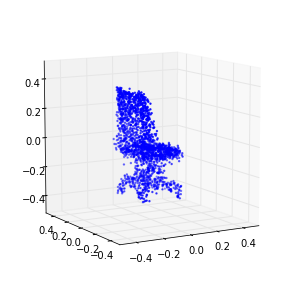

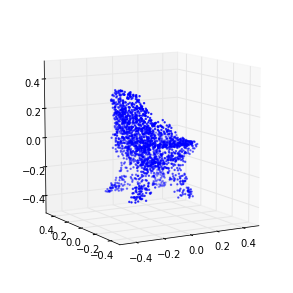

21 (-0.74845550060272215, 0.02503487309096036)
22 (-0.72479929924011233, 0.025465193756476597)
23 (-0.70782878752107969, 0.035861869480598857)
24 (-0.68769112516332553, 0.02335502567735535)
25 (-0.66898906981503525, 0.032477033945421376)
26 (-0.65032782819535995, 0.026985342157314771)
27 (-0.62891712497781826, 0.044986141017741628)
28 (-0.61682880013077346, 0.049034826009085881)
29 (-0.59587277836269803, 0.030450405130438781)
30 (-0.58335823041421397, 0.04429310903436056)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


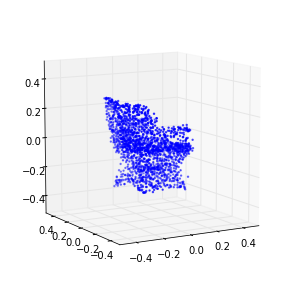

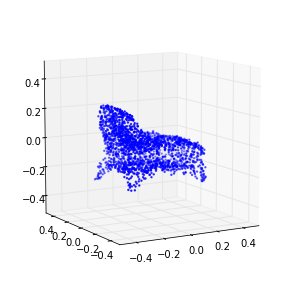

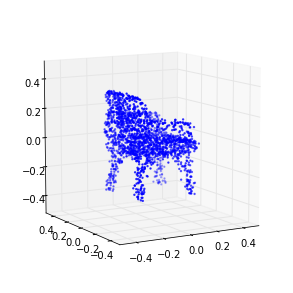

31 (-0.56622615699414858, 0.045230120748143504)
32 (-0.55320493755517186, 0.020869087436477893)
33 (-0.54156497672752102, 0.056002213240221692)
34 (-0.52574965755144754, 0.037557035201677573)
35 (-0.5147995189384178, 0.048408399405026878)
36 (-0.50310927077575962, 0.032490391818875516)
37 (-0.49323229083308467, 0.035925863362434834)
38 (-0.48579046196407744, 0.011082240552813918)
39 (-0.47629164126184254, 0.017750085124539003)
40 (-0.46926573448710973, 0.0032030078065064219)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


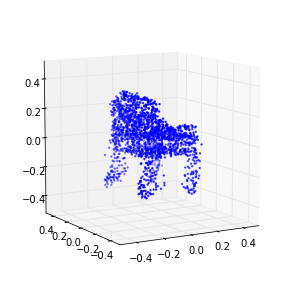

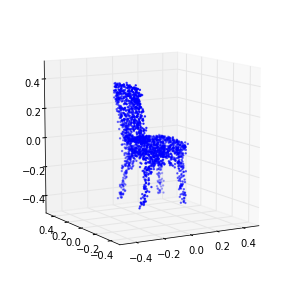

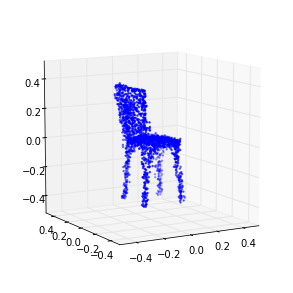

41 (-0.46311467576909948, -0.016382439544907323)
42 (-0.45618346708792229, 0.00085034211062722735)
43 (-0.44871384788442542, -0.019494108217595903)
44 (-0.44285966665656479, -0.036143396739606502)
45 (-0.43793940963568512, -0.04640292736736161)
46 (-0.4290448040873916, -0.050138288660457837)
47 (-0.42749684408858968, -0.062845011759135455)
48 (-0.41803105628048931, -0.074337996499336978)
49 (-0.41369556144431785, -0.10296059579209045)
50 (-0.40750677210313302, -0.09859766293731001)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


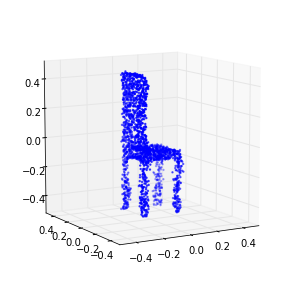

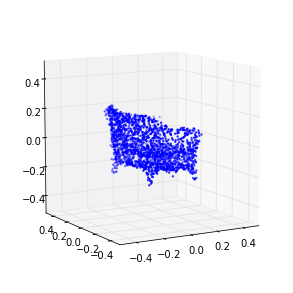

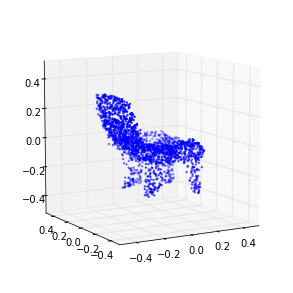

51 (-0.40365404111367686, -0.15962797430930314)
52 (-0.40194968250062729, -0.13475208481152853)
53 (-0.39531706770261127, -0.19444097854472972)
54 (-0.39053588377104864, -0.1729331695371204)
55 (-0.38237882344811053, -0.22110398803596143)
56 (-0.37869596989066512, -0.21366092341917534)
57 (-0.37265187921347442, -0.2222721344894833)
58 (-0.36782480389983568, -0.24721566725660254)
59 (-0.36209160266099155, -0.2407566264823631)
60 (-0.35800939202308657, -0.2591175122393502)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


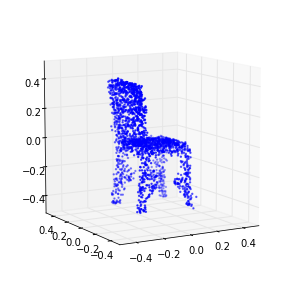

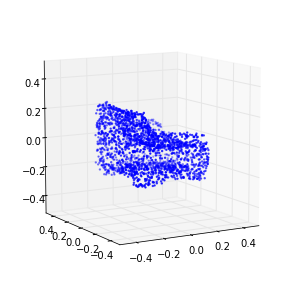

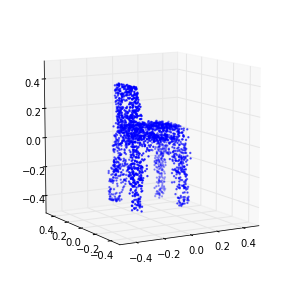

61 (-0.35468316321019772, -0.28688763854680238)
62 (-0.35001518108226637, -0.28314247285878219)
63 (-0.34405731338041801, -0.30716404981083339)
64 (-0.33968342984164202, -0.29431009016655107)
65 (-0.33562077107252897, -0.3202627063901336)
66 (-0.33313218553860985, -0.29453315999772811)
67 (-0.32794756823115878, -0.33895131835231074)
68 (-0.32200838802037418, -0.31406345908288602)
69 (-0.32371973594029746, -0.35792115109938161)
70 (-0.31867490311463675, -0.34492297084243212)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


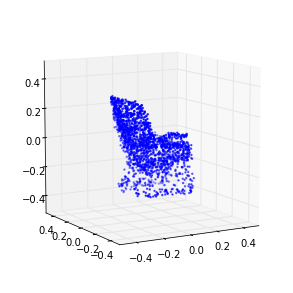

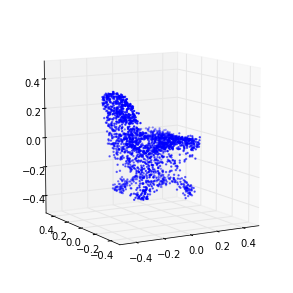

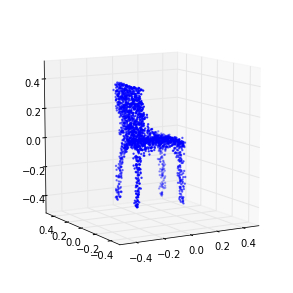

71 (-0.31417931373472568, -0.33738458266964666)
72 (-0.31519781306937888, -0.33821215232213336)
73 (-0.30955302593884643, -0.33404412424122848)
74 (-0.30589093897077774, -0.36293878599449442)
75 (-0.30637732777330612, -0.35225115882025826)
76 (-0.30429064543158918, -0.35428263081444633)
77 (-0.29984227573430094, -0.35498038596577114)
78 (-0.30159271260102588, -0.34749314851231045)
79 (-0.29496853837260495, -0.37799466263364861)
80 (-0.29601671927505069, -0.33658843294337942)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


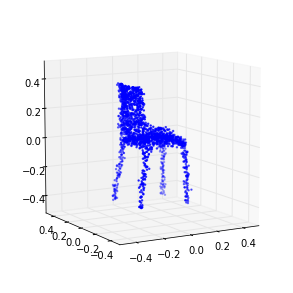

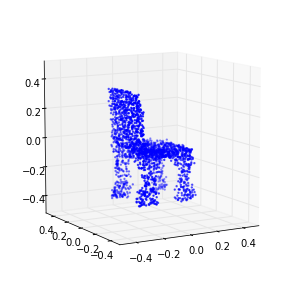

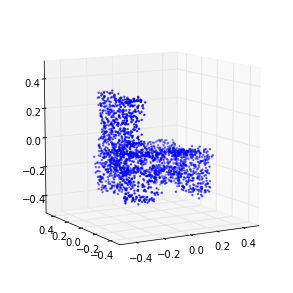

81 (-0.29491357726079448, -0.34650866632108335)
82 (-0.28961913122071159, -0.35318400572847436)
83 (-0.28885117658862364, -0.33838032461978773)
84 (-0.28802420651471172, -0.34679496177920588)
85 (-0.28405111597643956, -0.34117024253915856)
86 (-0.28268699645996093, -0.32472417476000609)
87 (-0.28236439205982067, -0.32679728777320299)
88 (-0.28101591832107969, -0.31485288562598052)
89 (-0.27822899034729709, -0.34454475508795845)
90 (-0.27213069895903269, -0.34284581519939283)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


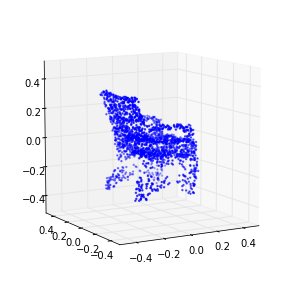

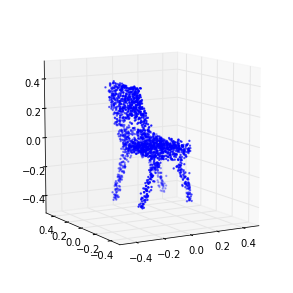

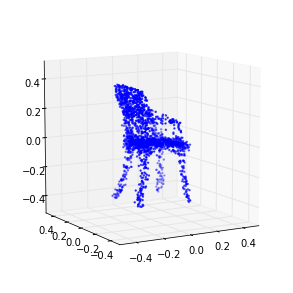

91 (-0.27288980219099257, -0.30227364434136283)
92 (-0.27060311381463653, -0.30117718599460741)
93 (-0.26804596572010603, -0.31651396773479601)
94 (-0.26672114818184461, -0.29503890430485763)
95 (-0.26383447051048281, -0.29813990548804953)
96 (-0.2659070042548356, -0.28532707636003141)
97 (-0.26197291049692367, -0.27989821963840061)
98 (-0.25645950259985745, -0.29143859832375135)
99 (-0.26045521939242328, -0.250672847032547)
100 (-0.25662304770063471, -0.2609029809633891)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


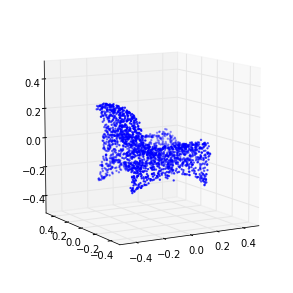

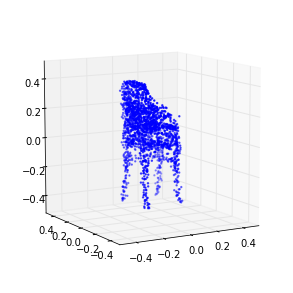

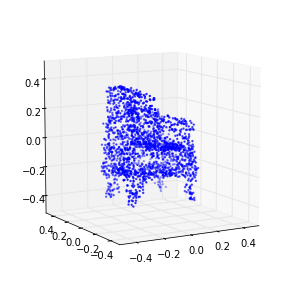

101 (-0.25397327895517702, -0.27679400366765483)
102 (-0.25400371529437876, -0.23725532492001852)
103 (-0.25185199611716802, -0.2693107994618239)
104 (-0.24778797416775314, -0.24728345319076819)
105 (-0.2522355302616402, -0.24255587546913712)
106 (-0.24869458057262278, -0.23276804332379941)
107 (-0.25074936438489842, -0.24449298503222289)
108 (-0.24881013267570071, -0.24320894479751587)
109 (-0.24984042754879704, -0.24153582751750946)
110 (-0.24804125450275563, -0.23899712661902109)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


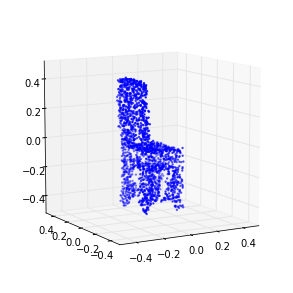

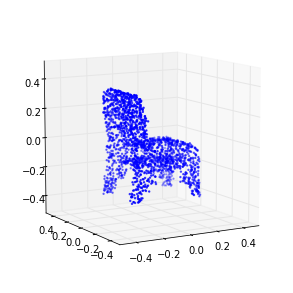

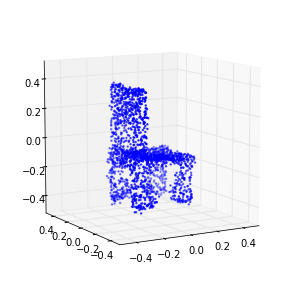

111 (-0.24485324223836263, -0.21223737630579206)
112 (-0.243820771795732, -0.22344320681360033)
113 (-0.24130804991280591, -0.23552706506517199)
114 (-0.24636548161506652, -0.21157193459846355)
115 (-0.24306401786980805, -0.19610494485607854)
116 (-0.24290580837814896, -0.22271446055836147)
117 (-0.24288119773070019, -0.20207059880097708)
118 (-0.24102452209702244, -0.21903654988165255)
119 (-0.23669070932600234, -0.22778677995558139)
120 (-0.23946701630398079, -0.2178121534762559)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


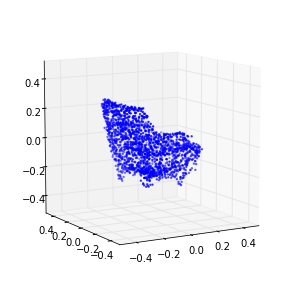

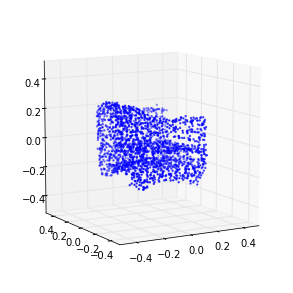

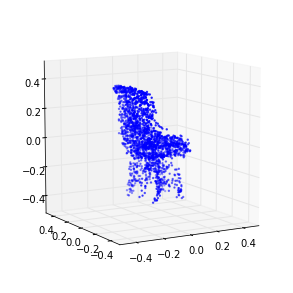

121 (-0.23908313932242217, -0.20161250509597636)
122 (-0.2347456877982175, -0.22318817951061107)
123 (-0.24109628995259602, -0.18658947337556769)
124 (-0.23753089330814503, -0.21269479559527504)
125 (-0.23424143460061814, -0.18103413007877492)
126 (-0.23589797306943822, -0.20106046067343819)
127 (-0.23541966417321453, -0.20370726397743932)
128 (-0.23384807418893885, -0.19588858275501816)
129 (-0.23561066985130311, -0.19572799432056923)
130 (-0.23455264137850868, -0.20333322606704854)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


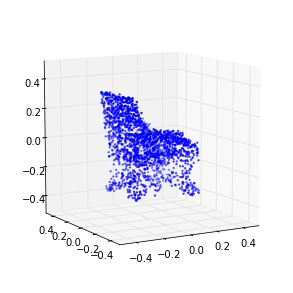

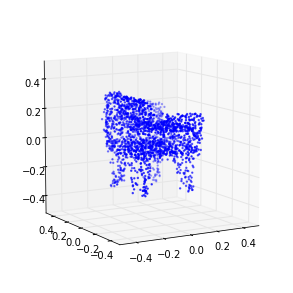

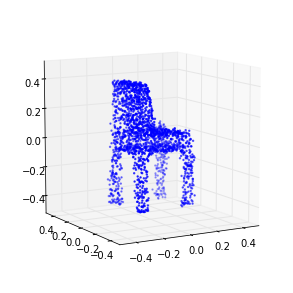

131 (-0.23434747203632636, -0.18471000288371686)
132 (-0.23482188913557264, -0.17821066661013496)
133 (-0.23434014088577695, -0.19091318878862593)
134 (-0.23316662962789889, -0.17856436912660245)
135 (-0.23282752533753712, -0.19940268938188199)
136 (-0.23228947917620341, -0.18895079361067879)
137 (-0.23255510727564493, -0.18602922062079111)
138 (-0.23211343807202797, -0.16470158596833548)
139 (-0.23181226264547419, -0.18642782116377796)
140 (-0.23305389307163379, -0.19407414010277502)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


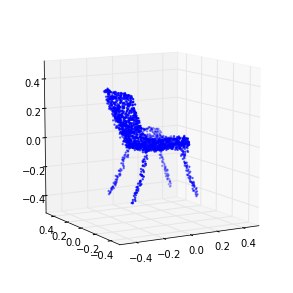

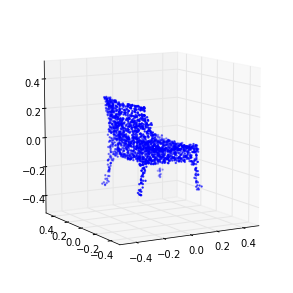

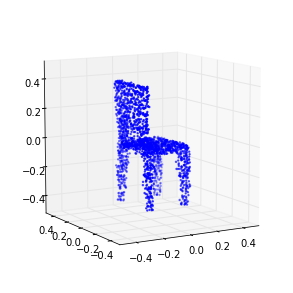

141 (-0.23294299101388014, -0.17843364068755396)
142 (-0.23535038001007505, -0.17248394009139803)
143 (-0.23181380993790096, -0.17902165596131925)
144 (-0.22930854481679422, -0.18743442247311273)
145 (-0.23219665421379937, -0.18101736848001126)
146 (-0.23041482170422872, -0.16580164598094094)
147 (-0.23157566443637564, -0.1847747200065189)
148 (-0.23259809486292027, -0.16929071010262878)
149 (-0.2310530611762294, -0.17233453525437248)
150 (-0.23389406402905782, -0.17309658394919503)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


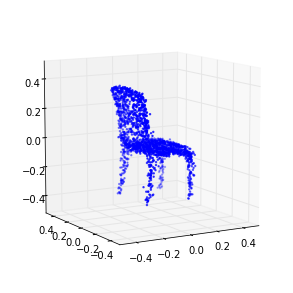

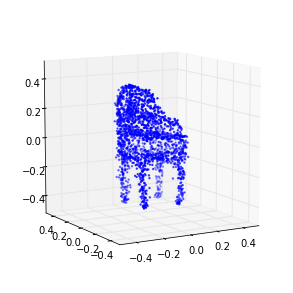

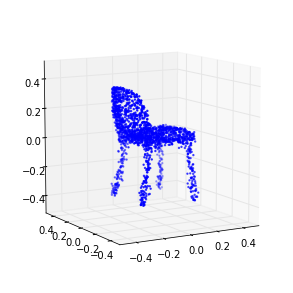

151 (-0.2308633260152958, -0.16519373406966528)
152 (-0.23062079581949446, -0.16131870172641896)
153 (-0.23244832709983543, -0.16713220101815682)
154 (-0.23305764463212755, -0.15227359588499423)
155 (-0.22965110981905901, -0.15978423092100355)
156 (-0.23172164404833759, -0.14996980103077712)
157 (-0.23029826195151717, -0.14272586614997299)
158 (-0.2309996356566747, -0.15310188989948342)
159 (-0.2318186676060712, -0.13796648120990507)
160 (-0.22875667755250578, -0.13631041706712158)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


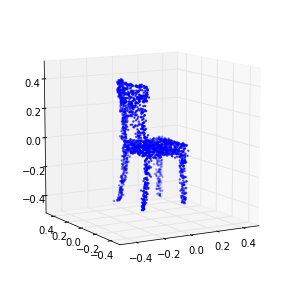

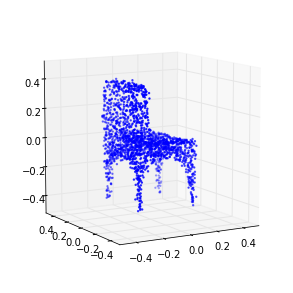

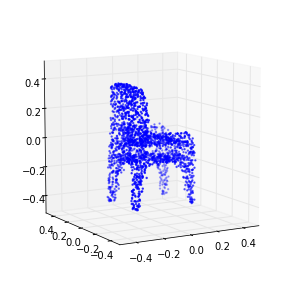

161 (-0.22925161691727461, -0.15682483988779564)
162 (-0.22922960972344433, -0.14556226134300232)
163 (-0.22706332868999904, -0.14176254995443202)
164 (-0.23189357993779358, -0.16227549286904158)
165 (-0.22791735143573197, -0.15707164533712245)
166 (-0.22786910114464937, -0.14506293722876795)
167 (-0.22880000626599348, -0.15833813586720713)
168 (-0.22689448153531111, -0.15539424424922024)
169 (-0.22548771544739052, -0.16445421869004215)
170 (-0.23007288354414482, -0.14044207279328946)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


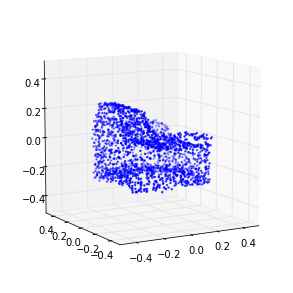

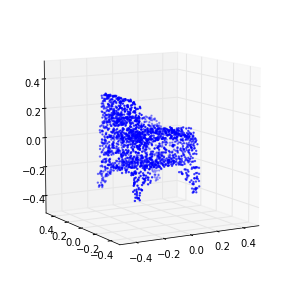

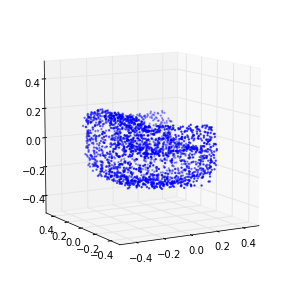

171 (-0.22725872474688072, -0.14460360672738817)
172 (-0.2242119041857896, -0.16619187124349452)
173 (-0.22598977949884202, -0.14780544296458917)
174 (-0.22749119809380283, -0.15061197485084887)
175 (-0.22830853142120219, -0.14238592706344746)
176 (-0.22469672306820199, -0.15611117112415809)
177 (-0.22725565549400117, -0.14379882508957828)
178 (-0.22624016735288832, -0.16686475580489193)
179 (-0.22739490778357893, -0.16611712812273591)
180 (-0.22981758636456948, -0.14460679888725281)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


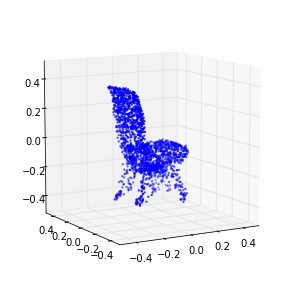

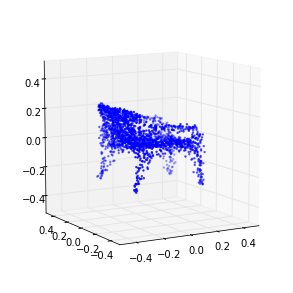

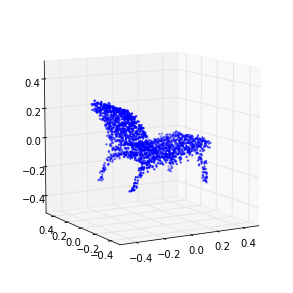

181 (-0.22949028743637934, -0.17207294454177222)
182 (-0.22873518003357782, -0.15722002116618333)
183 (-0.22689710270475458, -0.16641712464668132)
184 (-0.22507818793808973, -0.14325679479925721)
185 (-0.22510395789587939, -0.15405555676530908)
186 (-0.22532662981086307, -0.16076718739889287)
187 (-0.2256794050887779, -0.16625829096193667)
188 (-0.22312044092902431, -0.15899182083430113)
189 (-0.22860077928613734, -0.15677896086816434)
190 (-0.22373473909166125, -0.15309850788778728)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


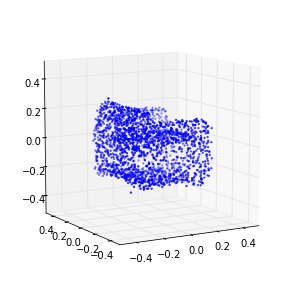

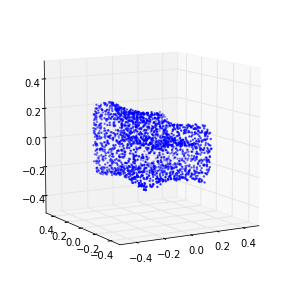

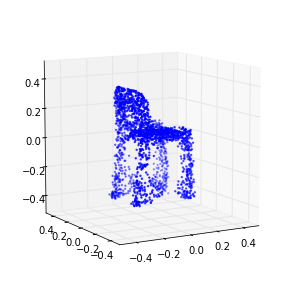

191 (-0.22687121364805435, -0.14656599417880731)
192 (-0.22587528471593504, -0.13483512732717726)
193 (-0.22876179207254338, -0.14806777625172227)
194 (-0.2255404931527597, -0.15983341620476157)
195 (-0.2245174906871937, -0.14249569094843334)
196 (-0.22731549761913442, -0.13351435297065312)
197 (-0.22418307871730239, -0.15306799638050575)
198 (-0.22562997572951846, -0.14004567320700045)
199 (-0.22367029432897215, -0.13959995491637123)
200 (-0.22575397204469752, -0.13254590056560658)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


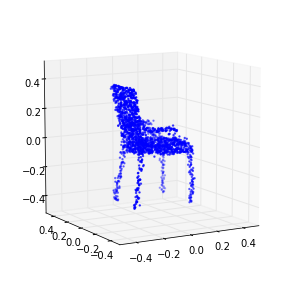

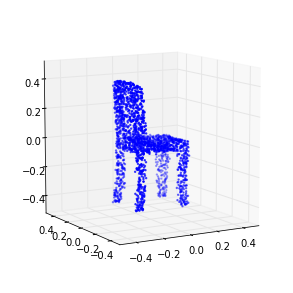

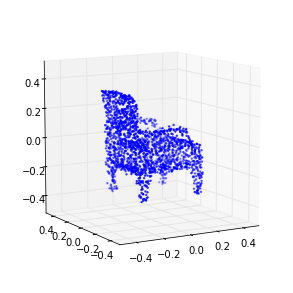

201 (-0.22769920881147737, -0.14470238983631134)
202 (-0.22488835012471234, -0.13023859234871688)
203 (-0.22621990022835908, -0.13584625279461895)
204 (-0.22856168614493477, -0.13720422927980069)
205 (-0.225386643409729, -0.12475554010382404)
206 (-0.22749195165104336, -0.14128283383669676)
207 (-0.22612180091716624, -0.13319727226539893)
208 (-0.22377265206089728, -0.13328645985435555)
209 (-0.22435307999451956, -0.14447717782523897)
210 (-0.22503442168235779, -0.136066108390137)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


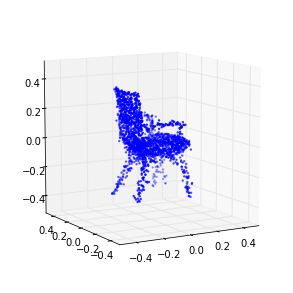

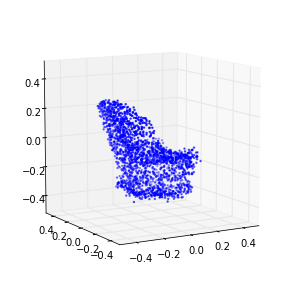

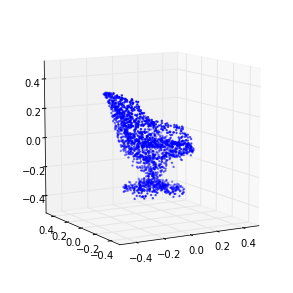

211 (-0.22878856371950221, -0.12569556357683959)
212 (-0.22808254317001062, -0.14339121596680748)
213 (-0.2262585914797253, -0.13459711052753306)
214 (-0.22433320758519348, -0.15279163696147777)
215 (-0.22492711621302144, -0.12830956638963134)
216 (-0.22819879794562303, -0.15462193665681062)
217 (-0.22585251044344018, -0.13717901706695557)
218 (-0.22631354519614466, -0.12909712752810232)
219 (-0.22745675146579741, -0.13799514207575056)
220 (-0.22768548307595429, -0.13636380530617856)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


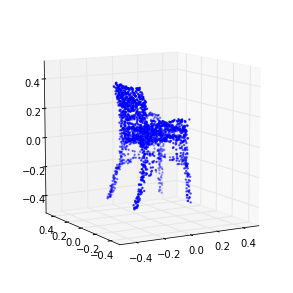

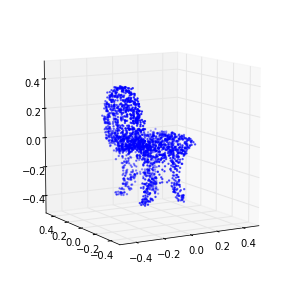

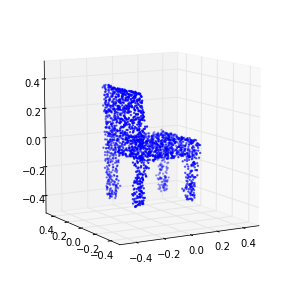

221 (-0.22508004859641748, -0.15456648750437629)
222 (-0.2245761020316018, -0.12400200769857124)
223 (-0.2226945228046841, -0.13293411886250531)
224 (-0.22499335915954025, -0.14591601904895571)
225 (-0.22589546188160226, -0.13425931748416689)
226 (-0.22512024806605446, -0.13974075240117531)
227 (-0.2250930443958, -0.14324078405344928)
228 (-0.22538655786602585, -0.14745767359380368)
229 (-0.22714310652679867, -0.13466058975016629)
230 (-0.2254123130330333, -0.13386369606962911)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


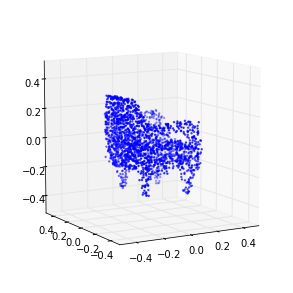

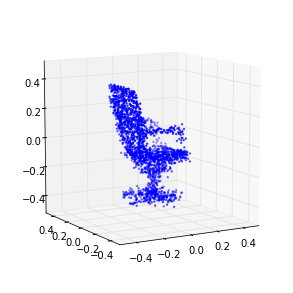

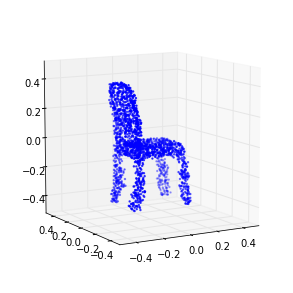

231 (-0.22435469693607754, -0.14673541596642248)
232 (-0.22463022426322654, -0.13968138865850591)
233 (-0.22613579454245392, -0.15790000143978331)
234 (-0.2272154320721273, -0.1398532415429751)
235 (-0.22631551137676945, -0.15951750013563368)
236 (-0.22661873521628204, -0.14403214029691838)
237 (-0.22504315078258513, -0.15456409614395211)
238 (-0.22581989091855509, -0.14228218655895303)
239 (-0.22638792826069726, -0.1435637926613843)
240 (-0.22621133482014691, -0.14510572729287324)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


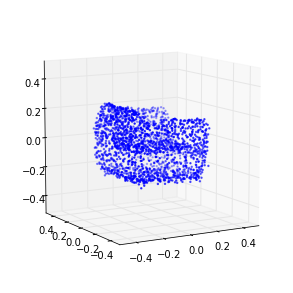

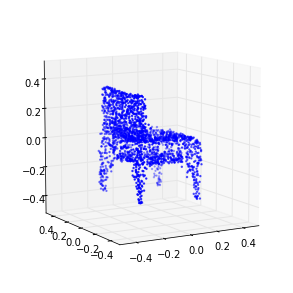

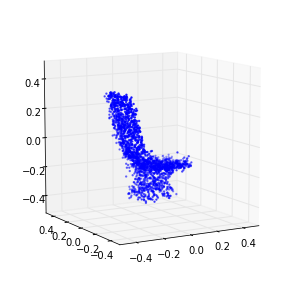

241 (-0.22432510930079, -0.14949653463231194)
242 (-0.22457172429120098, -0.14512984813363464)
243 (-0.22301233984805918, -0.14336101517633157)
244 (-0.22645768721898396, -0.13812418420005729)
245 (-0.22552447727432959, -0.15979294340919564)
246 (-0.22179648765811213, -0.14531415728507219)
247 (-0.2270102130042182, -0.13943436603855203)
248 (-0.2232758902841144, -0.13993054186856305)
249 (-0.22816794956171954, -0.14661451484318133)
250 (-0.22464010836901488, -0.14269640213913387)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


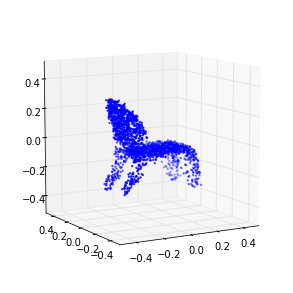

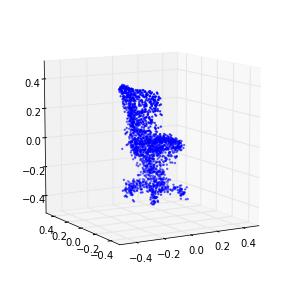

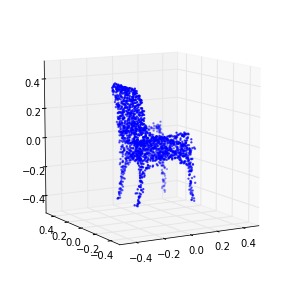

251 (-0.22392321162753634, -0.14268765184614393)
252 (-0.22511244923980148, -0.15063637536433008)
253 (-0.22419016880017739, -0.13878835406568316)
254 (-0.22546796721440773, -0.14977837547107978)
255 (-0.22421962221463521, -0.13544198015221842)
256 (-0.22374061346054078, -0.14446750862730873)
257 (-0.22583324103443711, -0.12966634029591526)
258 (-0.22314323661503968, -0.14539444336184748)
259 (-0.22577091643103847, -0.12734297387025975)
260 (-0.22500801130577369, -0.13475551897728885)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


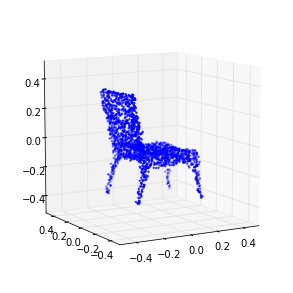

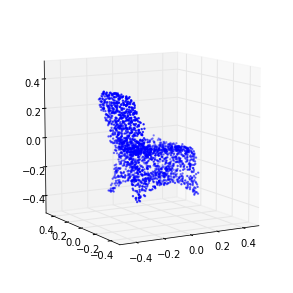

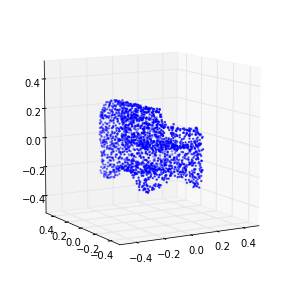

261 (-0.2247644747848864, -0.14833353708187738)
262 (-0.2258557579031697, -0.14079161733388901)
263 (-0.22380718666094321, -0.15173253665367761)
264 (-0.22364446046175779, -0.13999136592502948)
265 (-0.22503510227909795, -0.15308829645315805)
266 (-0.22583913107713063, -0.14072099852341194)
267 (-0.22581059027601172, -0.14409045764693507)
268 (-0.22372083752243607, -0.1491635568715908)
269 (-0.22371852883586177, -0.14151403087156791)
270 (-0.22639215025636886, -0.14645159134158381)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


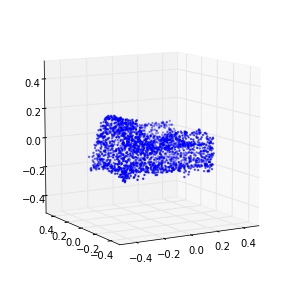

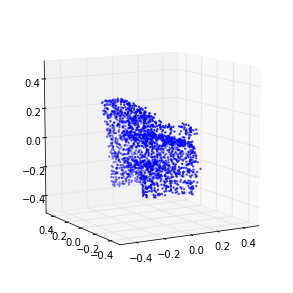

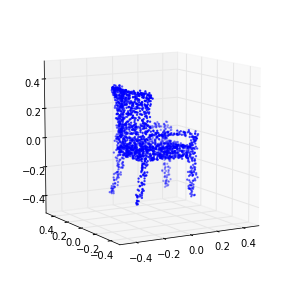

271 (-0.22342535036581535, -0.13783273901100512)
272 (-0.22591995199521384, -0.13544918293202365)
273 (-0.22448507436999568, -0.13280750949073722)
274 (-0.22546164183704942, -0.12970451017220816)
275 (-0.223624649643898, -0.1427861132003643)
276 (-0.22523068178583075, -0.14323026438554129)
277 (-0.22411345375908745, -0.16673782881763247)
278 (-0.22744696581805193, -0.14788278495823895)
279 (-0.22436707229525954, -0.13992534715820243)
280 (-0.22871068771238681, -0.14434172295861775)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


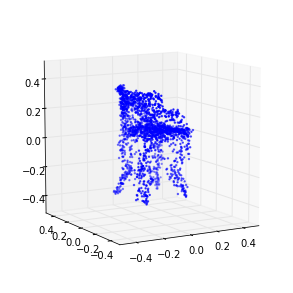

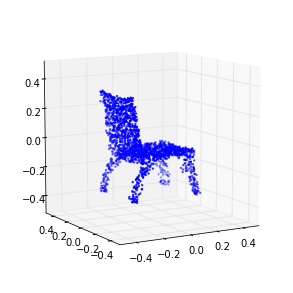

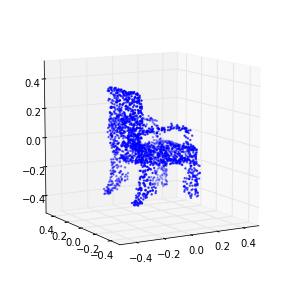

281 (-0.22408103733151047, -0.14441466497050393)
282 (-0.22415396162757167, -0.1508303532997767)
283 (-0.22670071445129536, -0.14314580515578942)
284 (-0.22522544308944983, -0.15534374117851257)
285 (-0.22681229313214621, -0.1446032546184681)
286 (-0.22194535368018681, -0.14822904931174385)
287 (-0.22668352557553184, -0.13640032487886924)
288 (-0.22690991361935933, -0.14608213167499612)
289 (-0.2233675950103336, -0.15068400568432277)
290 (-0.22533670012597684, -0.1393281291756365)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


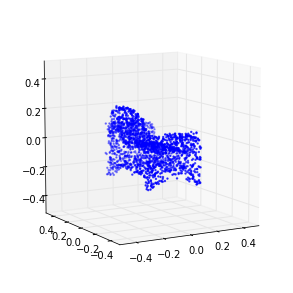

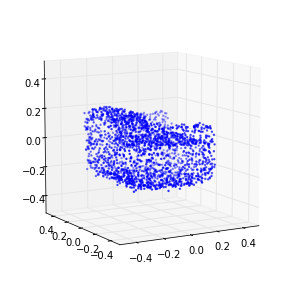

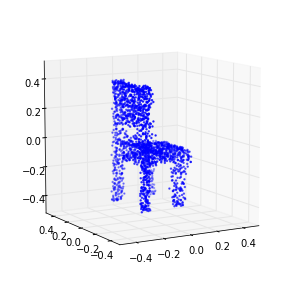

291 (-0.22558512974668432, -0.12454436802201801)
292 (-0.22649065454800923, -0.12859506242805058)
293 (-0.22639054733294028, -0.13678053766489029)
294 (-0.22489238259968936, -0.13400175284456323)
295 (-0.22556327095738163, -0.14932567598643126)
296 (-0.22478421595361497, -0.13597839932750772)
297 (-0.22764120278535066, -0.12882247125660931)
298 (-0.22260004911157821, -0.13050222010524185)
299 (-0.22306617410094651, -0.13309552437729305)
300 (-0.22432065561965661, -0.12615860170788235)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


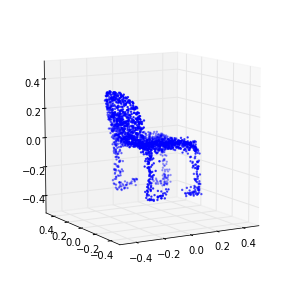

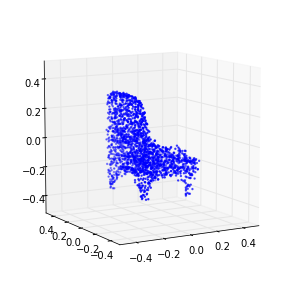

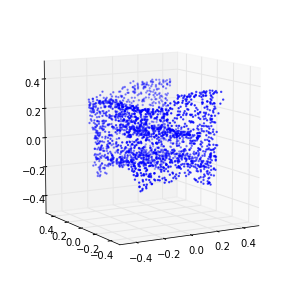

301 (-0.22033921899618925, -0.12324081085346363)
302 (-0.22795554686475683, -0.13846980200873482)
303 (-0.22487304608027139, -0.12285939383286017)
304 (-0.22539991802639431, -0.12117864191532135)
305 (-0.22399601362369678, -0.11481798688570659)
306 (-0.22708413887906959, -0.12405188602429849)
307 (-0.22777502536773681, -0.12432896428638035)
308 (-0.22349589268366496, -0.13437981600010837)
309 (-0.22394451995690665, -0.14221769626493808)
310 (-0.22543194492657978, -0.10796797178961613)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


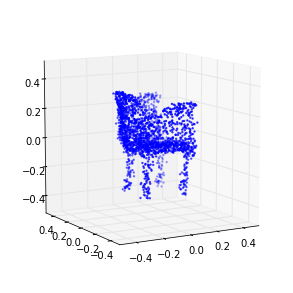

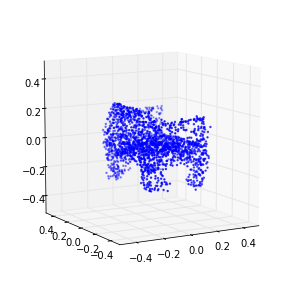

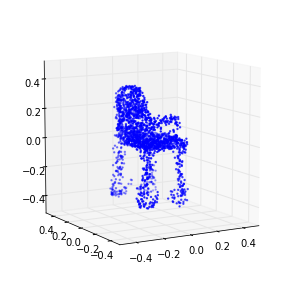

311 (-0.22521989952634883, -0.12102525460499304)
312 (-0.22779766685432859, -0.10225288293979785)
313 (-0.22321974480593645, -0.11534633653031455)
314 (-0.22322240626370465, -0.1198117826823835)
315 (-0.22435547312100729, -0.10515150510602528)
316 (-0.22113850668624596, -0.10317636915930996)
317 (-0.22408527588402782, -0.1185764424778797)
318 (-0.22278859173810039, -0.11526613682508469)
319 (-0.2265494379732344, -0.11778405253533963)
320 (-0.22262912502995244, -0.09233331266376707)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


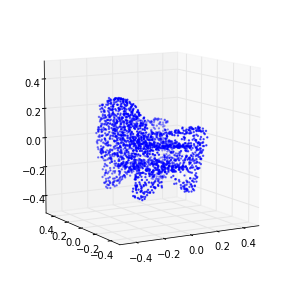

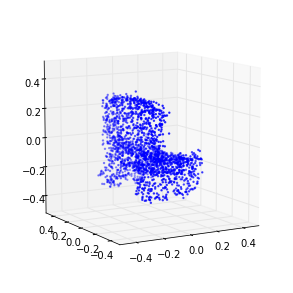

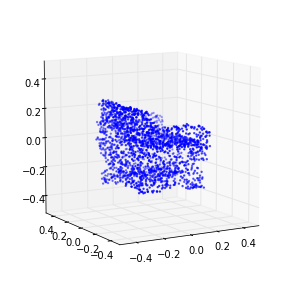

321 (-0.22757513335457555, -0.1186518108955136)
322 (-0.22510641890543479, -0.10337660930774829)
323 (-0.22608390836804002, -0.082667055919214527)
324 (-0.22394907750465251, -0.10392451714034434)
325 (-0.22333614671671831, -0.096391464549082304)
326 (-0.22497714051493892, -0.10347377481283965)
327 (-0.22263157224213637, -0.082920597383269554)
328 (-0.22515316815287978, -0.097317651880008196)
329 (-0.22543912110505282, -0.092455504117188628)
330 (-0.22327195163126345, -0.08899220396523122)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


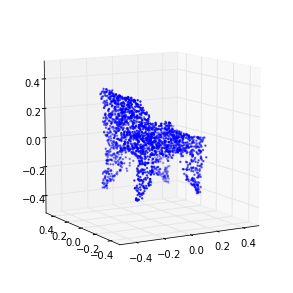

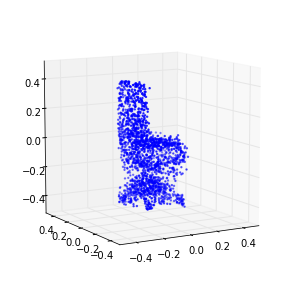

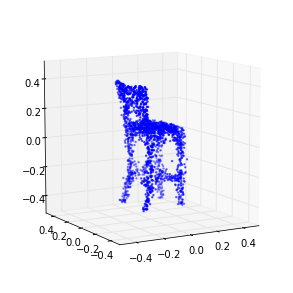

331 (-0.22574307730904333, -0.093812007319044183)
332 (-0.22685692343446945, -0.087631050221346041)
333 (-0.22838932341999477, -0.094776562932464808)
334 (-0.22803678170398431, -0.095826021361130262)
335 (-0.22353021138244206, -0.098955906375690739)
336 (-0.22389495461075395, -0.08523529053976138)
337 (-0.22366652841921206, -0.10353086930182245)
338 (-0.2260448094871309, -0.092838295218017369)
339 (-0.22458256874923352, -0.08560836756670917)
340 (-0.22338879461641664, -0.089837799331656212)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


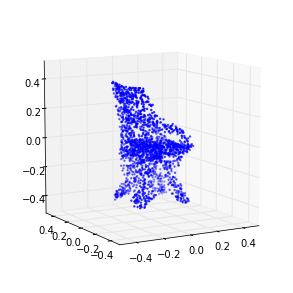

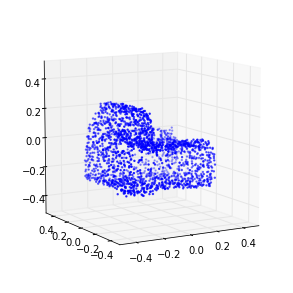

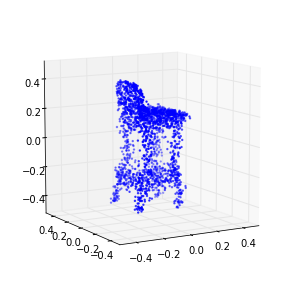

341 (-0.22584212411333013, -0.078431852851752887)
342 (-0.22549216714170245, -0.081385365928764691)
343 (-0.2259801270785155, -0.077298263639763554)
344 (-0.22564364086698602, -0.095239412867360651)
345 (-0.2241348840572216, -0.083086875094859694)
346 (-0.22440613309542337, -0.071962461289432317)
347 (-0.22309363440231042, -0.073006471274075682)
348 (-0.22536231224183684, -0.067033128881895984)
349 (-0.22793995925673732, -0.079096780365539923)
350 (-0.22473023533821107, -0.079881434915242369)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


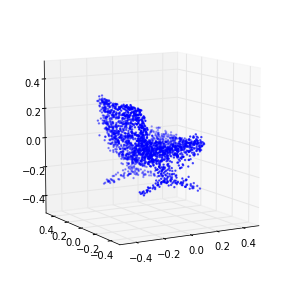

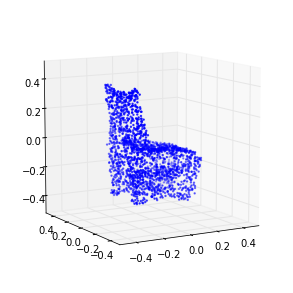

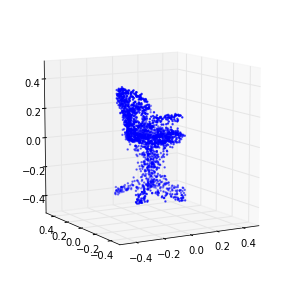

351 (-0.2253720556144361, -0.073677460628527189)
352 (-0.22599470968599672, -0.068407932434369018)
353 (-0.22435839739110736, -0.069609659137549226)
354 (-0.22717625002066294, -0.059511558238968802)
355 (-0.2253810613243668, -0.070439414259184291)
356 (-0.22629863255553775, -0.081817184471421778)
357 (-0.22098794480164846, -0.062184713849866832)
358 (-0.22435785200860764, -0.0744467843323946)
359 (-0.22629115989914647, -0.071212941918660094)
360 (-0.22551419745992732, -0.068242696044897591)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


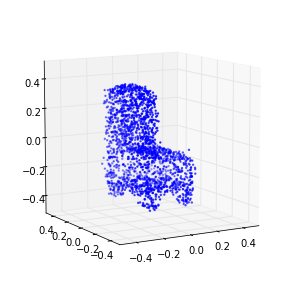

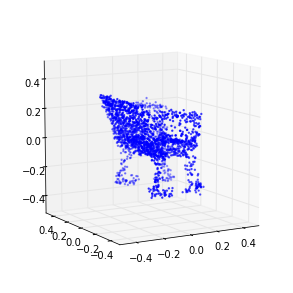

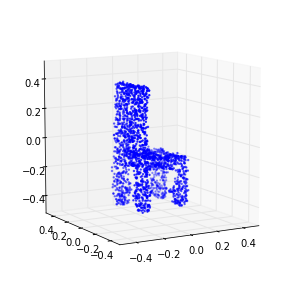

361 (-0.22558509111404418, -0.067800997859901846)
362 (-0.22352514112437213, -0.071259749984299695)
363 (-0.22392086695741725, -0.062240831140014857)
364 (-0.2255251301659478, -0.056894980991880097)
365 (-0.22253342072168986, -0.045161829088573101)
366 (-0.2201443561801204, -0.066696165267516067)
367 (-0.22325379406964338, -0.056882195588615209)
368 (-0.22674070596694945, -0.046840474630395569)
369 (-0.22437751249030785, -0.041803124826401472)
370 (-0.22708171319078516, -0.049519260206984148)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


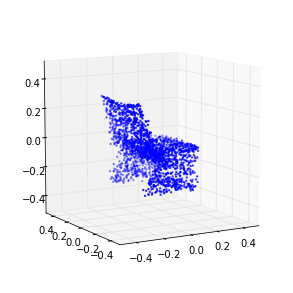

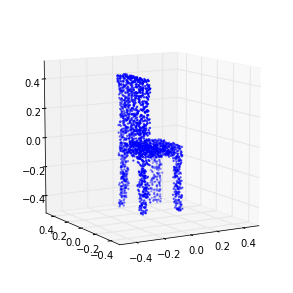

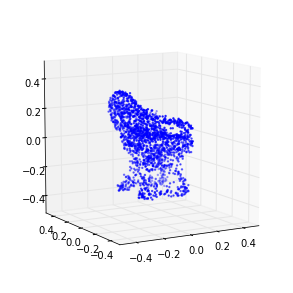

371 (-0.22533841442178798, -0.041744320204964387)
372 (-0.22512680071371574, -0.047837149351835251)
373 (-0.22344934432594865, -0.048220285662898314)
374 (-0.22528891740021884, -0.043291954979024549)
375 (-0.2273816449774636, -0.048362158756289214)
376 (-0.22540365269890539, -0.044571825932642375)
377 (-0.22418556605224257, -0.053977872607194714)
378 (-0.22502498284534173, -0.049367930326196879)
379 (-0.22741117532606478, -0.045550725991941161)
380 (-0.2259442788583261, -0.044795529830648946)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


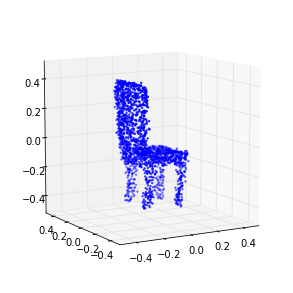

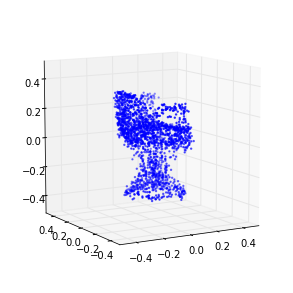

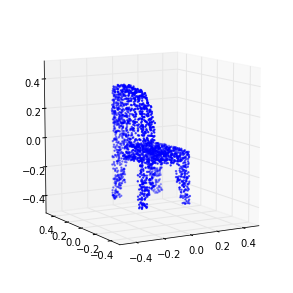

381 (-0.22544256691579465, -0.041613424196839333)
382 (-0.22661465925199015, -0.04370464222436702)
383 (-0.22204436251410731, -0.042100895679107415)
384 (-0.22529755212642527, -0.044555107821468952)
385 (-0.22318145003583695, -0.046638370353590558)
386 (-0.22667396984718463, -0.044302370571703824)
387 (-0.22528065487190529, -0.032149285405736278)
388 (-0.22425273767224066, -0.054625207316820266)
389 (-0.22899330721961128, -0.042048599260548748)
390 (-0.22305651726546111, -0.045493959656192198)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


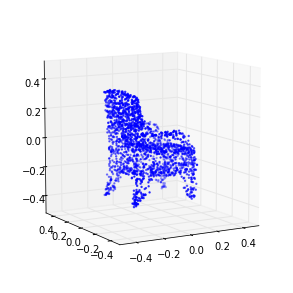

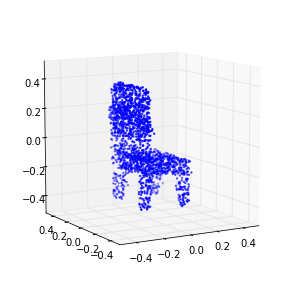

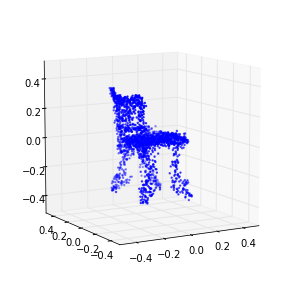

391 (-0.22611757660353626, -0.047880836124359456)
392 (-0.22532963046321161, -0.037780434100164309)
393 (-0.22541650621979326, -0.041749211028218269)
394 (-0.22500269114971161, -0.014777764255456903)
395 (-0.22561925837287197, -0.045297700497839183)
396 (-0.22526483094250715, -0.031725383329170721)
397 (-0.22466807266076405, -0.039143108262645977)
398 (-0.22686896975393647, -0.026611600519606361)
399 (-0.22439312449208013, -0.025055893791701506)
400 (-0.22462692889902328, -0.035005446851115535)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


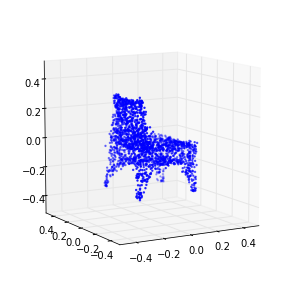

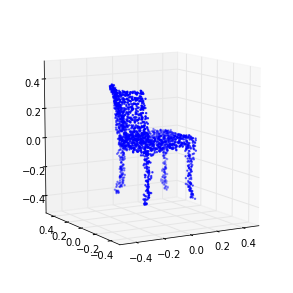

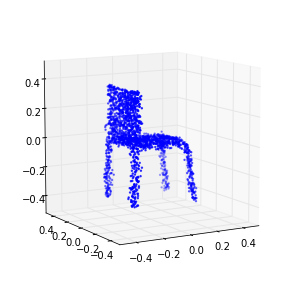

401 (-0.22519879539807638, -0.027144219105442364)
402 (-0.2241811168414575, -0.024147385024224168)
403 (-0.22431316762058823, -0.028730418688307207)
404 (-0.22557408688244995, -0.024673746683186403)
405 (-0.22576653151600448, -0.013876135805966678)
406 (-0.22481348006813615, -0.023533282629041759)
407 (-0.22544263777909457, -0.02692506960765631)
408 (-0.22306436521035652, -0.006926184865059676)
409 (-0.22216893219285541, -0.020101474080648687)
410 (-0.22700545666394412, -0.027917940790454548)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


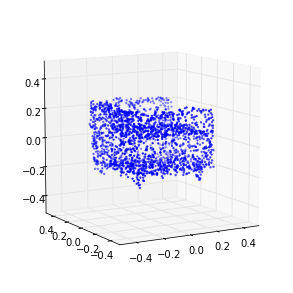

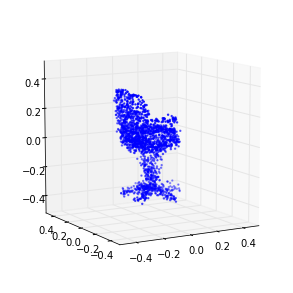

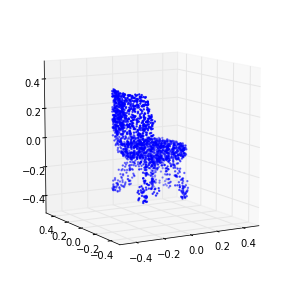

411 (-0.22546745748431593, -0.025490685219497041)
412 (-0.22250189461089948, -0.03061115934892937)
413 (-0.22355257912918372, -0.024561270157358161)
414 (-0.22683491165991182, -0.022379954129940382)
415 (-0.22555314136876001, -0.013739951273978309)
416 (-0.22573120450531994, -0.014190926673580651)
417 (-0.22495720750755735, -0.017159097914204554)
418 (-0.22283608692663687, -0.011979159623108528)
419 (-0.22535179124938118, -0.025913010825644487)
420 (-0.22412068468553048, -0.013392812744886786)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


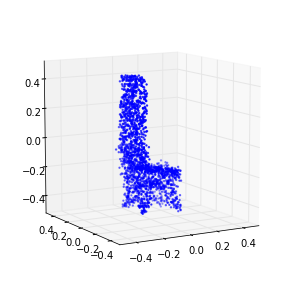

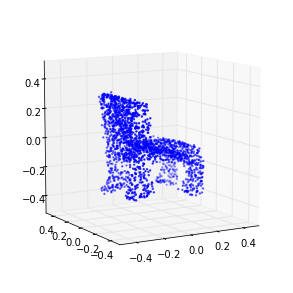

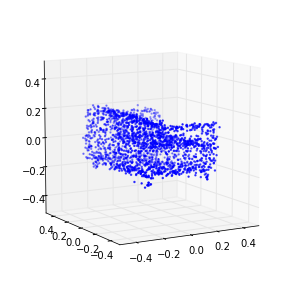

421 (-0.22439555923144022, -0.011528465646767506)
422 (-0.22406046169775504, -0.015253287740051746)
423 (-0.22162794294180693, -0.012228846067079791)
424 (-0.22362576888667213, -0.014254477952986403)
425 (-0.22512261955826371, -0.008531670180942726)
426 (-0.22512889482356885, -0.019744446061344609)
427 (-0.22105921551033303, -0.012546449485752318)
428 (-0.22606104424706211, -0.015484976858176567)
429 (-0.22611440453264448, -0.0082108055379379683)
430 (-0.22524301641517216, -0.008304413011366571)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


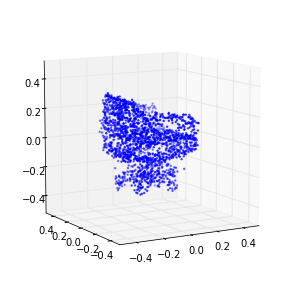

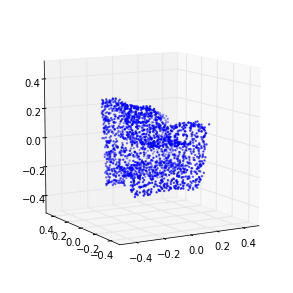

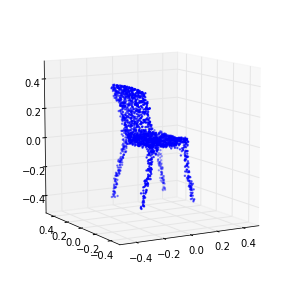

431 (-0.22351222236951193, -0.0093819758923793274)
432 (-0.2216966885107535, -0.017777546645245619)
433 (-0.22589882788834748, -0.0040886420066709875)
434 (-0.22460648296055971, -0.008271620125958213)
435 (-0.22492390241887833, -0.0051279500799460542)
436 (-0.22015659676657784, -0.0019629061808464706)
437 (-0.22471525834666359, -0.0068924684698383016)
438 (-0.22296884534535585, -0.0015330826346245077)
439 (-0.22558706314475449, -0.0001602720520976517)
440 (-0.22471307637514892, -0.013028649578767794)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


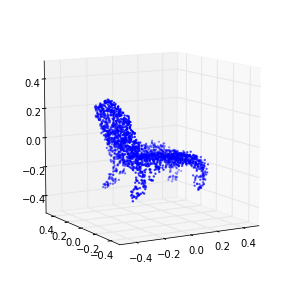

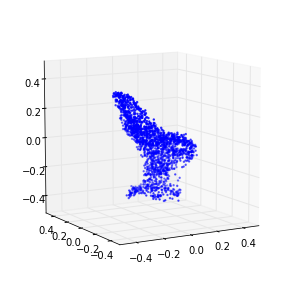

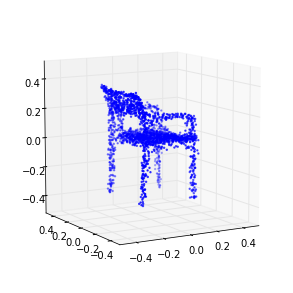

441 (-0.2260359642682252, -0.0054913282359915754)
442 (-0.22455876403384739, -0.0016404175182321557)
443 (-0.2230540457699034, -0.0025441109513243041)
444 (-0.22060035908663714, -0.0059917357370809273)
445 (-0.22343222973523316, -0.0023432020442905248)
446 (-0.22346838458820625, -0.0026597929773507297)
447 (-0.2227584273726852, 0.0028287742493881118)
448 (-0.22533153284479071, 0.01173069562625002)
449 (-0.22187472173461206, -0.0052286168405165272)
450 (-0.22076421909862096, 0.002719916661994325)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


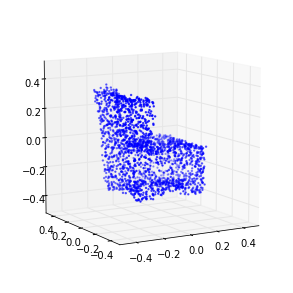

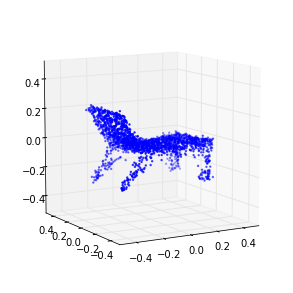

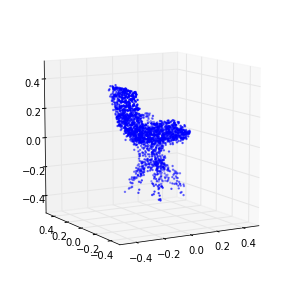

451 (-0.22378926233009055, 0.003512359948621856)
452 (-0.22473146220048268, -0.0043861789421902764)
453 (-0.22215054156603636, 0.016847023085035658)
454 (-0.22490009775868169, 0.013797568553989684)
455 (-0.22436769019674371, 0.012481826788711327)
456 (-0.22218540465390241, 0.00040971860720741526)
457 (-0.22479105238561278, 0.013939109742986384)
458 (-0.22219484547773996, 0.0081437644548714161)
459 (-0.2226828380867287, 0.011590612069186237)
460 (-0.22603206397206696, 0.022958538831315108)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


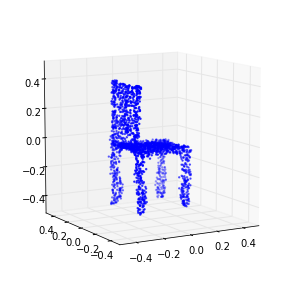

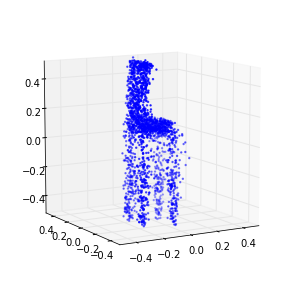

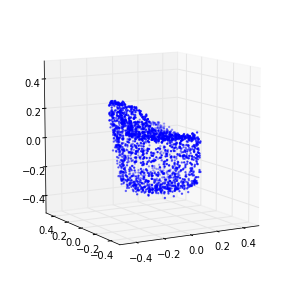

461 (-0.22269021846629955, 0.0060542852324606093)
462 (-0.22681162666391444, 0.0076922541915404579)
463 (-0.22310871095569046, -0.010487822833022586)
464 (-0.22459075495048805, 0.0034039704543020991)
465 (-0.22408155180789807, 0.0060983762420989849)
466 (-0.22205124806474758, 0.0047169273926152121)
467 (-0.22306132934711598, 0.022272974209584021)
468 (-0.2247049632999632, 0.0077597551151282257)
469 (-0.22348434560828739, 0.015855811863999675)
470 (-0.22428726377310576, 0.0094849949409426364)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


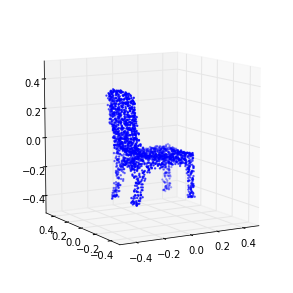

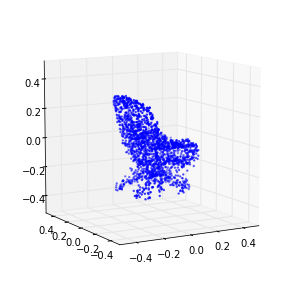

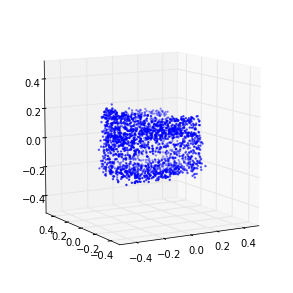

471 (-0.22580000912701642, 0.016460316255688667)
472 (-0.22439056800471413, 0.0085054765696878781)
473 (-0.22470721690743059, 0.017055397801515128)
474 (-0.22294623112237011, 0.017037029921387632)
475 (-0.22063128705377932, 0.028236207052099484)
476 (-0.2211048173683661, 0.020440334583529167)
477 (-0.22757865731362945, -0.0082031135981971461)
478 (-0.22310189538531833, 0.030409995742418146)
479 (-0.22301509203734221, 0.011632501923789581)
480 (-0.22267087996006013, 0.012430383202930292)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


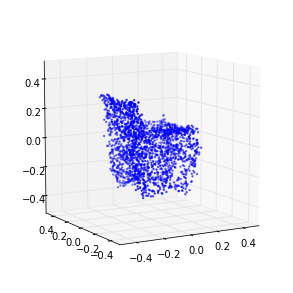

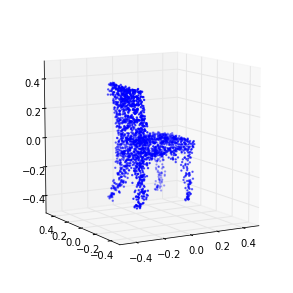

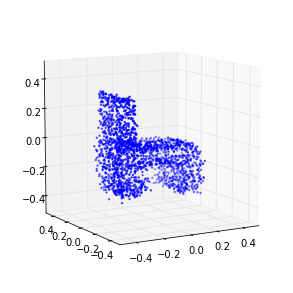

481 (-0.22428010514488927, 0.0093524113159488744)
482 (-0.22461989102540192, -6.2172378723820046e-05)
483 (-0.223465927000399, 0.014055078374911789)
484 (-0.22554411236886626, 0.016824582608899585)
485 (-0.22248365018102859, 0.021725641908469023)
486 (-0.22053453392452663, 0.010987561221958863)
487 (-0.22415066328313615, 0.033231627463397605)
488 (-0.22420910618923329, 0.019559695247422765)
489 (-0.22178239645781339, 0.01799322166307657)
490 (-0.22248614562882318, 0.016097305497775476)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


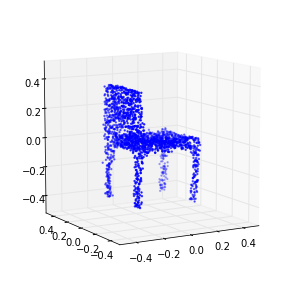

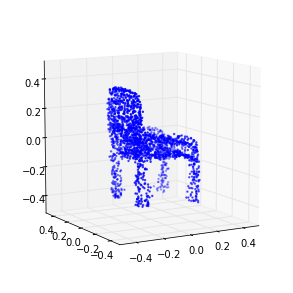

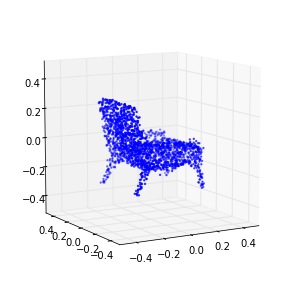

491 (-0.22369051509433321, 0.025927769882535492)
492 (-0.22359423670503828, 0.03790313283119489)
493 (-0.2264961740484944, 0.038878973849393705)
494 (-0.22445781175737028, 0.023922567393768718)
495 (-0.22294786053675192, 0.025244754273444414)
496 (-0.22021280814100194, 0.032569157925468904)
497 (-0.22564236455493503, 0.022602766700502899)
498 (-0.22506272119504434, 0.012118147185969132)
499 (-0.22163225224724523, 0.031750992492393208)
500 (-0.22255523701508839, 0.019001191982102615)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


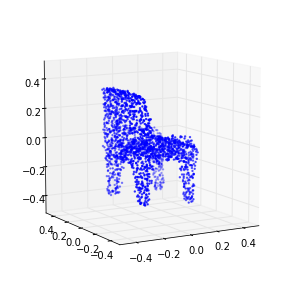

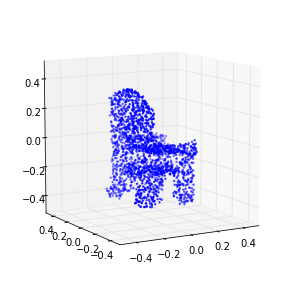

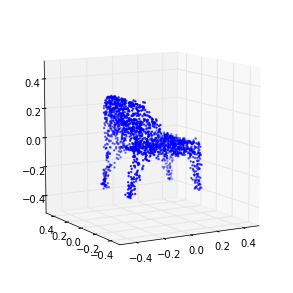

501 (-0.22210519567683892, 0.042204789972553648)
502 (-0.22368369345311764, 0.036374920737688186)
503 (-0.22356287936369579, 0.024332179187762516)
504 (-0.22553012823617016, 0.035284234193602097)
505 (-0.21980092713126428, 0.031060277587837644)
506 (-0.21929331819216411, 0.043084838427603245)
507 (-0.22577010757393307, 0.025819440355041513)
508 (-0.22528254069663861, 0.041075628940705898)
509 (-0.22175166441334618, 0.036228995770215988)
510 (-0.22182007862461939, 0.034008724304536976)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


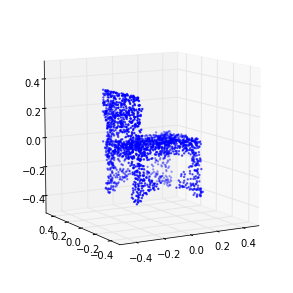

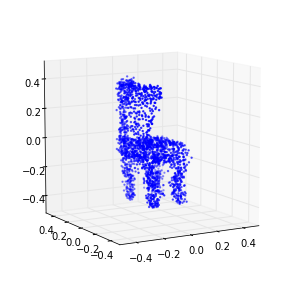

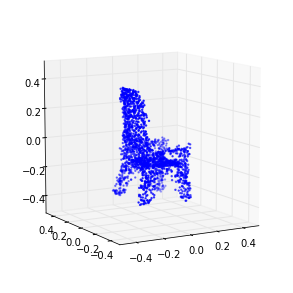

511 (-0.22387352089087167, 0.032690143842181121)
512 (-0.22419545771899047, 0.043422544237088273)
513 (-0.22232480832824, 0.041193656899310926)
514 (-0.22370748464707976, 0.03420541540685075)
515 (-0.22327217570057623, 0.037356513241926827)
516 (-0.22194318848627584, 0.045904098871957372)
517 (-0.2250337768484045, 0.050735628973968605)
518 (-0.2257752408583959, 0.040123488305619466)
519 (-0.22537992938801094, 0.046793440356850624)
520 (-0.22484941879908243, 0.052722642543139284)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


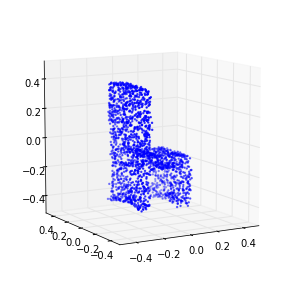

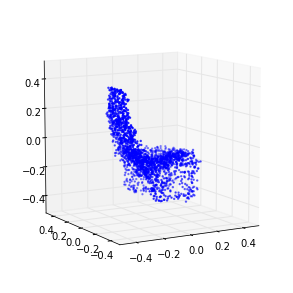

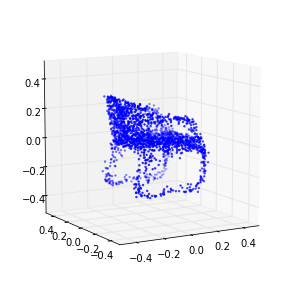

521 (-0.22505229987480022, 0.04427270879279132)
522 (-0.22768566144837274, 0.044265155835698046)
523 (-0.22631316262262838, 0.032877703404261008)
524 (-0.22230556309223176, 0.036707317577330048)
525 (-0.2224024655090438, 0.043831506795767278)
526 (-0.22359031836191814, 0.043123646915234903)
527 (-0.22570860628728515, 0.053753664958532212)
528 (-0.22314534099013716, 0.038640849878666575)
529 (-0.22479644307383784, 0.042858865491493987)
530 (-0.22480217538498065, 0.050629780041398828)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


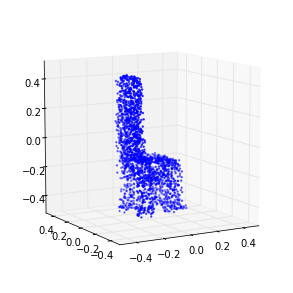

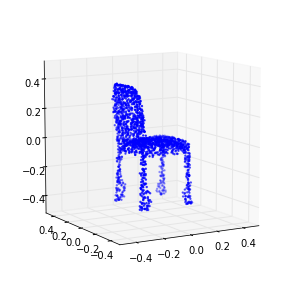

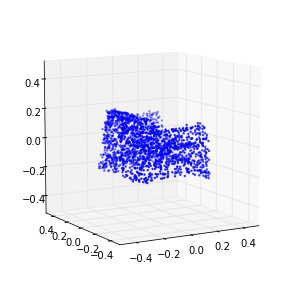

531 (-0.22552780486919261, 0.046265356863538422)
532 (-0.22587047208238531, 0.045561505740301475)
533 (-0.22463537255922952, 0.057048574279717823)
534 (-0.22155549526214599, 0.039512240672828977)
535 (-0.22343588372071585, 0.055557452487172906)
536 (-0.22100959707189488, 0.060111404224126426)
537 (-0.22311785795070507, 0.042759504626263621)
538 (-0.22615036158650009, 0.053991966432443368)
539 (-0.22230078842904832, 0.048976066073885667)
540 (-0.22140192709587239, 0.053626833690537348)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


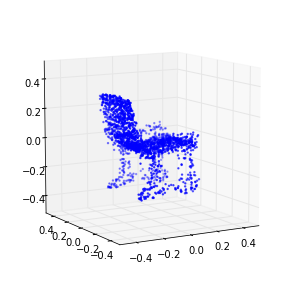

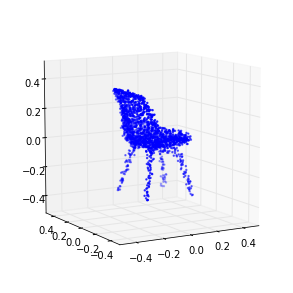

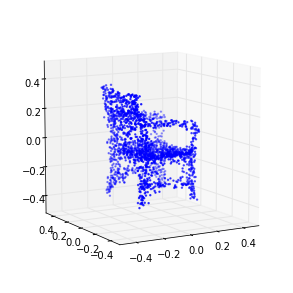

541 (-0.22260528670416938, 0.057421386931781414)
542 (-0.22627893057134416, 0.050418878043139423)
543 (-0.2244129051764806, 0.046264593317000953)
544 (-0.22578363164707466, 0.060838257342025089)
545 (-0.22487292499453934, 0.056670680780101707)
546 (-0.22290371634342052, 0.061358795811732612)
547 (-0.22562701348905209, 0.062151714055626479)
548 (-0.22272363801797232, 0.057292143503824867)
549 (-0.22197554564034497, 0.046363303610296162)
550 (-0.22193233735031551, 0.055520242149079288)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


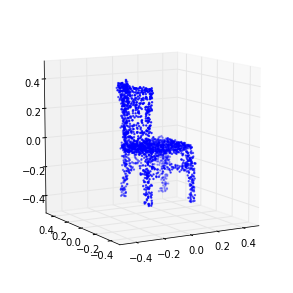

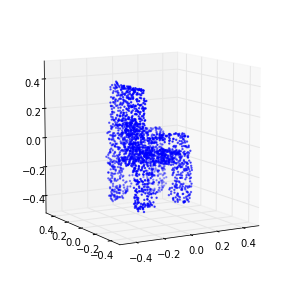

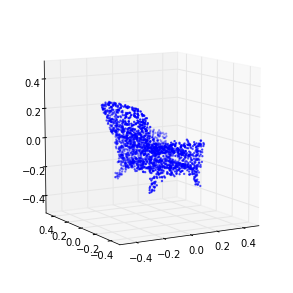

551 (-0.22395310137006971, 0.059746285279591881)
552 (-0.22419091485164783, 0.058638199456725958)
553 (-0.22362063339462987, 0.068134228112520998)
554 (-0.22200308629760035, 0.06579147120592771)
555 (-0.22140420918111448, 0.068190380344512289)
556 (-0.22415502159683792, 0.079502878089745835)
557 (-0.22143388081479956, 0.084250731738629167)
558 (-0.22290029680287396, 0.071555188615564952)
559 (-0.22439125434116081, 0.06747665794359313)
560 (-0.22523643826996839, 0.074972169784208134)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


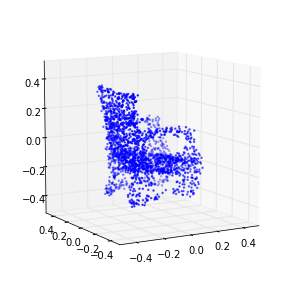

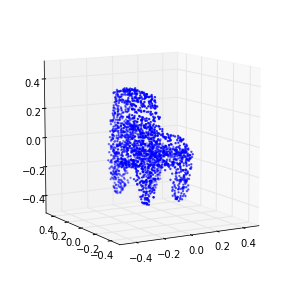

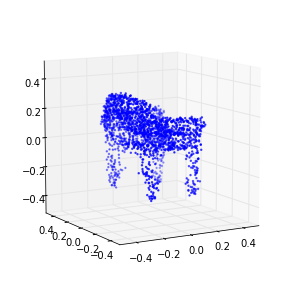

561 (-0.22522878801381147, 0.069190066031835695)
562 (-0.22065020716852612, 0.065394848516141926)
563 (-0.22297370798057981, 0.067466762123836413)
564 (-0.22120761418784107, 0.075810748531862537)
565 (-0.22531235295313376, 0.083614686021098381)
566 (-0.22387359329947717, 0.079605662022475848)
567 (-0.22560937702655792, 0.069948193099763661)
568 (-0.22278282178772821, 0.074985829009502028)
569 (-0.22308328504915589, 0.070738517265352935)
570 (-0.22299720291738157, 0.072638291865587234)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


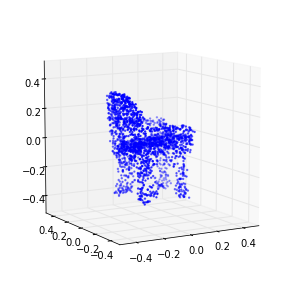

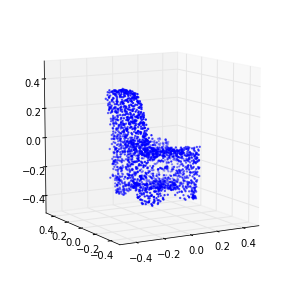

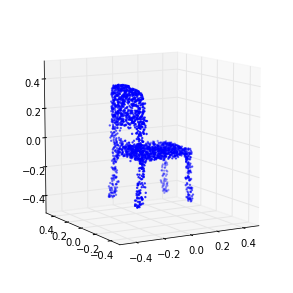

571 (-0.2227698696984185, 0.079940377700108076)
572 (-0.22235373402083361, 0.069048493824623247)
573 (-0.22186178200774723, 0.077625390004228662)
574 (-0.2217688156498803, 0.082087978306743831)
575 (-0.22292871751167156, 0.079296572202885593)
576 (-0.22644035959685291, 0.07929417539249968)
577 (-0.2227602512748153, 0.07504216650569881)
578 (-0.22497822730629533, 0.083483080552132036)
579 (-0.22341997678633088, 0.076159820650462756)
580 (-0.22258336786870603, 0.0766020782843784)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


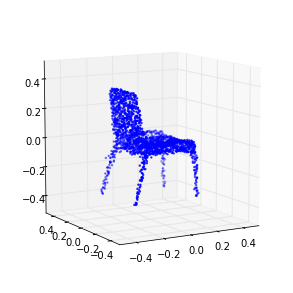

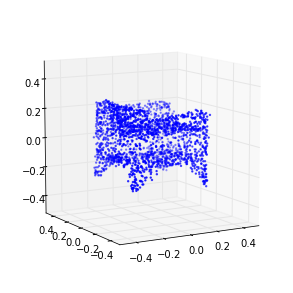

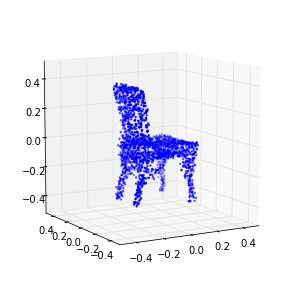

581 (-0.22517948702529625, 0.085728428981922289)
582 (-0.21955501989082055, 0.082013608404883628)
583 (-0.22469121747546725, 0.081201062572223162)
584 (-0.22400655216640897, 0.081751207096709147)
585 (-0.22345118809629369, 0.081072350481042152)
586 (-0.22176835338274639, 0.089349281318761686)
587 (-0.22138095431857638, 0.086182771871487304)
588 (-0.22205539522347628, 0.094027039077546865)
589 (-0.22241645367057236, 0.086339528775877417)
590 (-0.22293680950447364, 0.09559104274268504)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


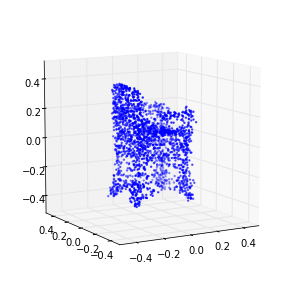

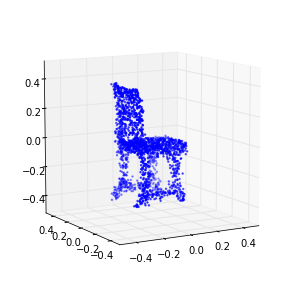

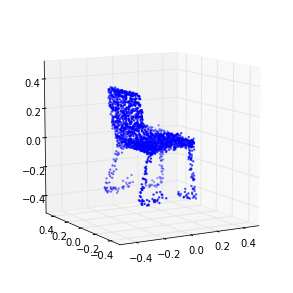

591 (-0.22276200464478246, 0.086952577310579801)
592 (-0.22187243015677841, 0.083055393425402815)
593 (-0.22307493145819063, 0.095733315718394732)
594 (-0.22306830320093368, 0.086444623906303336)
595 (-0.2214525149928199, 0.090001975910531148)
596 (-0.22357111551143505, 0.079275187104940414)
597 (-0.22340257211967751, 0.087882946210878873)
598 (-0.22359680897659726, 0.087140674392382308)
599 (-0.22417855671158543, 0.099108765384665246)
600 (-0.22072014654124225, 0.080516438379331867)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


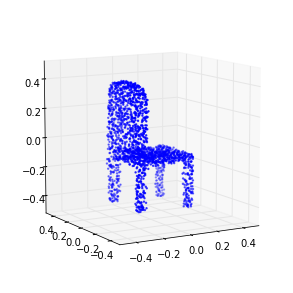

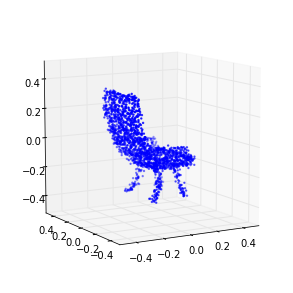

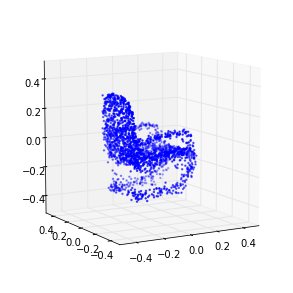

601 (-0.22379141173980854, 0.090498377465539515)
602 (-0.22398479514651828, 0.092187161108961815)
603 (-0.22036507416654516, 0.08688910940179119)
604 (-0.22170569598674775, 0.10236495967816424)
605 (-0.22318941972873829, 0.084960422030201668)
606 (-0.22199766050886224, 0.11864346734903476)
607 (-0.22345361157699867, 0.10916960639534173)
608 (-0.22351294336495575, 0.098829321287296434)
609 (-0.22388188287063882, 0.10702018922677746)
610 (-0.22085755081088454, 0.10374150232032493)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


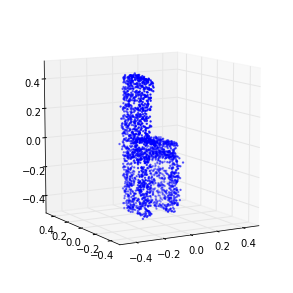

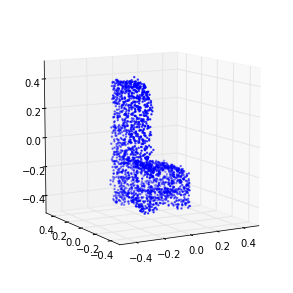

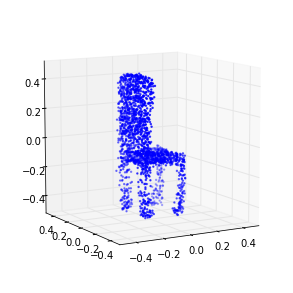

611 (-0.22051673421153314, 0.099475640389654368)
612 (-0.22142388489511278, 0.099190326200591192)
613 (-0.2203225792558105, 0.10530025649953771)
614 (-0.221788736405196, 0.11259614648642363)
615 (-0.2210712460456071, 0.10437995664499423)
616 (-0.22052580294785676, 0.10203306238960337)
617 (-0.22094334661960602, 0.10956155398377666)
618 (-0.21984051653632411, 0.10044462537323987)
619 (-0.22415291998121473, 0.10391679102623905)
620 (-0.22353624403476716, 0.10755679038939653)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


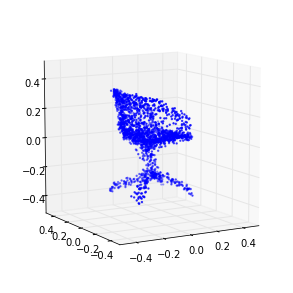

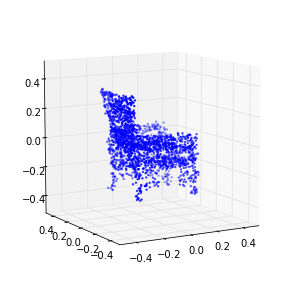

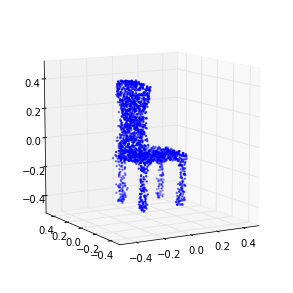

621 (-0.22297053326059271, 0.11729208876689275)
622 (-0.22588631025067082, 0.11190132465627459)
623 (-0.22153827095473255, 0.10860446564577243)
624 (-0.2213397710411637, 0.10474918189424055)
625 (-0.22326446705394321, 0.11305889735619228)
626 (-0.21910471276000695, 0.10636828232694555)
627 (-0.22455381088786655, 0.11695599528374495)
628 (-0.22215436685968329, 0.11464711747787616)
629 (-0.22255797055032517, 0.11240253487118969)
630 (-0.22176199400866473, 0.11195518186798802)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


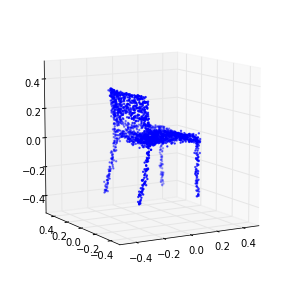

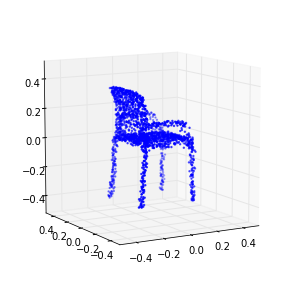

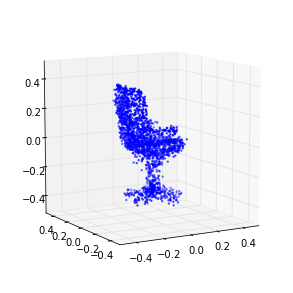

631 (-0.22333857582675087, 0.11725436123432936)
632 (-0.22418648015569759, 0.11294886414651517)
633 (-0.2230390187766817, 0.10763665675013154)
634 (-0.2214157552630813, 0.12366501269517122)
635 (-0.22326360245545704, 0.12268354881692815)
636 (-0.222118510361071, 0.11760545163242905)
637 (-0.22338003461007719, 0.12284021934977284)
638 (-0.22270329925749038, 0.1184908030209718)
639 (-0.21666175402976848, 0.12915541259226976)
640 (-0.22453614672025043, 0.12909284234046936)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


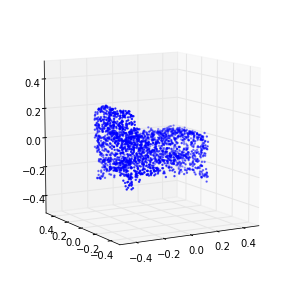

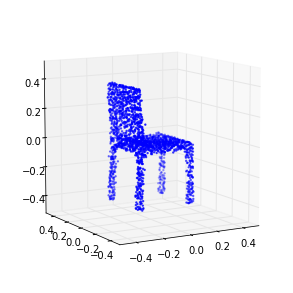

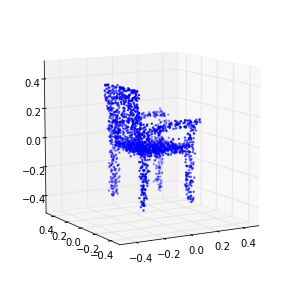

641 (-0.22320713544333423, 0.12229823762619937)
642 (-0.21887502361226965, 0.11757664078915561)
643 (-0.22151124753333903, 0.13253097318940693)
644 (-0.22218728054452824, 0.13290837048380463)
645 (-0.22047216660446592, 0.12609033093408303)
646 (-0.22001705787799977, 0.11854192586960616)
647 (-0.22106989390320247, 0.13976361133434154)
648 (-0.22164108510370609, 0.12112611918537705)
649 (-0.2218022076068101, 0.12920645403641243)
650 (-0.22245624738710898, 0.11276626393750862)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


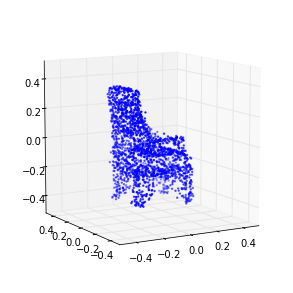

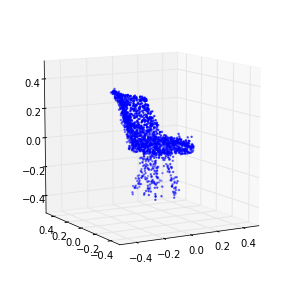

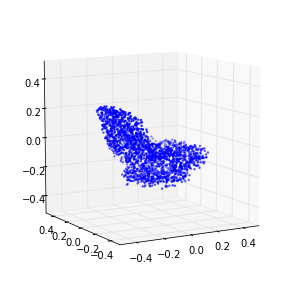

651 (-0.22119799863409112, 0.12911663839110621)
652 (-0.22031021934968453, 0.13371817850404316)
653 (-0.22049596773253546, 0.12747236368832765)
654 (-0.22295611699422199, 0.1370774637217875)
655 (-0.22256094294565695, 0.13085080876394553)
656 (-0.220991325268039, 0.13720877882507113)
657 (-0.22223301927248637, 0.12700900242284494)
658 (-0.22279583436471445, 0.14543348219659594)
659 (-0.21755834740621072, 0.1386687101589309)
660 (-0.22124344253981554, 0.1365358484564004)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


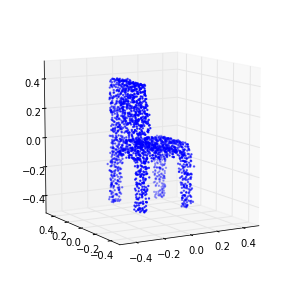

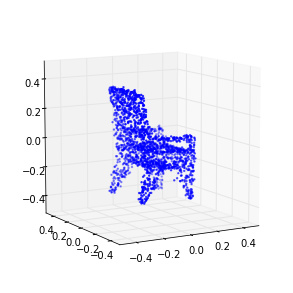

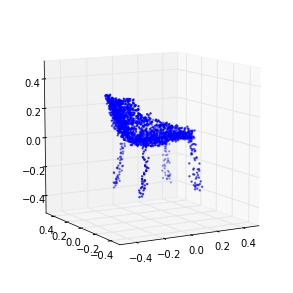

661 (-0.22029941104076528, 0.13410776025719112)
662 (-0.22074216504891714, 0.13270162928987433)
663 (-0.22152939858259979, 0.13884364592808265)
664 (-0.21931312349107529, 0.13567156317057433)
665 (-0.22150362376813534, 0.13746608517788075)
666 (-0.21832463332900295, 0.1359316513494209)
667 (-0.21912681460380554, 0.13805981228748956)
668 (-0.22088624658407988, 0.14423376459766318)
669 (-0.22050210138161977, 0.13982188039355808)
670 (-0.2194382981017784, 0.14089245790684665)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


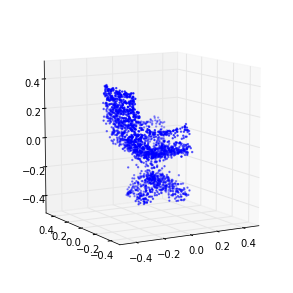

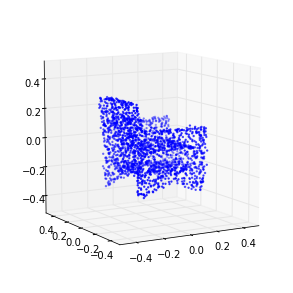

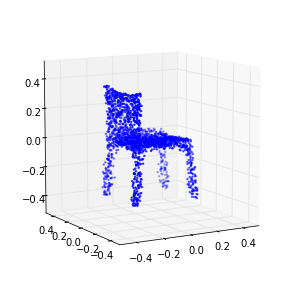

671 (-0.21877416736549801, 0.13972986268776436)
672 (-0.22251546482245127, 0.13751475430197185)
673 (-0.22044627401563857, 0.14084045368212242)
674 (-0.221223799166856, 0.14946898321310678)
675 (-0.21893384898150409, 0.14321270088354746)
676 (-0.22211642673722021, 0.14693957180888564)
677 (-0.21983021762635974, 0.12956120487716463)
678 (-0.22174282316808347, 0.14836001340989713)
679 (-0.22140919808988219, 0.14736755826958903)
680 (-0.22162945877622675, 0.15233320577277076)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


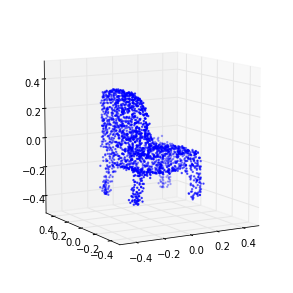

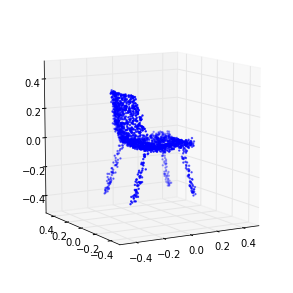

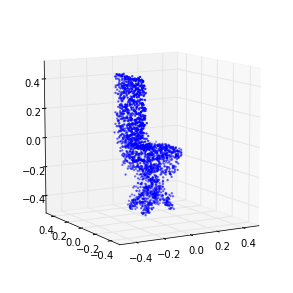

681 (-0.22466256486044989, 0.15433865978761954)
682 (-0.22482766707738241, 0.14561267224726854)
683 (-0.22239978788075623, 0.14136893992070798)
684 (-0.22148652738995023, 0.14508196518377023)
685 (-0.22056450325029867, 0.1546807454691993)
686 (-0.22448199490706125, 0.1522739295054365)
687 (-0.21926051091264795, 0.13833188099993599)
688 (-0.21925084204585463, 0.15043054852220747)
689 (-0.21796097369105727, 0.15358166562186348)
690 (-0.22013673142150597, 0.15530634312718003)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


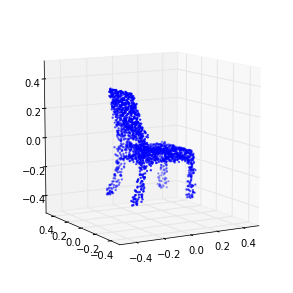

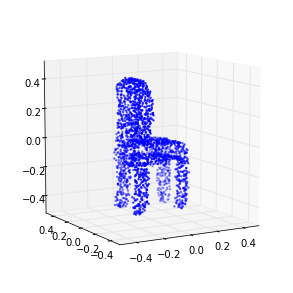

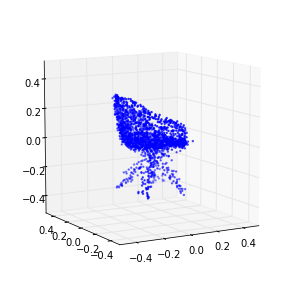

691 (-0.22264532932528744, 0.14357009171335786)
692 (-0.22094312950416847, 0.14308752643841285)
693 (-0.22213030645140894, 0.14074656394896684)
694 (-0.22032983921192312, 0.15368179949345412)
695 (-0.220195178632383, 0.15290006388116767)
696 (-0.22151144599473035, 0.15262141520226444)
697 (-0.22299749199990873, 0.1535892872898667)
698 (-0.22119079243253778, 0.15401153073266702)
699 (-0.22135554894253059, 0.16034646497832405)
700 (-0.21884229569523422, 0.14389607199916132)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


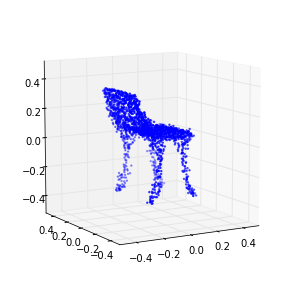

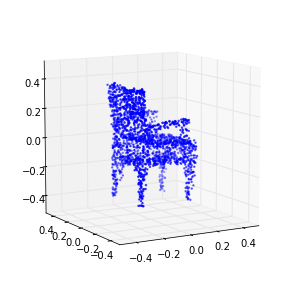

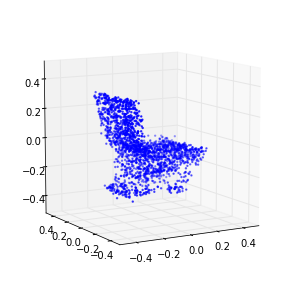

701 (-0.22338341993314248, 0.15620875965665887)
702 (-0.22098486147545002, 0.15278276028456511)
703 (-0.22011558225861302, 0.16605291791536189)
704 (-0.21796493419894467, 0.15415790207959987)
705 (-0.22176726052054652, 0.1609068438410759)
706 (-0.21979244594220762, 0.14824357821985526)
707 (-0.21903397153925014, 0.14785870137038054)
708 (-0.21961231408295809, 0.15100474931575633)
709 (-0.22173281455481494, 0.15482812457614475)
710 (-0.21941614393834716, 0.16232328558409656)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


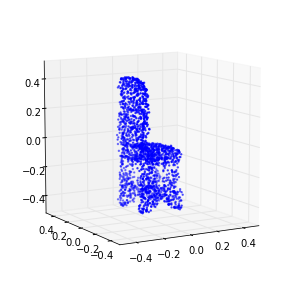

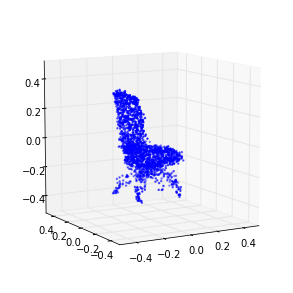

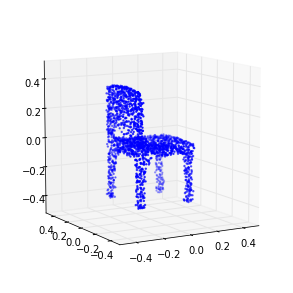

711 (-0.22212797072198656, 0.15719796717166901)
712 (-0.22144319381978778, 0.15441244178348118)
713 (-0.21960650031213408, 0.15214319803096629)
714 (-0.22036510705947876, 0.16018889430496427)
715 (-0.22185513807667626, 0.16058653593063354)
716 (-0.21842654579215579, 0.16977508642055369)
717 (-0.2197956496918643, 0.16557465107352645)
718 (-0.21818008919556936, 0.1572560496904232)
719 (-0.2216490078855444, 0.16356481611728668)
720 (-0.21941198574172127, 0.16991247071160209)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


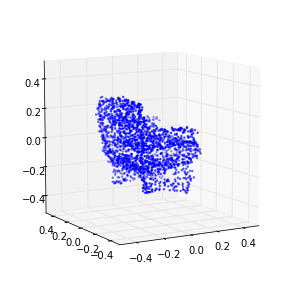

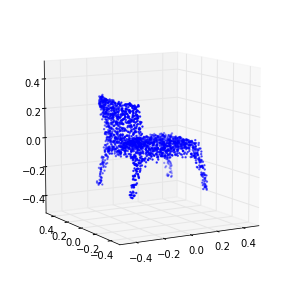

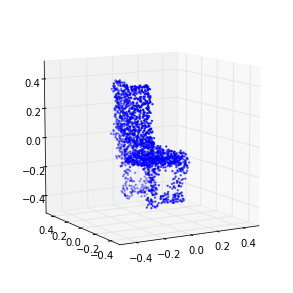

721 (-0.2206972214910719, 0.16849746693063666)
722 (-0.2179938906872714, 0.16643964140503495)
723 (-0.22147302649639272, 0.16607771482732561)
724 (-0.22079274157683054, 0.16347436827641945)
725 (-0.21800242629316119, 0.16768706010447609)
726 (-0.21999264370512078, 0.15841479985802262)
727 (-0.22016559364619079, 0.16375062200758192)
728 (-0.22111459021215085, 0.16547220283084446)
729 (-0.22006207296141872, 0.16471529282905437)
730 (-0.21927212013138664, 0.17147890119640916)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


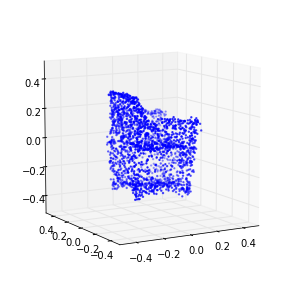

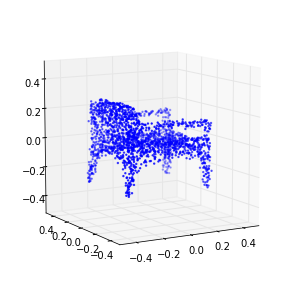

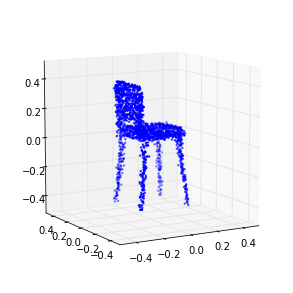

731 (-0.22177636844140511, 0.17258786686040736)
732 (-0.22385920264102793, 0.18087735937701332)
733 (-0.21964097023010254, 0.17011370206320728)
734 (-0.21905105290589511, 0.17589298884073892)
735 (-0.21923552221722073, 0.16953462583047371)
736 (-0.21879273343969274, 0.17002545131577385)
737 (-0.22391651372114818, 0.17980788206612622)
738 (-0.22293618851237826, 0.1765820797946718)
739 (-0.21893761930642305, 0.17765974115442346)
740 (-0.22203974315413721, 0.17876262466112772)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


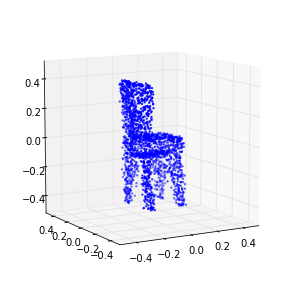

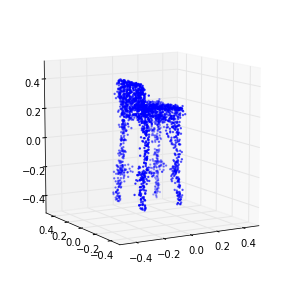

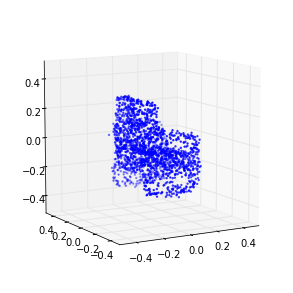

741 (-0.22024271399886519, 0.17629523796063881)
742 (-0.21752807619395079, 0.16798252750326087)
743 (-0.22069359819094339, 0.16460507556244178)
744 (-0.21918218246212712, 0.17245122790336609)
745 (-0.22304288579357995, 0.1732371187320462)
746 (-0.21978539835523675, 0.1787233849366506)
747 (-0.22201203814259282, 0.17419783771038055)
748 (-0.21806466568399357, 0.17264858440116601)
749 (-0.21811530402413121, 0.18091719901120221)
750 (-0.22199685937828487, 0.178086977314066)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


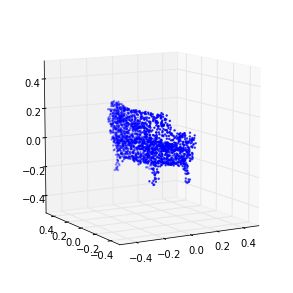

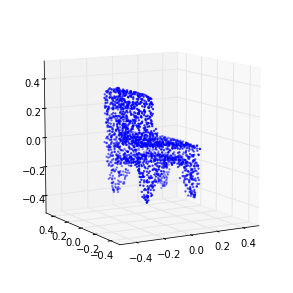

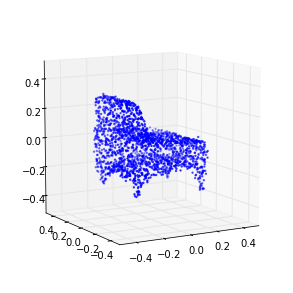

751 (-0.22004341483116149, 0.16386683174857386)
752 (-0.21882565727940312, 0.18266882775006471)
753 (-0.21923719445864359, 0.17584479682975346)
754 (-0.22214592286834009, 0.16994161903858185)
755 (-0.2207072995327137, 0.1876468437689322)
756 (-0.22308632025012262, 0.17619717617829642)
757 (-0.22079560635266482, 0.18525116255989782)
758 (-0.22003512537037884, 0.17967467451537097)
759 (-0.22275844271536227, 0.18294091081177746)
760 (-0.2176685122428117, 0.18533923504529176)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


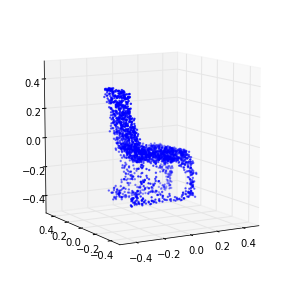

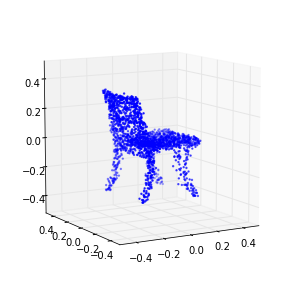

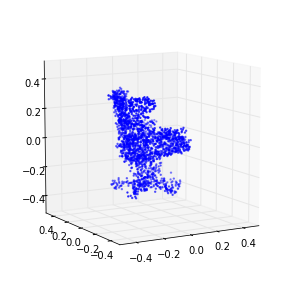

761 (-0.2242229578671632, 0.17719643535437407)
762 (-0.22153085072835285, 0.16644713392964117)
763 (-0.22019504959936495, 0.17600886247776173)
764 (-0.22381052871545157, 0.16969323930916963)
765 (-0.21947202362396098, 0.18028801789990179)
766 (-0.22226840445288906, 0.17418240231496315)
767 (-0.22314768411495067, 0.18621334102418688)
768 (-0.22103337623454905, 0.16888302371457772)
769 (-0.22193725627881508, 0.18521609129729094)
770 (-0.22007982156894826, 0.17582881505842562)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


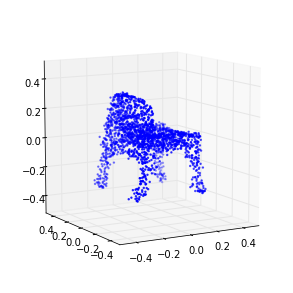

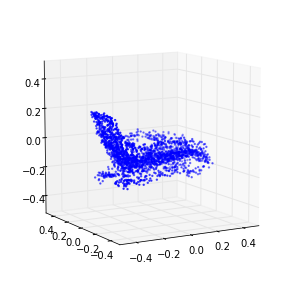

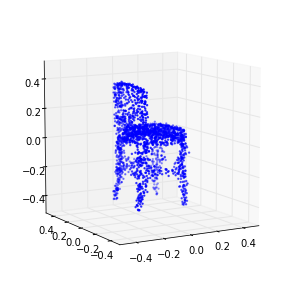

771 (-0.21913222333899252, 0.17319679260253906)
772 (-0.22008190894568408, 0.17879268140704543)
773 (-0.22073606694186176, 0.1967209251942458)
774 (-0.21957468368388988, 0.17337511038338696)
775 (-0.21870609135539443, 0.17279846855887659)
776 (-0.22144462598694695, 0.16820766142121069)
777 (-0.21822619769308302, 0.17791541748576695)
778 (-0.22241748637623257, 0.17244271216569124)
779 (-0.22119421484293761, 0.17821634257281269)
780 (-0.22116881156409229, 0.18020716585494853)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


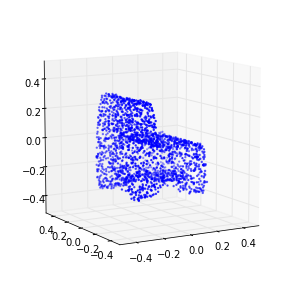

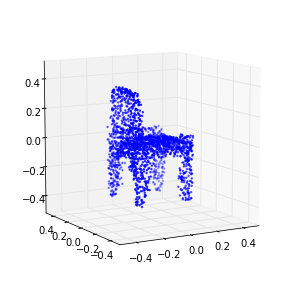

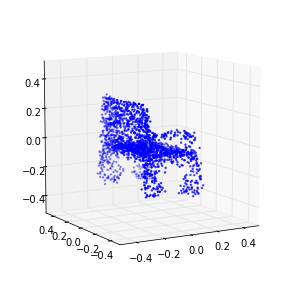

781 (-0.22055422255286464, 0.17961483503933307)
782 (-0.21972159688119536, 0.18552384470348005)
783 (-0.21859187759734966, 0.17950464895478002)
784 (-0.22113889279188934, 0.18157262437873417)
785 (-0.2194769255540989, 0.18204343098181267)
786 (-0.22012959597287354, 0.19182447150901513)
787 (-0.21685416775721092, 0.17770158251126608)
788 (-0.21858620478047264, 0.18160961899492475)
789 (-0.21714800938411996, 0.18562426831987169)
790 (-0.21792091053945048, 0.18228066629833645)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


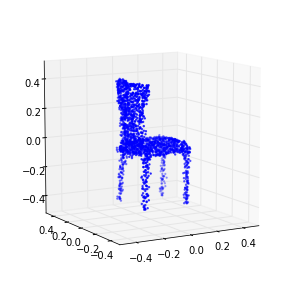

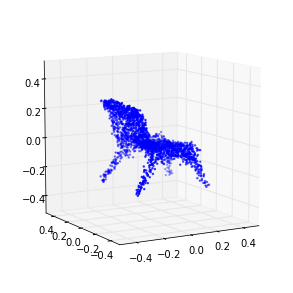

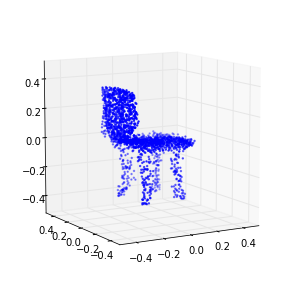

791 (-0.22025655894367782, 0.18279810194615964)
792 (-0.22020734669985595, 0.17694751035284112)
793 (-0.22033651802274917, 0.18957587303938689)
794 (-0.21952939452948395, 0.17166769449357633)
795 (-0.21864359478155773, 0.18161540616441657)
796 (-0.21897455122735765, 0.18149915282373075)
797 (-0.21956285779122953, 0.18597978905395227)
798 (-0.21776151502573932, 0.19146563333493691)
799 (-0.21793515373159339, 0.17506358027458191)
800 (-0.223430832778966, 0.18061350010059499)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


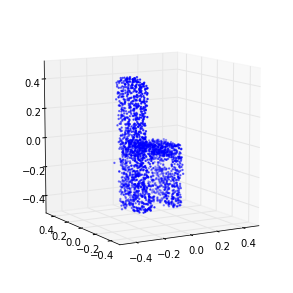

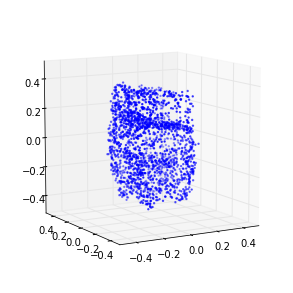

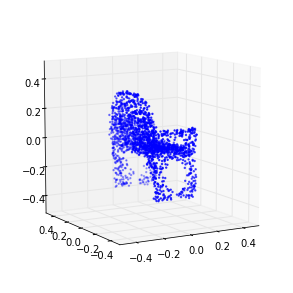

801 (-0.21885287430551317, 0.19223219652970633)
802 (-0.22226208989266996, 0.18721300611893335)
803 (-0.22143728324660547, 0.18314163524795463)
804 (-0.21813063958176859, 0.18387546693837201)
805 (-0.22072276649651704, 0.19296409907164397)
806 (-0.21916792282351741, 0.18712913769262809)
807 (-0.21871548692385356, 0.181641920849129)
808 (-0.21987167376059072, 0.18966728393678312)
809 (-0.2191739743506467, 0.19442702885027285)
810 (-0.21989114869523932, 0.19315110229783589)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


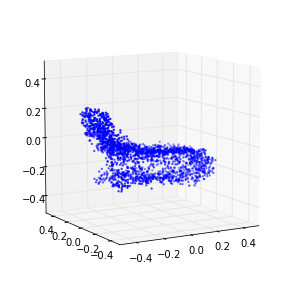

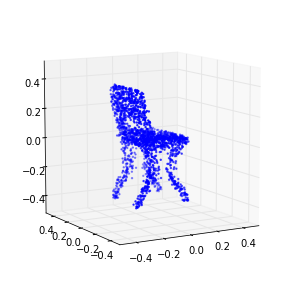

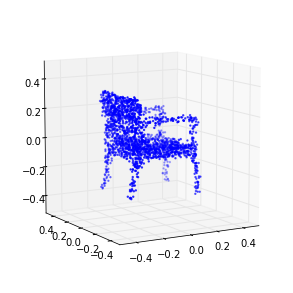

811 (-0.22276260466487319, 0.18566707218134845)
812 (-0.21764104874045762, 0.19377609921826255)
813 (-0.22042672910072186, 0.18871663565988894)
814 (-0.21975341119148112, 0.19287011303283549)
815 (-0.21869568703351197, 0.18300419162820886)
816 (-0.21876415268138602, 0.19152789259398426)
817 (-0.22130056001521922, 0.19166815887998651)
818 (-0.22031557681383909, 0.19583957504343102)
819 (-0.21695048533104083, 0.2018911314231378)
820 (-0.22203673896966158, 0.18558268028276939)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


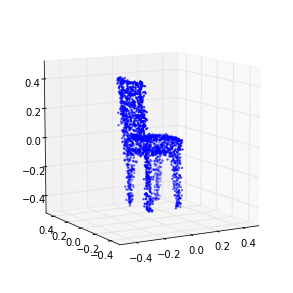

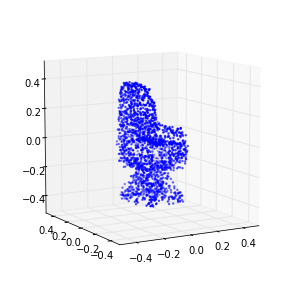

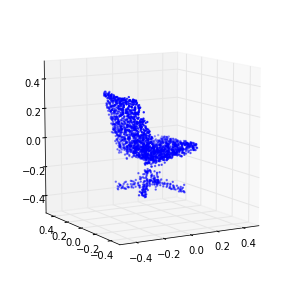

821 (-0.21914273798465728, 0.1880062007241779)
822 (-0.22096552241731574, 0.18859929784580512)
823 (-0.22001215120156606, 0.19888903697331747)
824 (-0.21920684322162912, 0.2108883681120696)
825 (-0.21778094205591414, 0.20085686555615179)
826 (-0.22023231613415259, 0.18351050107567399)
827 (-0.21933962702751159, 0.20129529800679949)
828 (-0.21844328851611525, 0.18243340320057339)
829 (-0.21864500685974403, 0.18958831826845804)
830 (-0.21909796253398614, 0.19748514228396946)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


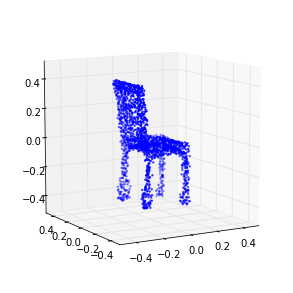

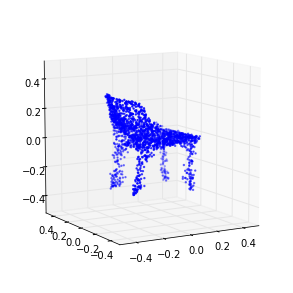

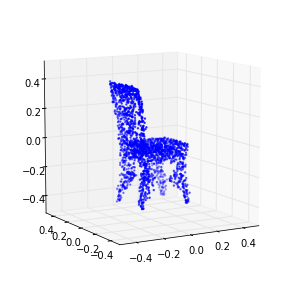

831 (-0.21756126593660424, 0.19676201707786983)
832 (-0.21869717295523042, 0.19472239470040356)
833 (-0.217358832999512, 0.19604772439709417)
834 (-0.21686547818007293, 0.19943535714237778)
835 (-0.22002506134686647, 0.19409510217331075)
836 (-0.21779228261223546, 0.19429898427592385)
837 (-0.22044864848808007, 0.20440221991803911)
838 (-0.21919137570593092, 0.18850435150994194)
839 (-0.2221010113203967, 0.1925060616599189)
840 (-0.22007087645707307, 0.19696778224574196)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


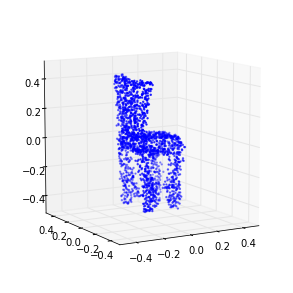

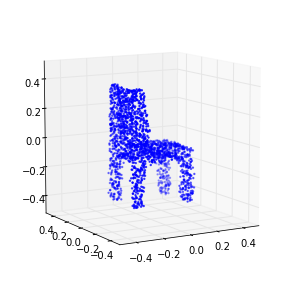

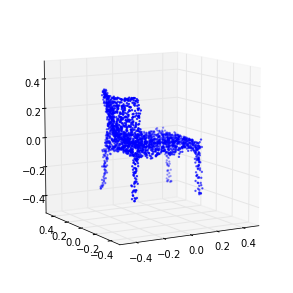

841 (-0.21989925912132971, 0.19872025869510793)
842 (-0.21921521038920791, 0.19239725338088143)
843 (-0.21956824682377002, 0.20586139460404715)
844 (-0.22073373717290384, 0.20168844251720994)
845 (-0.22191215698365813, 0.20309764422752238)
846 (-0.21694562446188043, 0.2002168877257241)
847 (-0.21869559619161819, 0.19659758773114946)
848 (-0.22080106724191595, 0.20196447438663906)
849 (-0.22083243087485985, 0.20204689657246624)
850 (-0.21962984358822857, 0.19762022903671972)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


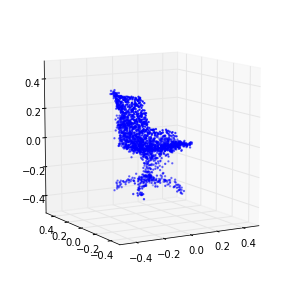

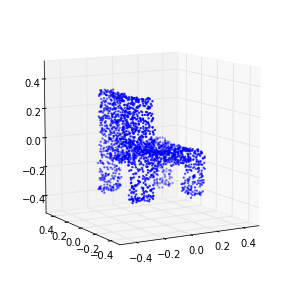

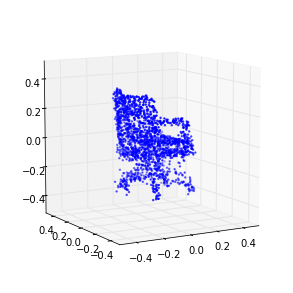

851 (-0.2183645294772254, 0.19858675201733908)
852 (-0.21932199464903937, 0.19454957434424647)
853 (-0.22377512598479235, 0.19892365568213993)
854 (-0.22027230604931161, 0.19978627617712374)
855 (-0.21777236086350901, 0.20352384613619912)
856 (-0.21856133154144994, 0.20269861651791465)
857 (-0.21659949918588003, 0.1963525938766974)
858 (-0.21947653183230648, 0.20054121370668765)
859 (-0.22290572038403264, 0.1854040346763752)
860 (-0.22040681276056501, 0.19740132435604377)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


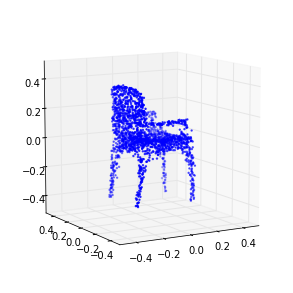

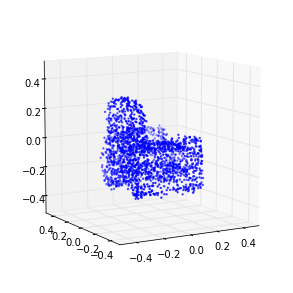

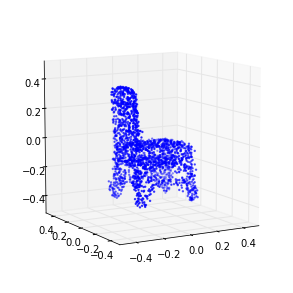

861 (-0.2230646237179085, 0.19730340385878528)
862 (-0.21889172196388246, 0.20738987845403176)
863 (-0.22098686363961961, 0.20619262644538172)
864 (-0.22129308879375459, 0.20752965907255808)
865 (-0.21898417991620522, 0.20410556373772798)
866 (-0.21830095648765563, 0.20296770499812233)
867 (-0.21569149979838617, 0.20192066055757027)
868 (-0.21814285947216883, 0.21129858383425959)
869 (-0.22080640759732989, 0.20776374914028026)
870 (-0.21932423335534554, 0.2112977162555412)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


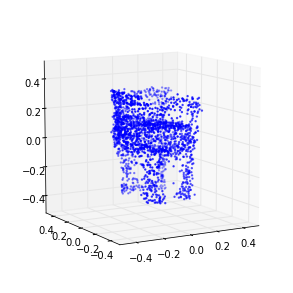

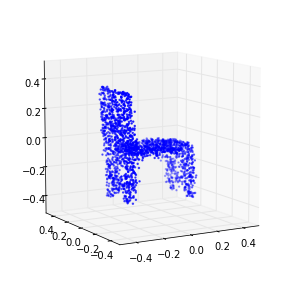

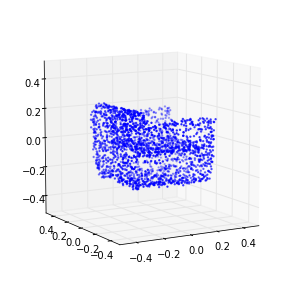

871 (-0.21719788599897313, 0.21687930656803978)
872 (-0.21642452224537179, 0.20858225502349712)
873 (-0.22003078780792379, 0.20770928484422188)
874 (-0.2174852207854942, 0.19758144131413213)
875 (-0.2174191602954158, 0.20412352294833572)
876 (-0.21959798369142744, 0.20214190968760737)
877 (-0.21677780548731487, 0.20067884359094831)
878 (-0.21842428379588658, 0.20542413934513373)
879 (-0.2176834562310466, 0.20238387971012681)
880 (-0.21934133227224703, 0.20396426982349819)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


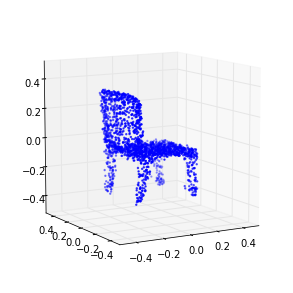

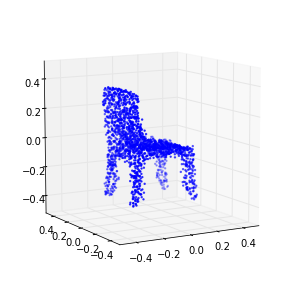

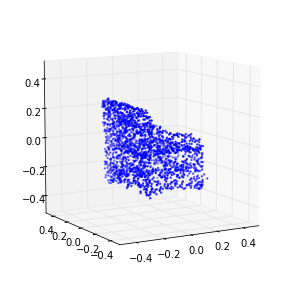

881 (-0.21723163436960291, 0.20659818307117181)
882 (-0.2216395796449096, 0.20369857770425301)
883 (-0.22051572015991919, 0.20322743941236426)
884 (-0.21947575906912486, 0.19770284107437841)
885 (-0.21905240913232168, 0.19768065600483506)
886 (-0.21987155830418623, 0.20609746873378754)
887 (-0.21713907177801486, 0.21594980138319511)
888 (-0.21633026754414594, 0.2030917946939115)
889 (-0.21784453513445678, 0.21138524126123498)
890 (-0.21854982519591296, 0.2117175868263951)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


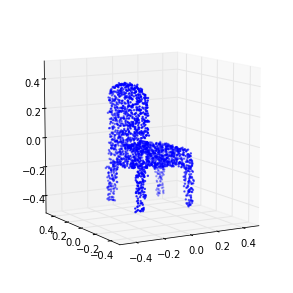

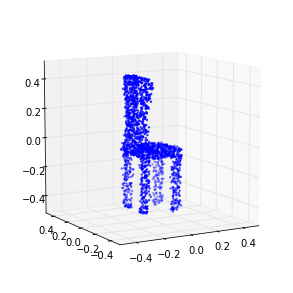

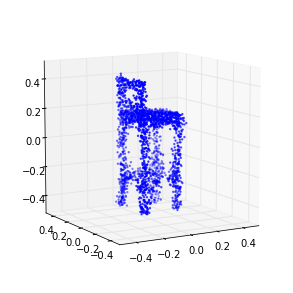

891 (-0.22012367932884783, 0.21152280988516631)
892 (-0.2191917853222953, 0.20137013660536873)
893 (-0.2195735051676079, 0.21674348303565272)
894 (-0.2189405819884053, 0.20934945565682869)
895 (-0.22004151984497353, 0.20398111806975472)
896 (-0.21963606885185949, 0.20847689608732858)
897 (-0.2191636242248394, 0.20589364016497577)
898 (-0.21711600831261388, 0.21163551399001368)
899 (-0.21869093356309113, 0.2157355464167065)
900 (-0.21924862596723768, 0.20624560007342585)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


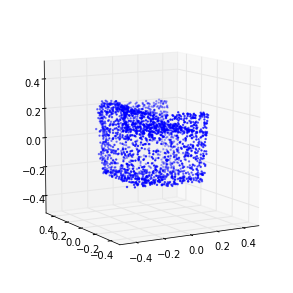

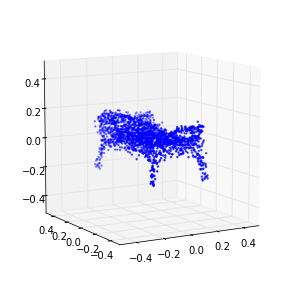

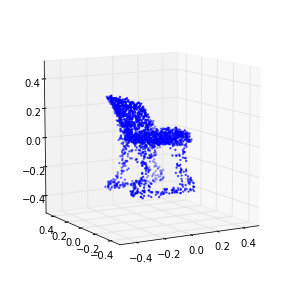

901 (-0.22000615342899604, 0.20603650422007949)
902 (-0.21932433115111458, 0.20560564928584629)
903 (-0.22220378694710907, 0.21789157004268081)
904 (-0.2202562639006862, 0.21163296589144953)
905 (-0.21805096489411813, 0.20742092033227286)
906 (-0.21707782171390674, 0.2127522517133642)
907 (-0.22017535611435218, 0.2113557419291249)
908 (-0.21744954089323679, 0.20728624363740286)
909 (-0.21872211231125727, 0.21584981128021521)
910 (-0.22110221330766325, 0.20679914454619089)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


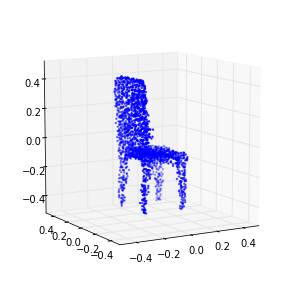

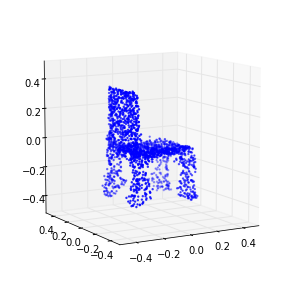

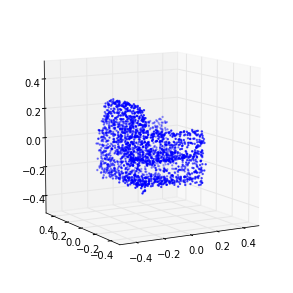

911 (-0.21817045487739423, 0.21266298713507475)
912 (-0.21764250640515928, 0.21805761644133814)
913 (-0.21774494835623989, 0.214766725897789)
914 (-0.2193194623346682, 0.21778086269343341)
915 (-0.22060450503119716, 0.20804349912537468)
916 (-0.218188981656675, 0.20972219164724704)
917 (-0.21984713706705306, 0.22599172040268226)
918 (-0.21784441162038731, 0.20747331502260985)
919 (-0.22034458385573494, 0.19724558073061485)
920 (-0.21604287911344458, 0.21164466551056615)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


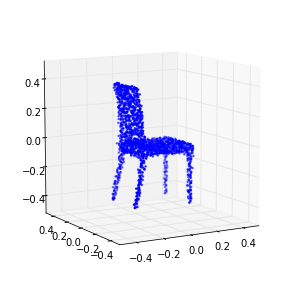

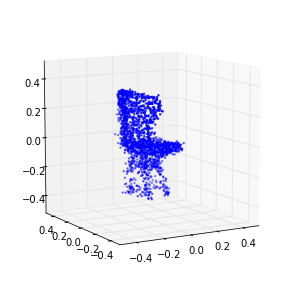

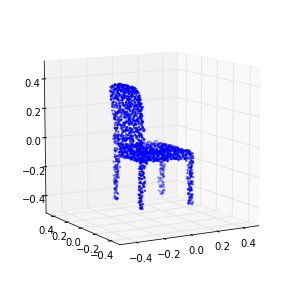

921 (-0.21729809553534896, 0.22262799574269188)
922 (-0.21802866999749784, 0.21109293235672844)
923 (-0.21718525014541767, 0.20954762675144054)
924 (-0.22137670892256278, 0.21602341753465157)
925 (-0.21933563274365883, 0.20946657657623291)
926 (-0.21859327300831125, 0.21325205983938994)
927 (-0.21653158609513884, 0.21238831954973716)
928 (-0.21987597600177483, 0.22165979555359594)
929 (-0.21804159239486412, 0.21178521491863109)
930 (-0.22025853218855682, 0.21566122659930476)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


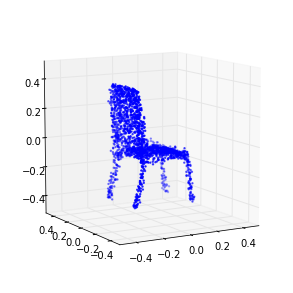

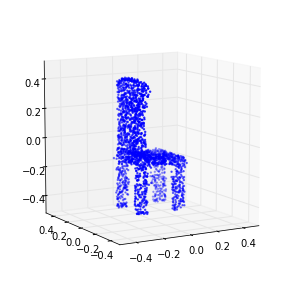

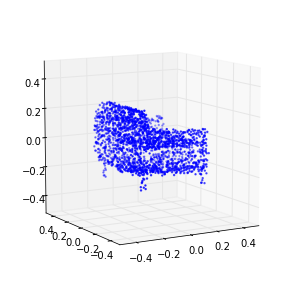

931 (-0.21751839032879583, 0.21847188803884718)
932 (-0.21788299988817286, 0.21692004744653348)
933 (-0.21859749136147677, 0.21322772569126552)
934 (-0.21590858013541611, 0.21586588687366909)
935 (-0.21930495754436211, 0.216736004308418)
936 (-0.21949741840362549, 0.21564855343765682)
937 (-0.21556015312671661, 0.20385354536551017)
938 (-0.21885763042502934, 0.21466799632266717)
939 (-0.21894651927329875, 0.21323651461689561)
940 (-0.21677759952015346, 0.22370240037088041)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


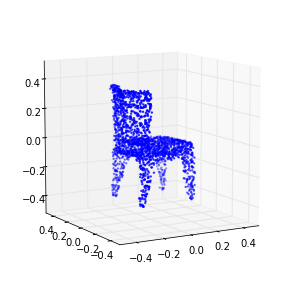

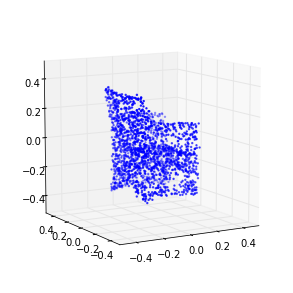

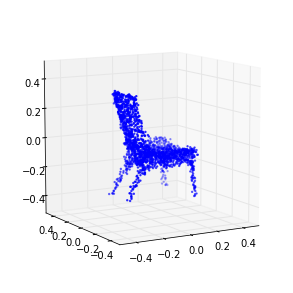

941 (-0.22114381481100012, 0.21583081395537765)
942 (-0.21821423338519202, 0.2192249325690446)
943 (-0.21784237336229395, 0.2172359217096258)
944 (-0.22216406519766208, 0.21948396662871042)
945 (-0.21818622604564383, 0.21282937791612414)
946 (-0.21744497804730026, 0.21131056712733376)
947 (-0.21674701019569678, 0.21907580837055488)
948 (-0.21789778526182527, 0.21441274053520626)
949 (-0.2175677169252325, 0.21429938850579439)
950 (-0.21576166660697371, 0.22037893754464608)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


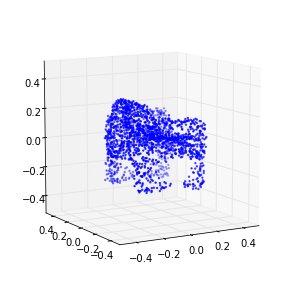

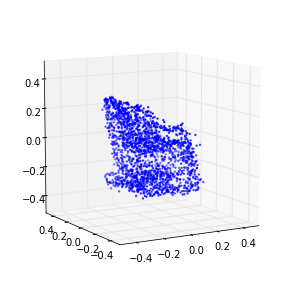

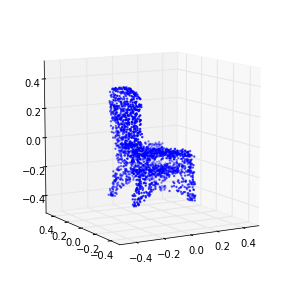

951 (-0.21539508821787656, 0.22195426126321158)
952 (-0.21603290902243721, 0.21935938740218128)
953 (-0.21664472056759729, 0.22690982730300338)
954 (-0.2186400904699608, 0.23042685400556634)
955 (-0.21782602060724188, 0.21933709029798154)
956 (-0.21593474193855569, 0.22715767169440235)
957 (-0.2192300353889112, 0.22052337174062375)
958 (-0.2214824194157565, 0.22402966408817857)
959 (-0.21842373609542848, 0.21289636415463906)
960 (-0.21889076994525061, 0.21448727007265445)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


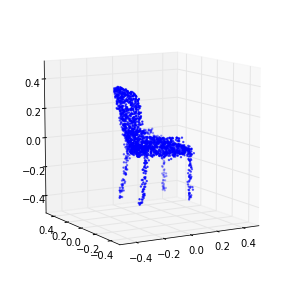

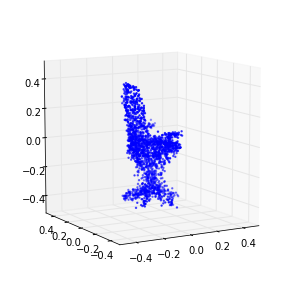

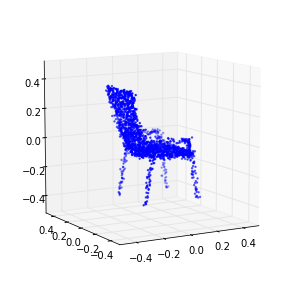

961 (-0.21681869361135694, 0.22255502751579992)
962 (-0.21671102808581458, 0.23060207620814996)
963 (-0.21675517227914598, 0.21163189576731789)
964 (-0.21895116589687488, 0.22352494133843315)
965 (-0.2148044937186771, 0.21132302504998665)
966 (-0.21689041875026843, 0.21685652379636411)
967 (-0.21661389436986711, 0.22003501267344863)
968 (-0.22075395490284319, 0.21264598877341659)
969 (-0.21659967711678257, 0.21568900015619066)
970 (-0.2219284779495663, 0.22426682710647583)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


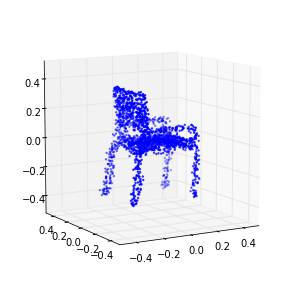

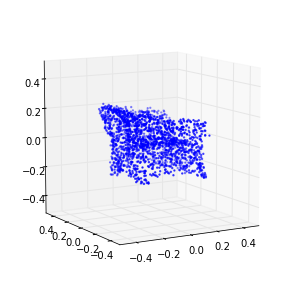

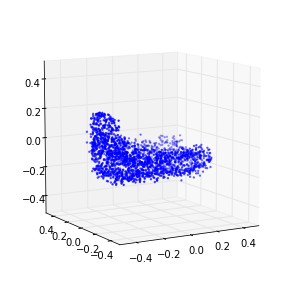

971 (-0.21856248566397915, 0.22125855253802407)
972 (-0.21788188185956742, 0.21907623222580663)
973 (-0.21647211280133988, 0.21527015445408998)
974 (-0.21533568335904016, 0.2125903406628856)
975 (-0.21912814809216394, 0.21802652930771863)
976 (-0.2173643511754495, 0.22316205777503825)
977 (-0.21744522364051252, 0.22077838745382097)
978 (-0.2173308551311493, 0.21540433996253544)
979 (-0.21823102787688928, 0.22100512352254656)
980 (-0.21698558617521216, 0.21668109849647241)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


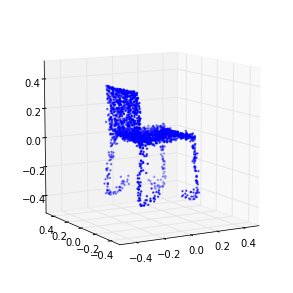

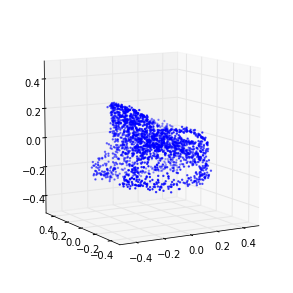

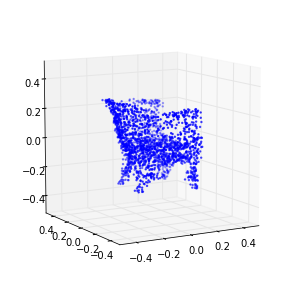

981 (-0.21793049375216167, 0.22703956177941076)
982 (-0.21678280731042227, 0.21288072235054439)
983 (-0.21783067495734604, 0.2194557990188952)
984 (-0.21654853335133306, 0.21025626195801628)
985 (-0.21798838354923106, 0.22738107376628452)
986 (-0.21690310019033926, 0.21859648878927584)
987 (-0.21669441726472644, 0.21991336842377981)
988 (-0.21751447308946539, 0.22747220485298722)
989 (-0.21750520887198271, 0.22990026904477012)
990 (-0.21894585722022586, 0.21462252736091614)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


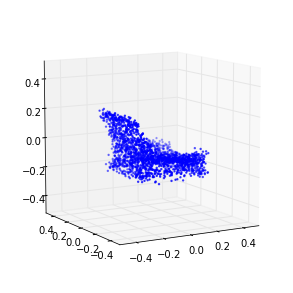

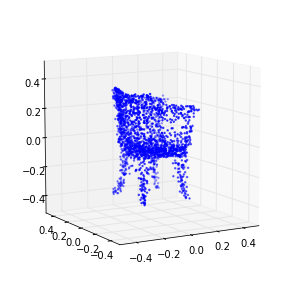

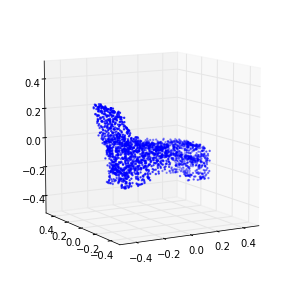

991 (-0.21838859628748011, 0.22281405881599145)
992 (-0.21704440812269846, 0.22023626223758416)
993 (-0.21913381285137601, 0.21006753378444248)
994 (-0.21875082276485586, 0.21627276252817224)
995 (-0.22004799588962837, 0.2188080620986444)
996 (-0.21527136277269435, 0.20960222350226509)
997 (-0.21832890400180111, 0.22853342747246777)
998 (-0.21642780811698348, 0.22490425021560104)
999 (-0.21617931513874619, 0.21669076990198205)
1000 (-0.21624050758503102, 0.224904406953741)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


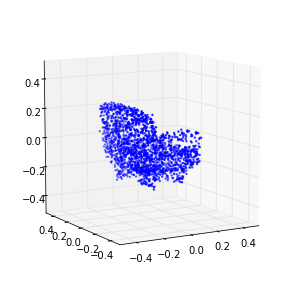

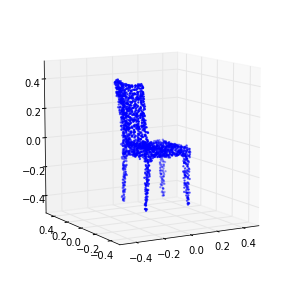

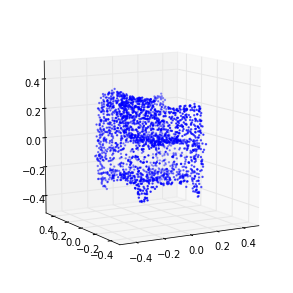

1001 (-0.21898541417386796, 0.21734428405761719)
1002 (-0.21849579998740443, 0.20829729625472315)
1003 (-0.21716894065892256, 0.21796815759605831)
1004 (-0.21721331929719007, 0.21952078574233586)
1005 (-0.2174316990154761, 0.22869171312561742)
1006 (-0.21714693594861914, 0.21070390774144065)
1007 (-0.21929036599618418, 0.2170663211080763)
1008 (-0.21682626163517987, 0.21880200670825112)
1009 (-0.21509922124721387, 0.21470164259274802)
1010 (-0.21717756456798978, 0.22121674926192672)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


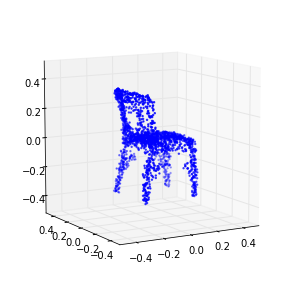

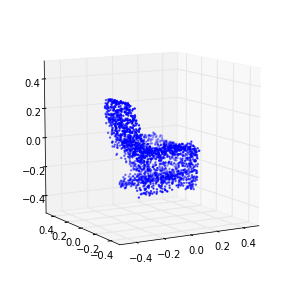

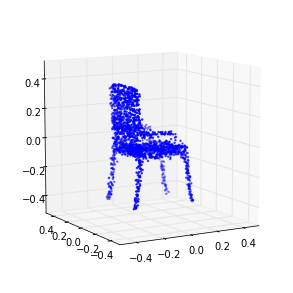

1011 (-0.21650064664858359, 0.22271850594767817)
1012 (-0.21850603995499787, 0.20781559745470682)
1013 (-0.21663638761749973, 0.23363103634781307)
1014 (-0.2173035467112506, 0.23618200973228173)
1015 (-0.21832814028969519, 0.22202141527776365)
1016 (-0.21547344845754129, 0.22426373870284469)
1017 (-0.21758719759958761, 0.22867584007757683)
1018 (-0.21652142747684761, 0.21105045135374423)
1019 (-0.21778313672101057, 0.2299959256693169)
1020 (-0.21599268438639463, 0.21896586098052837)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


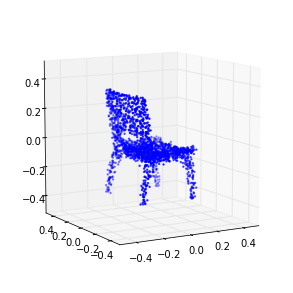

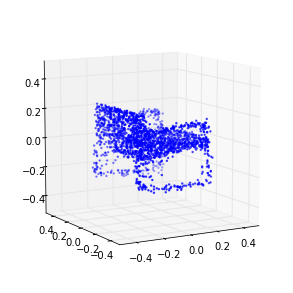

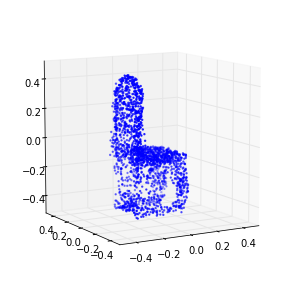

1021 (-0.21615577008989123, 0.23160781628555721)
1022 (-0.21866991795875407, 0.22213109555067839)
1023 (-0.2176724578495379, 0.22208695168848391)
1024 (-0.21655919397318804, 0.23159123294883305)
1025 (-0.2152561836772495, 0.2176178550278699)
1026 (-0.2165915745275992, 0.23351479956397303)
1027 (-0.21808315184381272, 0.2235356315418526)
1028 (-0.21845701513467011, 0.2312594574910623)
1029 (-0.21674912869930268, 0.24211020215793891)
1030 (-0.21785977725629455, 0.22915121747387779)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


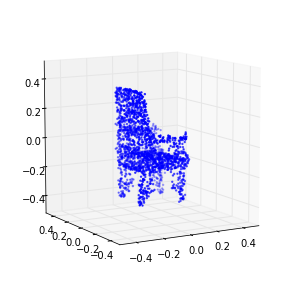

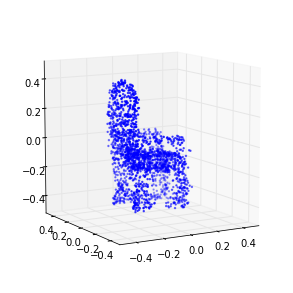

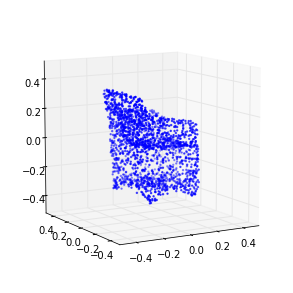

1031 (-0.21898793754754242, 0.22917985419432321)
1032 (-0.21791331039534675, 0.22513565752241346)
1033 (-0.21688474405694891, 0.22899483420230723)
1034 (-0.21806004599288659, 0.2346196726516441)
1035 (-0.21731178296936882, 0.22548830729943733)
1036 (-0.21679298381010692, 0.22766290825826149)
1037 (-0.21420962115128836, 0.21601193867347859)
1038 (-0.21815965893091979, 0.2232367037623017)
1039 (-0.21631579630904726, 0.23354126237056874)
1040 (-0.21703625597335674, 0.2303325390374219)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


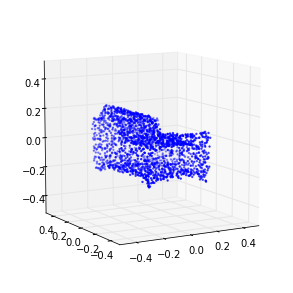

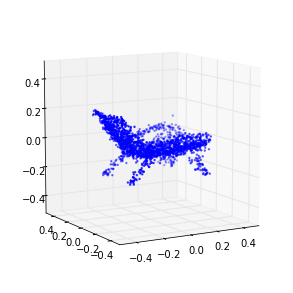

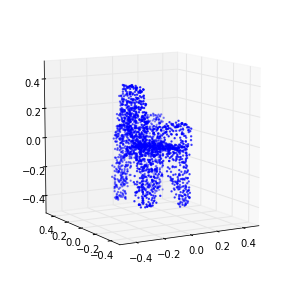

1041 (-0.21809834010071225, 0.22415750280574517)
1042 (-0.21655448929027274, 0.22197950493406365)
1043 (-0.2172540021163446, 0.21314073271221584)
1044 (-0.21807395694432435, 0.23092647779870917)
1045 (-0.21655423751583805, 0.23059122816280084)
1046 (-0.21694546948980403, 0.22993061387980426)
1047 (-0.21691475013891856, 0.22134758200910357)
1048 (-0.21833840045664046, 0.2329532250210091)
1049 (-0.2163224309682846, 0.23086946981924553)
1050 (-0.2175942188059842, 0.2264018025663164)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


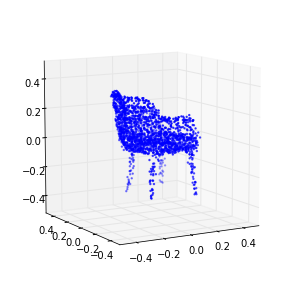

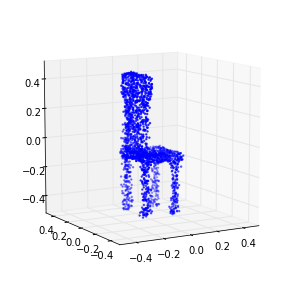

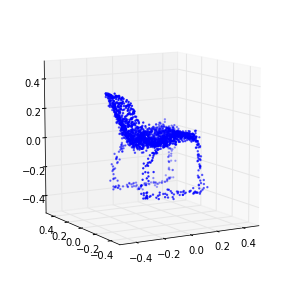

1051 (-0.21912295586533018, 0.22542283270094129)
1052 (-0.21778054204252031, 0.23454058170318604)
1053 (-0.21702932605036981, 0.21154663849759986)
1054 (-0.21898537211947972, 0.2319200066504655)
1055 (-0.21757885007946579, 0.23038903816982551)
1056 (-0.21683274264688845, 0.23257092690026318)
1057 (-0.21694354116916656, 0.24025948952745507)
1058 (-0.21640674593272033, 0.21813350860719327)
1059 (-0.21599936231418893, 0.23019982653635521)
1060 (-0.21711095637745328, 0.23127664404886741)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


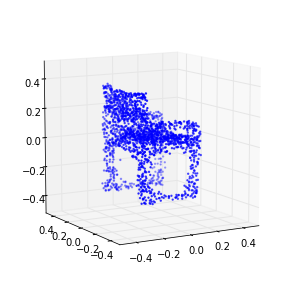

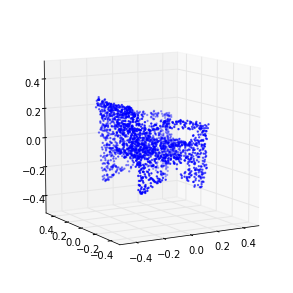

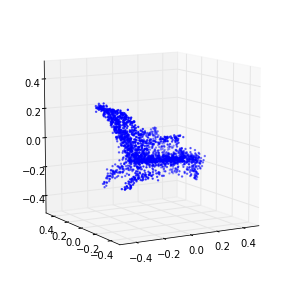

1061 (-0.21642829687507065, 0.23119557234976026)
1062 (-0.21429456759382176, 0.2257856246497896)
1063 (-0.21817642439294743, 0.21364236374696097)
1064 (-0.21715043915642632, 0.23136486885724244)
1065 (-0.21768053118829375, 0.23572938806480831)
1066 (-0.21574761679878943, 0.23549189004633161)
1067 (-0.21659721897708045, 0.2242346301122948)
1068 (-0.21621141985610678, 0.22970180875725216)
1069 (-0.21700554997832686, 0.22738296235049213)
1070 (-0.21776461888242651, 0.24214517794273518)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


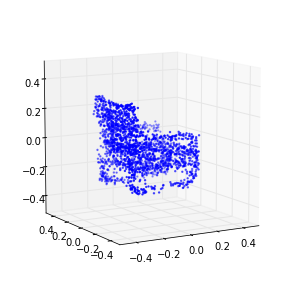

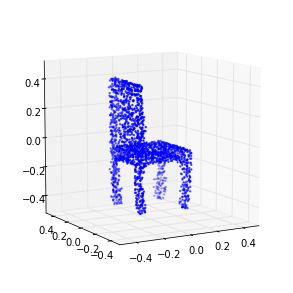

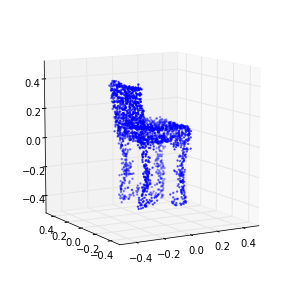

1071 (-0.21666976908842722, 0.21852572979750456)
1072 (-0.21775650161283988, 0.22597863773504892)
1073 (-0.21400458249780868, 0.2238135928357089)
1074 (-0.21909485073001297, 0.22786494482446601)
1075 (-0.21551298057591473, 0.22867938489825637)
1076 (-0.21867069712391607, 0.22832588189178044)
1077 (-0.21666484430984215, 0.2312346906573684)
1078 (-0.2169632112538373, 0.23489330433033132)
1079 (-0.21717423730426363, 0.21522669825288984)
1080 (-0.22071586670698942, 0.23474156911726352)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


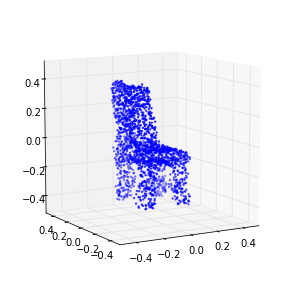

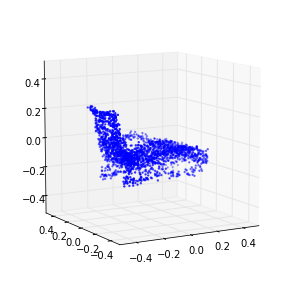

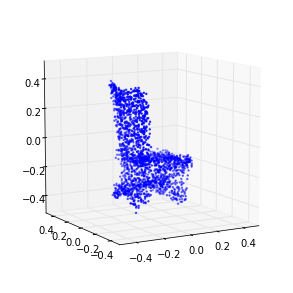

1081 (-0.21660825919221949, 0.23750901884502834)
1082 (-0.21729789597016794, 0.2509959754016664)
1083 (-0.2205956451318882, 0.23694480955600739)
1084 (-0.21640330983532799, 0.22836123958781915)
1085 (-0.21736977729532453, 0.22948794563611349)
1086 (-0.21486500280874746, 0.23700973888238272)
1087 (-0.21579465832975175, 0.23052514537617011)
1088 (-0.21707628788771452, 0.22272504369417825)
1089 (-0.22093963854842716, 0.23363586708351416)
1090 (-0.21657013076323051, 0.23375360722895022)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


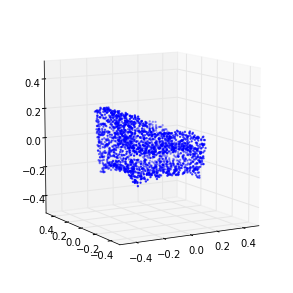

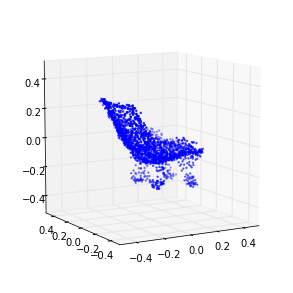

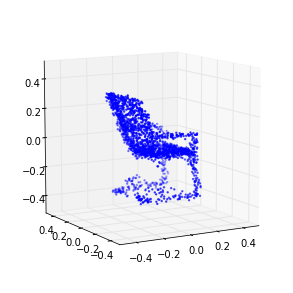

1091 (-0.21852180163065593, 0.23820478662296576)
1092 (-0.21508299211661022, 0.22642128721431451)
1093 (-0.21679168166937651, 0.23493277750633382)
1094 (-0.21906228650499274, 0.23317127150517922)
1095 (-0.21643781286698802, 0.23253313534789616)
1096 (-0.2184004102592115, 0.23720208583054719)
1097 (-0.21694907943407696, 0.23464295433627236)
1098 (-0.215494371453921, 0.24084801695964955)
1099 (-0.21681482836052224, 0.24312727705196099)
1100 (-0.21799570101278801, 0.23538445101843941)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


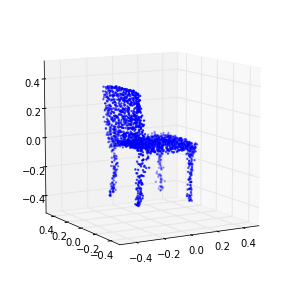

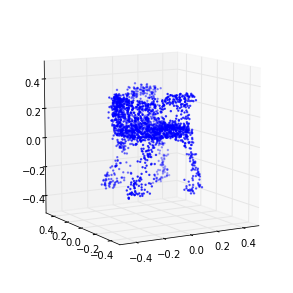

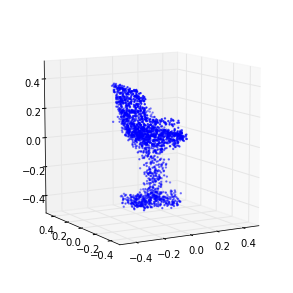

1101 (-0.21876083623479914, 0.22985559536351097)
1102 (-0.21822426661297126, 0.22950534743291359)
1103 (-0.21807979102487918, 0.23391574179684674)
1104 (-0.22003370589680141, 0.22440265726160119)
1105 (-0.21646675776552271, 0.23330919058234603)
1106 (-0.21713377877517984, 0.23758598886154317)
1107 (-0.21739904118908776, 0.23233389578483724)
1108 (-0.21622004818033289, 0.23687088875858872)
1109 (-0.21639464464452532, 0.23387418080259254)
1110 (-0.21747098388495267, 0.23799368132043769)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


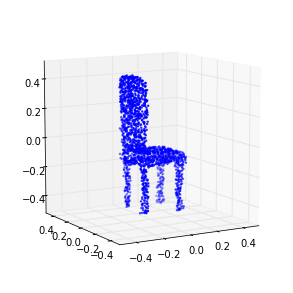

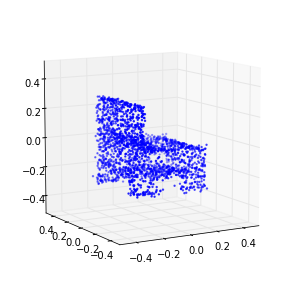

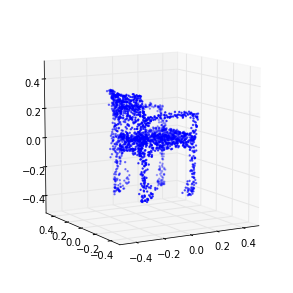

1111 (-0.21603480014536117, 0.23318784601158565)
1112 (-0.21734549149318977, 0.24770405557420519)
1113 (-0.21949191766756551, 0.22855187290244633)
1114 (-0.21483517896246027, 0.24844781226581997)
1115 (-0.21794735303631535, 0.22886015088469894)
1116 (-0.21889997400619365, 0.23104014440819068)
1117 (-0.2166738138154701, 0.23734933855356993)
1118 (-0.21717449426651, 0.23298205214518089)
1119 (-0.22180895010630289, 0.2216578600583253)
1120 (-0.21916543300505037, 0.2297423779964447)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


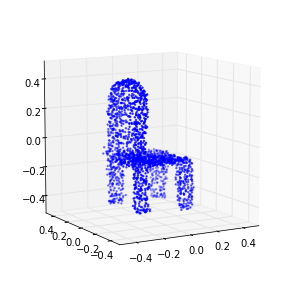

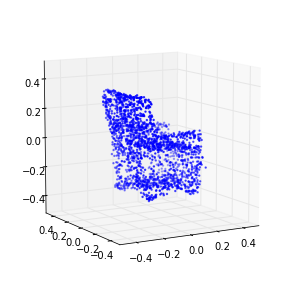

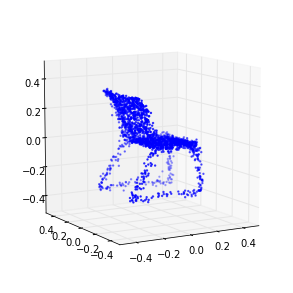

1121 (-0.21721803899164552, 0.24217060705025992)
1122 (-0.21700641590136069, 0.23341031538115609)
1123 (-0.21535697259284831, 0.2284198828317501)
1124 (-0.21598515058005296, 0.22597269493120689)
1125 (-0.21818114519119264, 0.23824175088493912)
1126 (-0.2152743015024397, 0.23228917684819964)
1127 (-0.21788460005212712, 0.24705249236689675)
1128 (-0.21719953815142315, 0.23688483403788674)
1129 (-0.2179326131387993, 0.24107501793790748)
1130 (-0.21802794701523251, 0.22885380023055607)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


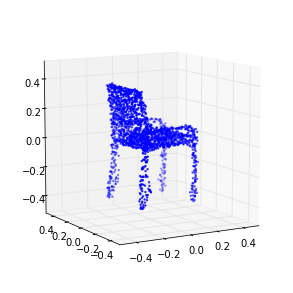

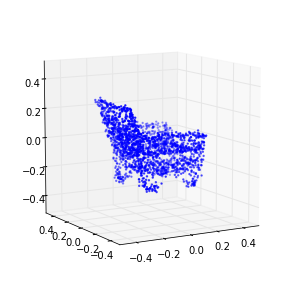

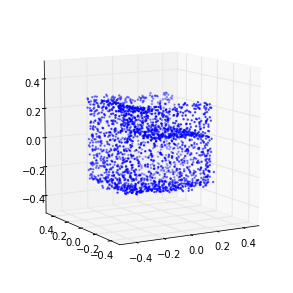

1131 (-0.21625885223900831, 0.2257208526134491)
1132 (-0.21945746375454797, 0.23052901029586792)
1133 (-0.2149985580532639, 0.23420539332760704)
1134 (-0.21524559800271634, 0.22856976091861725)
1135 (-0.21582133074601492, 0.23560514935740717)
1136 (-0.21485659402829629, 0.23240848823829932)
1137 (-0.21403625044557784, 0.22178743834848758)
1138 (-0.21519026977044564, 0.23633683058950636)
1139 (-0.21789236432976192, 0.23074488728134721)
1140 (-0.21592166876351393, 0.23197251171977432)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


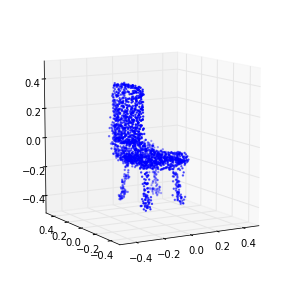

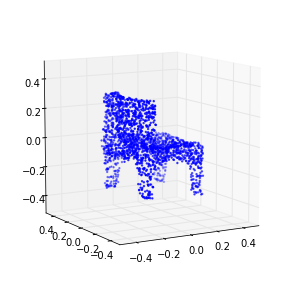

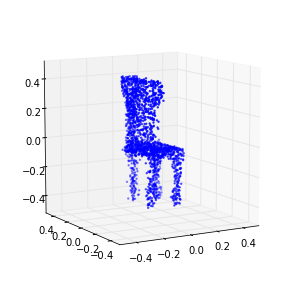

1141 (-0.21610549765604514, 0.23874595485351705)
1142 (-0.21629743818883543, 0.24405824696576153)
1143 (-0.21727045079072316, 0.24163471051940211)
1144 (-0.21654663394998622, 0.24271699730996732)
1145 (-0.21629053221808539, 0.24016655484835306)
1146 (-0.21509493015430592, 0.23477413974426412)
1147 (-0.217193881449876, 0.23202454326329408)
1148 (-0.21587775117821165, 0.22705820478774882)
1149 (-0.21619071993562911, 0.23821453915701973)
1150 (-0.21693912192627235, 0.24456324014398786)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


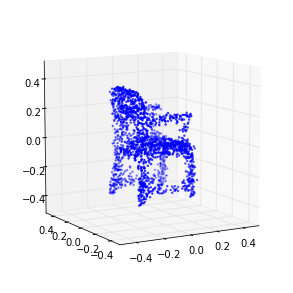

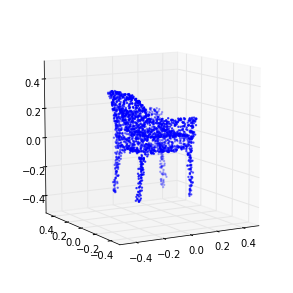

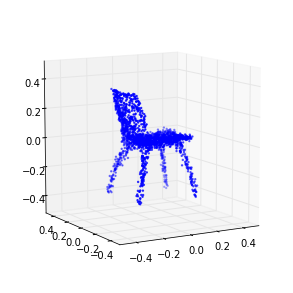

1151 (-0.21941650829933307, 0.23675335667751454)
1152 (-0.21976517505115933, 0.2399662517839008)
1153 (-0.2173734003746951, 0.23994866896558692)
1154 (-0.21876778580524303, 0.2363072650300132)
1155 (-0.21443298183105611, 0.23449367229585294)
1156 (-0.21521047552426656, 0.24206475527198226)
1157 (-0.2175960703028573, 0.23157025321766181)
1158 (-0.21662549288184554, 0.23872755743839122)
1159 (-0.21898546638312164, 0.24292864346945728)
1160 (-0.21759910097828619, 0.24103518271887744)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


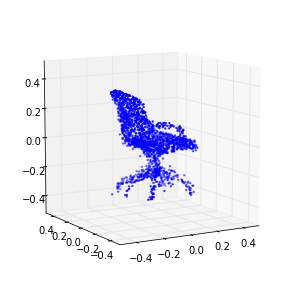

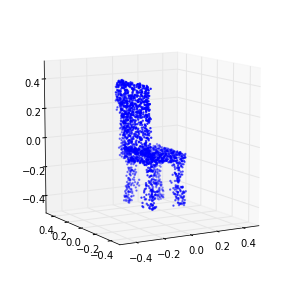

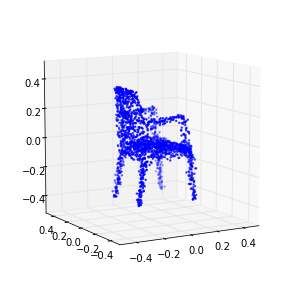

1161 (-0.2178258329629898, 0.23680699147559978)
1162 (-0.21996106505393981, 0.23011585131839471)
1163 (-0.21795325499993784, 0.2458223788826554)
1164 (-0.2169012231959237, 0.22799625440880103)
1165 (-0.21624065411311608, 0.24393338185769539)
1166 (-0.22019699050320518, 0.23123107243467261)
1167 (-0.21489899313008343, 0.24591451276231696)
1168 (-0.21796049232836123, 0.23986969667452354)
1169 (-0.21582994781158588, 0.23931409528961889)
1170 (-0.21870427308259188, 0.2330544028017256)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


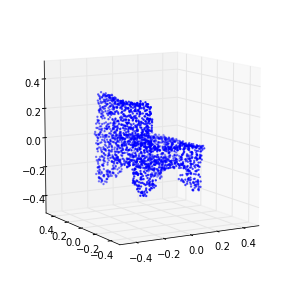

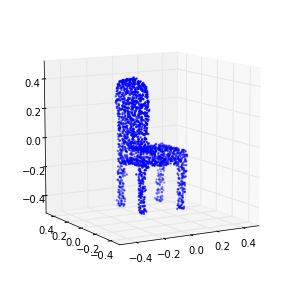

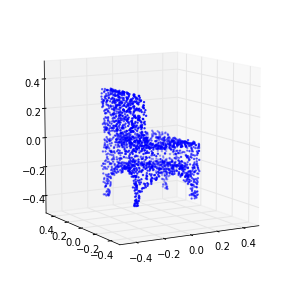

1171 (-0.21801749291243377, 0.24647323290506998)
1172 (-0.21834478245841132, 0.24368369579315186)
1173 (-0.22081898517078824, 0.24565381749912543)
1174 (-0.21757384792522147, 0.23938036075344793)
1175 (-0.21878650276749223, 0.24575665096441904)
1176 (-0.21926390672171558, 0.24555308951271904)
1177 (-0.21729353335168627, 0.2455400272651955)
1178 (-0.21700961865760662, 0.24330522671893792)
1179 (-0.21502060150658642, 0.2431821177403132)
1180 (-0.21555251313580406, 0.24767528639899361)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


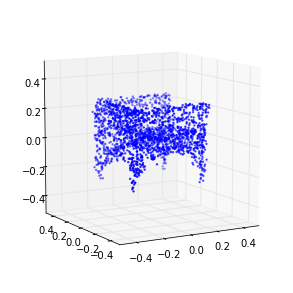

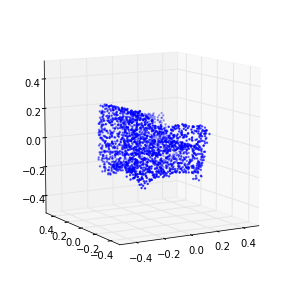

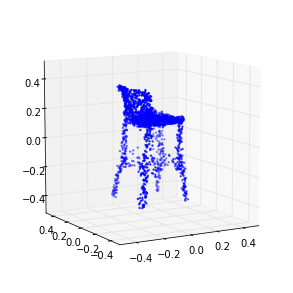

1181 (-0.2177093529038959, 0.23692060951833371)
1182 (-0.21656782593992022, 0.24084677740379615)
1183 (-0.21544574885456649, 0.24690165839813374)
1184 (-0.21923819647894965, 0.25101201070679557)
1185 (-0.21535434082702354, 0.25104749092349299)
1186 (-0.21551544853934534, 0.2398790016218468)
1187 (-0.21673037520161381, 0.24406290219889748)
1188 (-0.21591011318895553, 0.24547328496420825)
1189 (-0.21352445549435087, 0.25071517516065528)
1190 (-0.21828374807481413, 0.23115736577245924)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


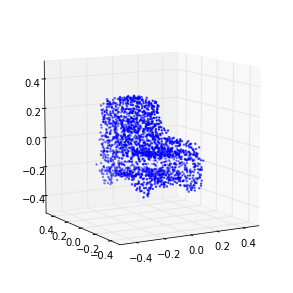

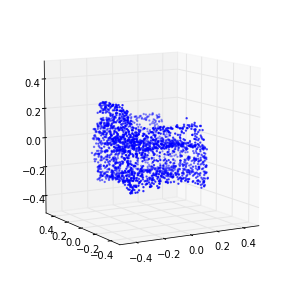

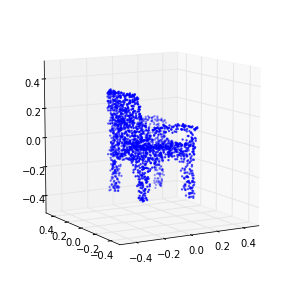

1191 (-0.21612672474649217, 0.25388412067183741)
1192 (-0.21445624408898531, 0.23975478719781945)
1193 (-0.21808991023787747, 0.23785976899994743)
1194 (-0.21660652602160418, 0.25588144969057153)
1195 (-0.21481417152616714, 0.25054924024475944)
1196 (-0.21826613236356665, 0.24895768971354873)
1197 (-0.21814368643142559, 0.24413843121793535)
1198 (-0.21694004469447667, 0.24194366512475191)
1199 (-0.21649036672380234, 0.23938189060599716)
1200 (-0.21590673261218601, 0.24006081951989067)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


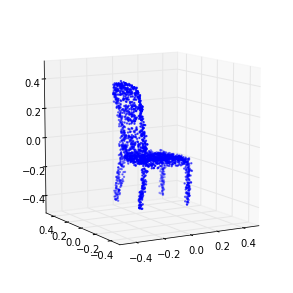

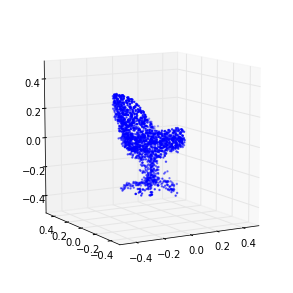

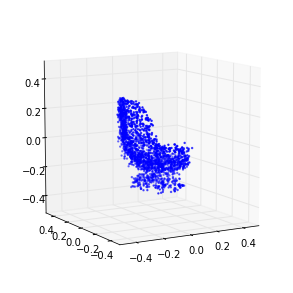

1201 (-0.21443117371311896, 0.24059682974108942)
1202 (-0.2178468750582801, 0.24931174351109398)
1203 (-0.21705120117576035, 0.24972129419997888)
1204 (-0.21654973780667341, 0.24335856183811469)
1205 (-0.21820024296089455, 0.25011398726039463)
1206 (-0.21593012357199634, 0.24569962753189933)
1207 (-0.21526057720184327, 0.24622808396816254)
1208 (-0.2160802259489342, 0.2463984555668301)
1209 (-0.21892873987003608, 0.24048713511890835)
1210 (-0.21608560880025227, 0.24451071355077955)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


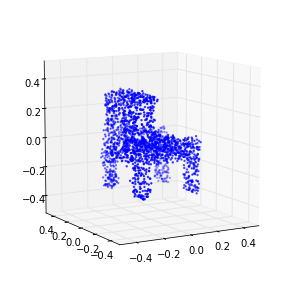

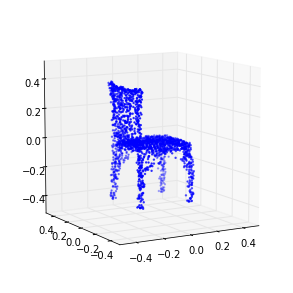

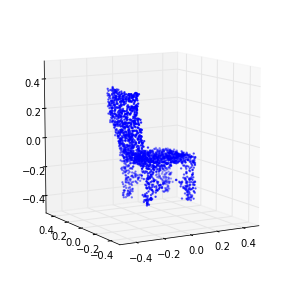

1211 (-0.21328857154757888, 0.25117530094252694)
1212 (-0.2157379185711896, 0.2391814429450918)
1213 (-0.21769665854948539, 0.23875431219736734)
1214 (-0.21580376404303092, 0.24656250355420289)
1215 (-0.21767710789486214, 0.24953863245469551)
1216 (-0.21822880859728214, 0.24217564805790229)
1217 (-0.21525404210443849, 0.23802691642884855)
1218 (-0.21587442270031681, 0.25040958876963015)
1219 (-0.21646647806520816, 0.24286408998348094)
1220 (-0.21735252782150552, 0.23270290482927253)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


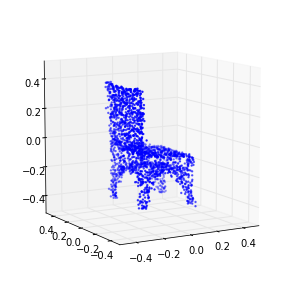

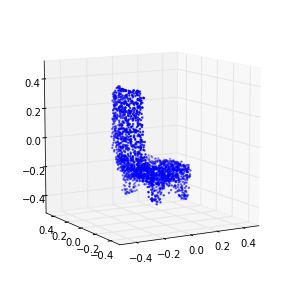

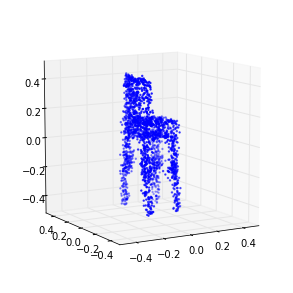

1221 (-0.21707809986891569, 0.24514721002843645)
1222 (-0.2159854476098661, 0.24551690452628666)
1223 (-0.21380023426479763, 0.25412933914749708)
1224 (-0.21687082030155042, 0.25822677380508846)
1225 (-0.2172165870666504, 0.23962582813368904)
1226 (-0.21687337060769399, 0.2493179374270969)
1227 (-0.21573654639500159, 0.24896909682839005)
1228 (-0.21496507083928143, 0.2472508450349172)
1229 (-0.21636378743030407, 0.2440787708317792)
1230 (-0.21764078118182995, 0.24691866559010964)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


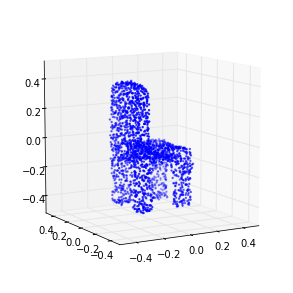

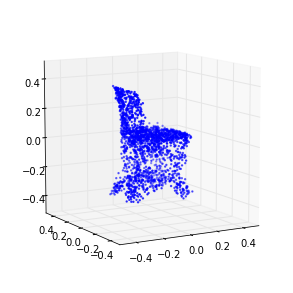

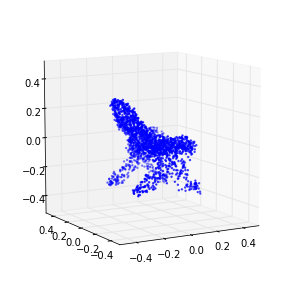

1231 (-0.21770514018005796, 0.24471656536614453)
1232 (-0.21407801243993971, 0.24834994475046793)
1233 (-0.21555224955081939, 0.24946043171264506)
1234 (-0.21754492587513394, 0.24954269108948884)
1235 (-0.21580165712921709, 0.26087636086675858)
1236 (-0.21591214427241573, 0.24134329126940834)
1237 (-0.21893743563581397, 0.24090084709503032)
1238 (-0.2168317331208123, 0.24792071017954084)
1239 (-0.21716950403319465, 0.24204727400232245)
1240 (-0.21498901292129799, 0.25402190729423807)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


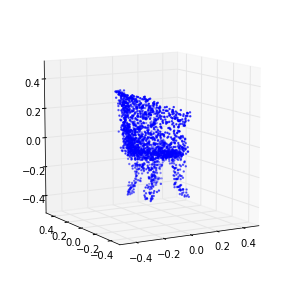

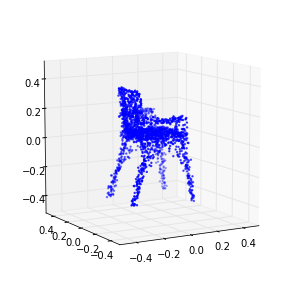

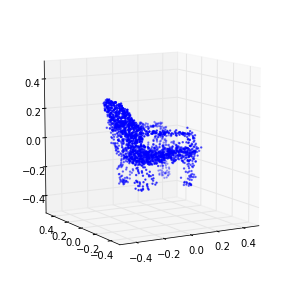

1241 (-0.21726679735713536, 0.24146194866410009)
1242 (-0.21760030830347979, 0.24876086800186722)
1243 (-0.21641240164085671, 0.25526800751686096)
1244 (-0.2150834020641115, 0.24894370856108489)
1245 (-0.21577921178605822, 0.25190789224924864)
1246 (-0.21611003699126066, 0.24647657242086199)
1247 (-0.21588457900064964, 0.25216322530198981)
1248 (-0.21839764018853505, 0.25315812450868114)
1249 (-0.21671920231095068, 0.25340250189657565)
1250 (-0.21636536165519996, 0.25275894889125117)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


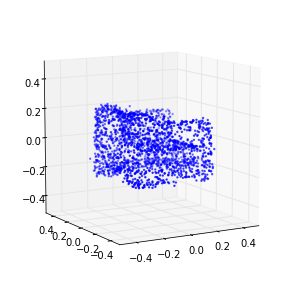

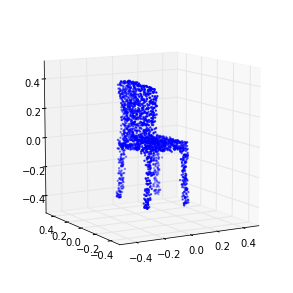

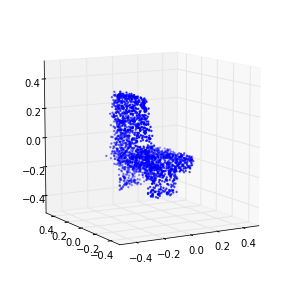

1251 (-0.21434797037530828, 0.25206169982751209)
1252 (-0.21795891722043356, 0.25152252393740193)
1253 (-0.21729000028636719, 0.2509572169295064)
1254 (-0.2159316677738119, 0.25855486315709575)
1255 (-0.2167348786636635, 0.24742692819348089)
1256 (-0.21536051498519049, 0.25729418683935096)
1257 (-0.21476780132011131, 0.24917469753159416)
1258 (-0.21748061996919138, 0.26047552901285664)
1259 (-0.21467549524925372, 0.25209000375535751)
1260 (-0.21604571905401018, 0.25703073430944373)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


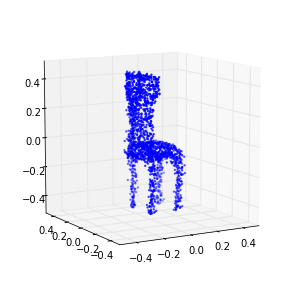

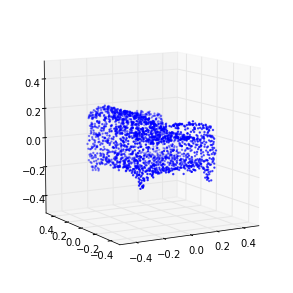

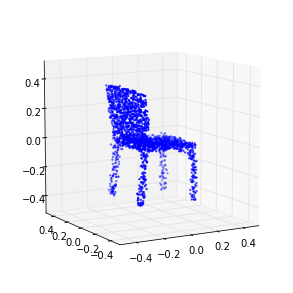

1261 (-0.2144629998339547, 0.24602184527450138)
1262 (-0.21509567024531187, 0.24220448677186612)
1263 (-0.21774700681368511, 0.25554729004700977)
1264 (-0.21614144168518207, 0.24002468475589045)
1265 (-0.21623786665775158, 0.24508623226925177)
1266 (-0.217515821368606, 0.25244275121777143)
1267 (-0.2150325561011279, 0.23884171413050759)
1268 (-0.21848060577004044, 0.24499161320704002)
1269 (-0.21392312226472077, 0.24854878253406948)
1270 (-0.21341881343611965, 0.25561570403752504)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


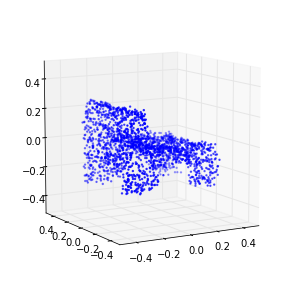

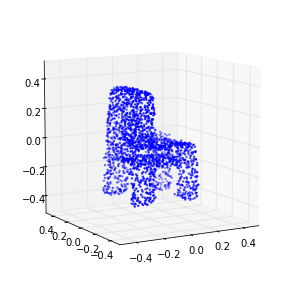

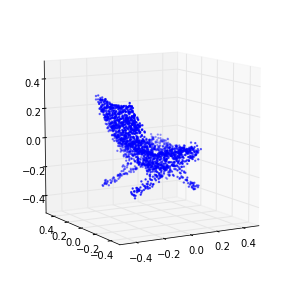

1271 (-0.21997409253208725, 0.25414014414504721)
1272 (-0.21609162511648955, 0.24643038434010964)
1273 (-0.21651336352030437, 0.25050287390196763)
1274 (-0.21666115478233056, 0.24251348552880464)
1275 (-0.21585831189597093, 0.24494841639642362)
1276 (-0.21586876368081129, 0.25645031531651813)
1277 (-0.21749213106102414, 0.25204511373131361)
1278 (-0.21739827515902344, 0.25459918710920548)
1279 (-0.21737940929554128, 0.25160021362481294)
1280 (-0.21708157349515844, 0.23990505768193138)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


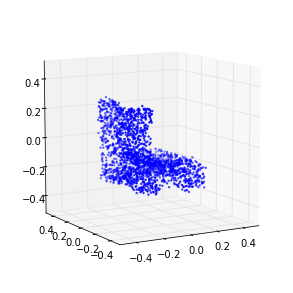

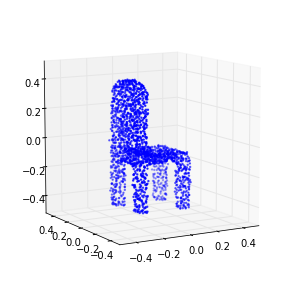

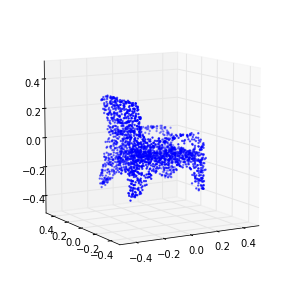

1281 (-0.21878946754667494, 0.24193568141372115)
1282 (-0.2158432196687769, 0.24886868342205329)
1283 (-0.21837537884712219, 0.26096028475849714)
1284 (-0.21378741407835924, 0.25133778872313323)
1285 (-0.21758023434215121, 0.26185966586625137)
1286 (-0.21864847088301623, 0.24007521017833991)
1287 (-0.21991944202670344, 0.24736829598744711)
1288 (-0.21389584706889259, 0.25094623532560134)
1289 (-0.21509032856535029, 0.25187776320510441)
1290 (-0.21488734958348452, 0.24739800283202418)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


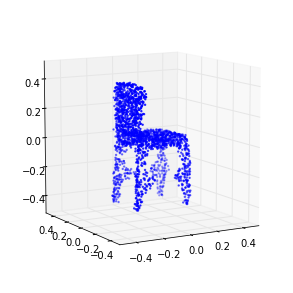

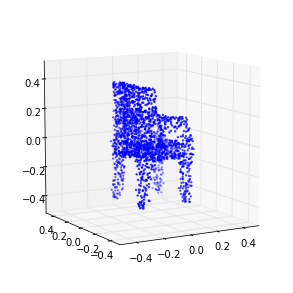

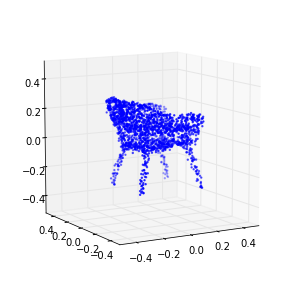

1291 (-0.21777212531478315, 0.25181432565053302)
1292 (-0.21660597600318768, 0.26016883386505973)
1293 (-0.21651457868240498, 0.23583366583894799)
1294 (-0.21715125099376395, 0.26478427262217913)
1295 (-0.21760598432134698, 0.24382999042669931)
1296 (-0.21729800966050888, 0.24964786017382587)
1297 (-0.21753110907695911, 0.25463795220410385)
1298 (-0.21485764627103451, 0.25088893263428297)
1299 (-0.21599521107143826, 0.25230108367072213)
1300 (-0.21719414249614433, 0.24085921214686501)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


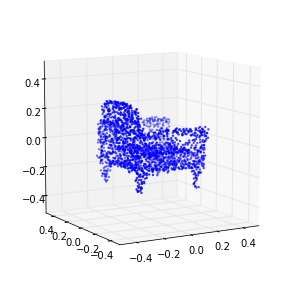

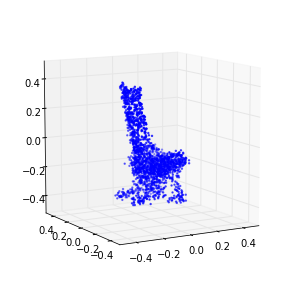

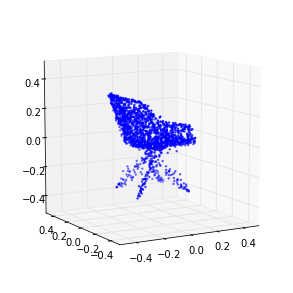

1301 (-0.21670036514600119, 0.25402676783226152)
1302 (-0.21678391032748753, 0.24966568637777259)
1303 (-0.21545631024572584, 0.24051338323840388)
1304 (-0.21637822345451072, 0.25738377924318667)
1305 (-0.21414565510219999, 0.23354292136651497)
1306 (-0.21713998361870093, 0.25136765285774515)
1307 (-0.21643766650447138, 0.24116690512056704)
1308 (-0.21600684722264607, 0.25092904931969112)
1309 (-0.21597593393590714, 0.2524638004876949)
1310 (-0.21552726946495199, 0.25031792068922959)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


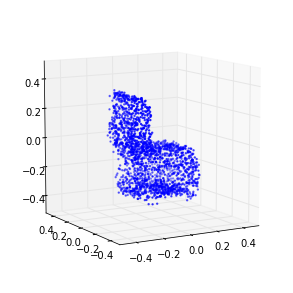

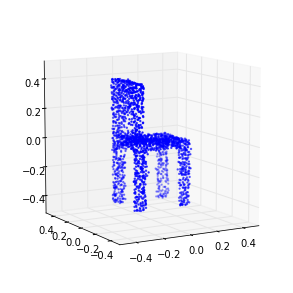

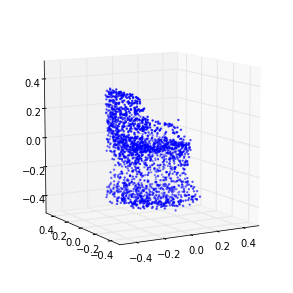

1311 (-0.21639850272072686, 0.25629955088650741)
1312 (-0.21746827518498457, 0.24517156128530149)
1313 (-0.21627629112314295, 0.25017084843582577)
1314 (-0.21641420523325602, 0.24903255038791233)
1315 (-0.21385414269235398, 0.24055176862963923)
1316 (-0.22050804904213658, 0.24954326230066795)
1317 (-0.21812197875093531, 0.2569002056563342)
1318 (-0.21585176024172043, 0.257336457018499)
1319 (-0.21845161296703197, 0.24642342218646296)
1320 (-0.21748323595082319, 0.25132626129521263)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


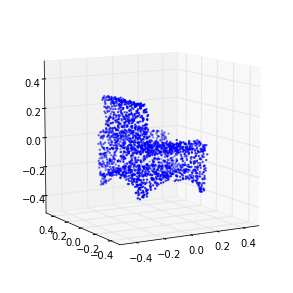

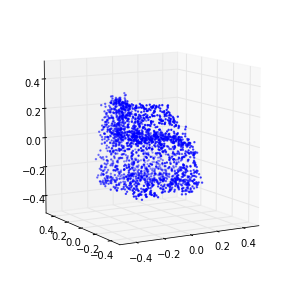

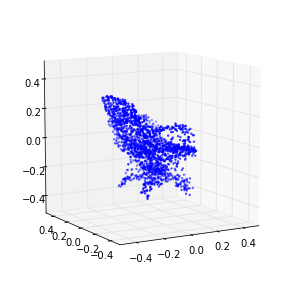

1321 (-0.21664836881337343, 0.24694441755612692)
1322 (-0.21507412901631109, 0.25529445155903147)
1323 (-0.21673039153770166, 0.24806717700428432)
1324 (-0.21507526878957395, 0.2486861828300688)
1325 (-0.21528868631080345, 0.25034959338329454)
1326 (-0.21550266257038822, 0.25282653559137275)
1327 (-0.21657115629425755, 0.24695432682832083)
1328 (-0.21822255308981295, 0.24742925001515281)
1329 (-0.21666981390228979, 0.25492487295910166)
1330 (-0.2193533766048926, 0.25478538208537632)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


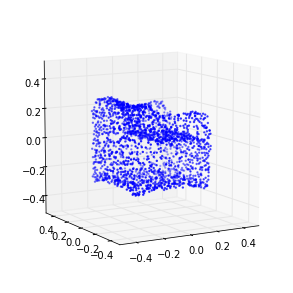

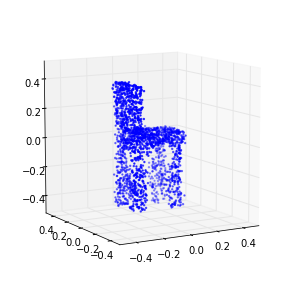

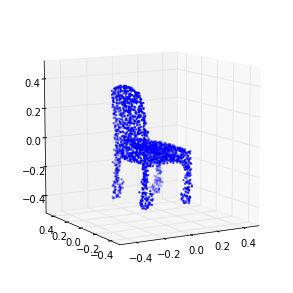

1331 (-0.21726335949367948, 0.25569185780154335)
1332 (-0.21697647273540496, 0.2534272449987906)
1333 (-0.2124912170348344, 0.25580086476273006)
1334 (-0.21743613437370019, 0.25246240364180672)
1335 (-0.21665062793978937, 0.25028677174338587)
1336 (-0.21579575792506889, 0.25283713031698157)
1337 (-0.21698820348139161, 0.25214950961095317)
1338 (-0.21692427153940555, 0.25152265308079896)
1339 (-0.21718114261273985, 0.24643083965336834)
1340 (-0.21503651660901529, 0.24377126163906521)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


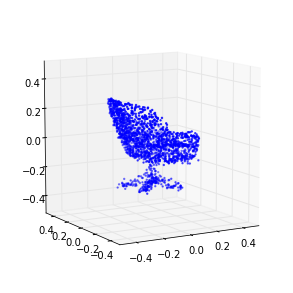

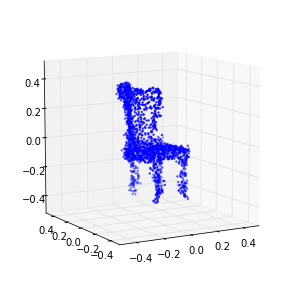

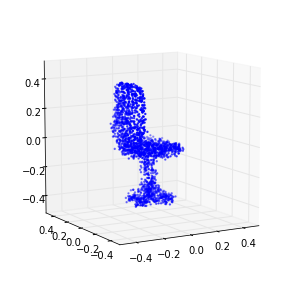

1341 (-0.21634133921729193, 0.24494888661084352)
1342 (-0.21519152522087098, 0.24308913559825332)
1343 (-0.21909834720470286, 0.25640476743380231)
1344 (-0.2180284740748229, 0.2435810085799959)
1345 (-0.21855616094889463, 0.25135492616229588)
1346 (-0.21645059000562739, 0.245401989530634)
1347 (-0.21516413545167004, 0.24762412629745625)
1348 (-0.21506735384464265, 0.26131111493817083)
1349 (-0.21879408867270858, 0.24921201611006702)
1350 (-0.21642309559716119, 0.24852972450079741)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


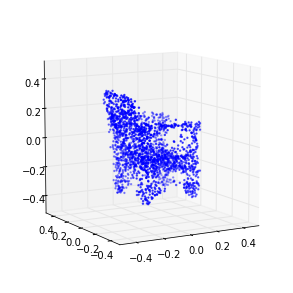

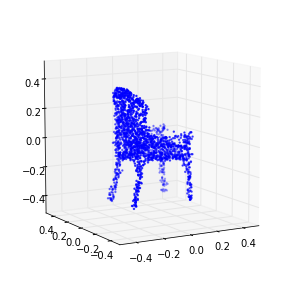

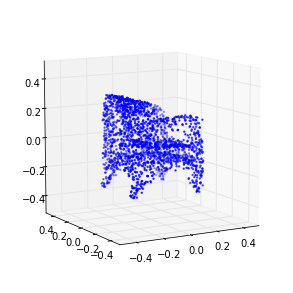

1351 (-0.21672797666655647, 0.23594136149794967)
1352 (-0.21665164254329822, 0.24419287509388393)
1353 (-0.21765060170933051, 0.2443266025295964)
1354 (-0.21448283868807333, 0.2444206459654702)
1355 (-0.21671581897470688, 0.24323563829616265)
1356 (-0.21884485979874929, 0.24824053711361355)
1357 (-0.21781194784023145, 0.25119707981745404)
1358 (-0.21566146126499883, 0.24755554232332441)
1359 (-0.21686314807997809, 0.25177590935318556)
1360 (-0.21509291971171343, 0.24366448985205758)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


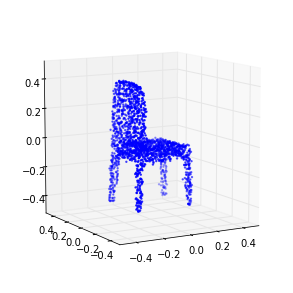

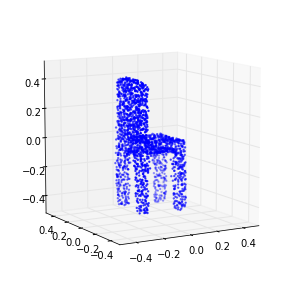

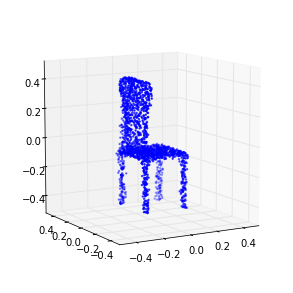

1361 (-0.21754472068062536, 0.24517227322966964)
1362 (-0.21780124328754566, 0.25213091130609866)
1363 (-0.21643795006804997, 0.24409854356889371)
1364 (-0.21796571535092812, 0.25159898897012073)
1365 (-0.21775749524434407, 0.25005936953756547)
1366 (-0.21499320445237335, 0.25206699525868453)
1367 (-0.21595992501135225, 0.24770622452100119)
1368 (-0.21618657145235273, 0.25873176643141993)
1369 (-0.21535137659973569, 0.24764093480728291)
1370 (-0.21471507405793225, 0.25265898527922453)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


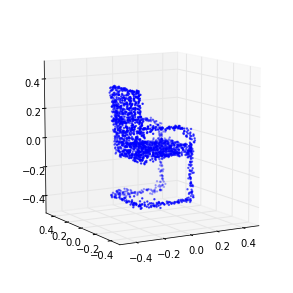

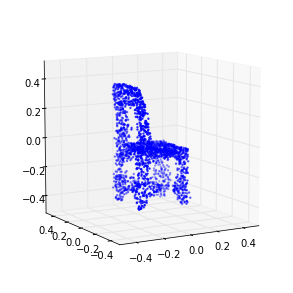

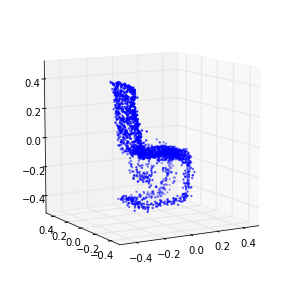

1371 (-0.21718366984967832, 0.24060836544743291)
1372 (-0.21627715881224033, 0.24632625612947676)
1373 (-0.21802491346995037, 0.24613288044929504)
1374 (-0.21820958289835188, 0.24651486012670729)
1375 (-0.21788475369965588, 0.24693330460124546)
1376 (-0.2181591507461336, 0.25337105106424401)
1377 (-0.21683757437600029, 0.24562119278642866)
1378 (-0.21558691196971469, 0.24827505648136139)
1379 (-0.21998552657939768, 0.25221825032322492)
1380 (-0.21598770176922832, 0.24864360358979967)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


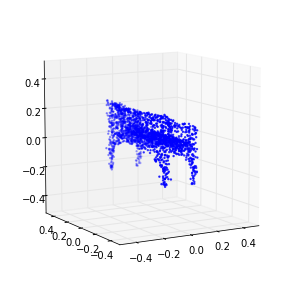

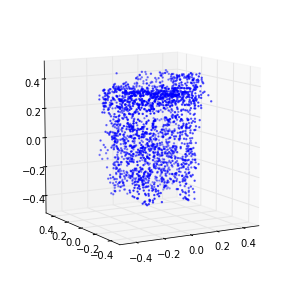

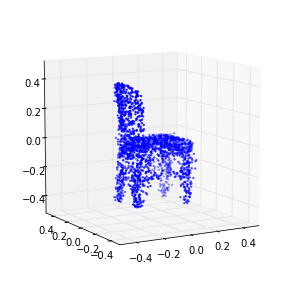

1381 (-0.21701157766359824, 0.25349119691937055)
1382 (-0.21700150017385131, 0.25461991959147984)
1383 (-0.21754691755330122, 0.25786221303321699)
1384 (-0.21731111418317867, 0.25063693302649037)
1385 (-0.21677823508227312, 0.25609006318781113)
1386 (-0.21430594523747762, 0.24969272922586511)
1387 (-0.21688521294682114, 0.25203353608096085)
1388 (-0.21612791992999889, 0.25214380908895423)
1389 (-0.21855127684496067, 0.25052006266735216)
1390 (-0.21669032717192616, 0.24090688482478814)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


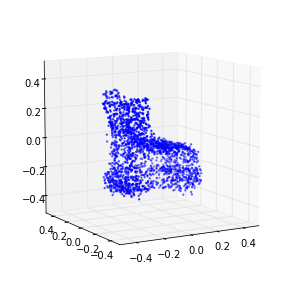

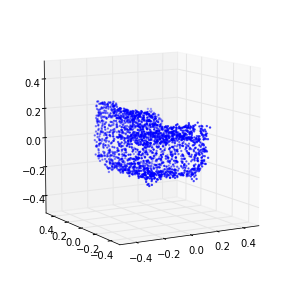

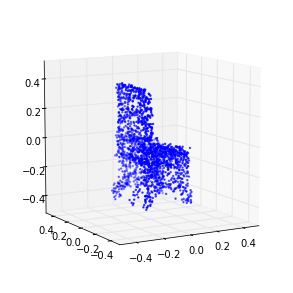

1391 (-0.21598564441557283, 0.25546020876478265)
1392 (-0.21842374437385134, 0.25063924988110858)
1393 (-0.21513433986239963, 0.25368280046515995)
1394 (-0.21710380260591153, 0.2452828519874149)
1395 (-0.21751629478401607, 0.2509223487642076)
1396 (-0.21609549919764201, 0.24455582929982078)
1397 (-0.21516517213097325, 0.24739338402394895)
1398 (-0.21939641579433725, 0.24312649446505089)
1399 (-0.21607964226493129, 0.25603079078374086)
1400 (-0.21801313062508901, 0.25038140791433827)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


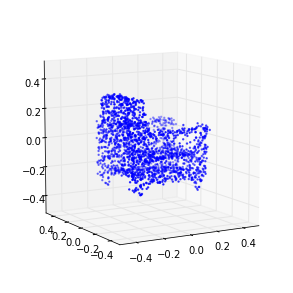

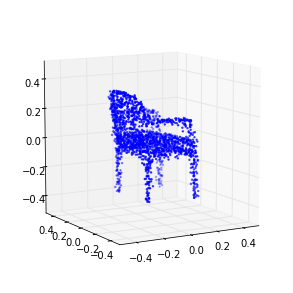

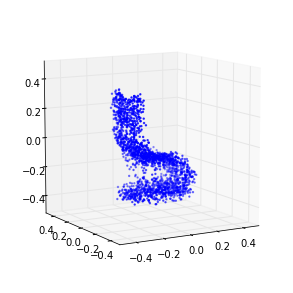

1401 (-0.2167450232638253, 0.24554275472958884)
1402 (-0.21509342204641413, 0.23924589929757295)
1403 (-0.21685912575986649, 0.25150586664676666)
1404 (-0.21635784495759894, 0.24241273988176276)
1405 (-0.21696341335773467, 0.25428942839304608)
1406 (-0.21774356696340774, 0.24958094071458886)
1407 (-0.21760606666405996, 0.24278375340832603)
1408 (-0.21608398280761859, 0.25044216491557936)
1409 (-0.21702444255352021, 0.23946758332075896)
1410 (-0.21756990905161258, 0.25002557811913667)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


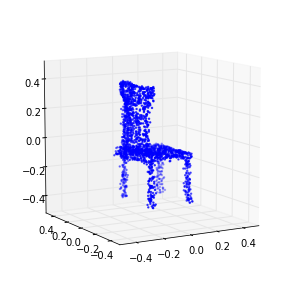

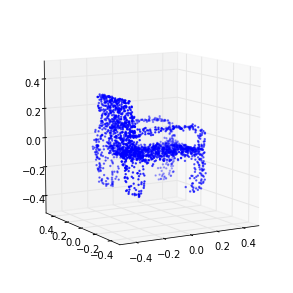

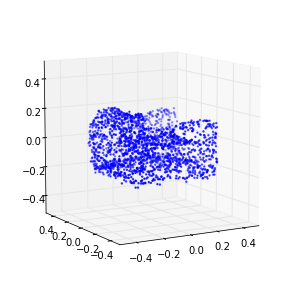

1411 (-0.21524576434382686, 0.2453741784448977)
1412 (-0.21734176476796468, 0.24519526020244317)
1413 (-0.21601581926699037, 0.24082859026061165)
1414 (-0.21821903807145579, 0.25362960166401333)
1415 (-0.21651491412410029, 0.25076044212888787)
1416 (-0.21785364338645227, 0.24283274566685711)
1417 (-0.2148046929527212, 0.24065463907188839)
1418 (-0.21722358023678814, 0.24827229148811764)
1419 (-0.21793067201420113, 0.24529579502564888)
1420 (-0.21552168649655801, 0.2440920047186039)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


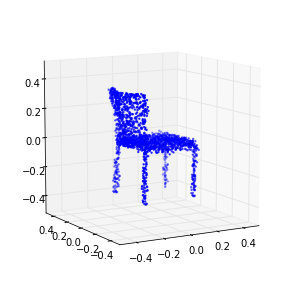

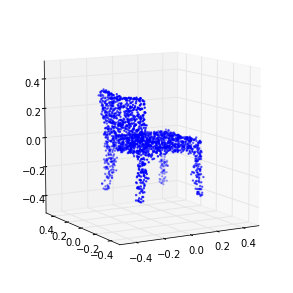

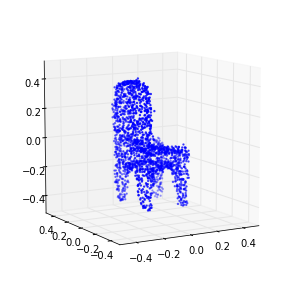

1421 (-0.21747283758940519, 0.24999303232740472)
1422 (-0.21437727268095369, 0.24452657335334355)
1423 (-0.21374227040343816, 0.25012764831384021)
1424 (-0.21879427521317094, 0.24952379696898991)
1425 (-0.21690634665665803, 0.24005433034013818)
1426 (-0.21807837442115502, 0.24775337179501852)
1427 (-0.21774451401498582, 0.25502672515533586)
1428 (-0.21723017880210169, 0.25163910731121347)
1429 (-0.21714422879395662, 0.23259808895764528)
1430 (-0.21749957799911498, 0.24273606638113657)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


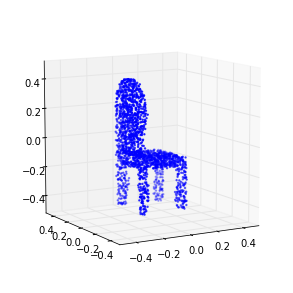

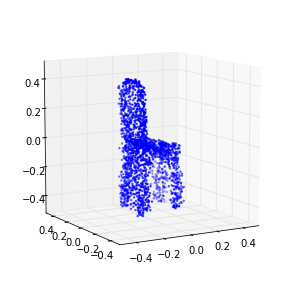

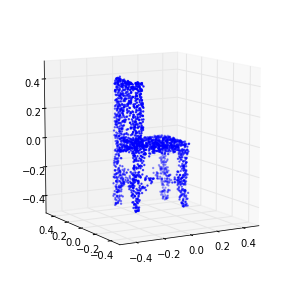

1431 (-0.21793488264083863, 0.2312670228657899)
1432 (-0.21587245618855511, 0.22798388423743071)
1433 (-0.21850488461829998, 0.25162007908026379)
1434 (-0.2159886747598648, 0.23028136348282849)
1435 (-0.21688299355683505, 0.24158707481843453)
1436 (-0.21720486183961232, 0.24338513833505135)
1437 (-0.21697528969358515, 0.24273464249240029)
1438 (-0.21845973045737654, 0.24325824335769372)
1439 (-0.21709767535880761, 0.2432997199120345)
1440 (-0.21983589629332226, 0.24119470572030102)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


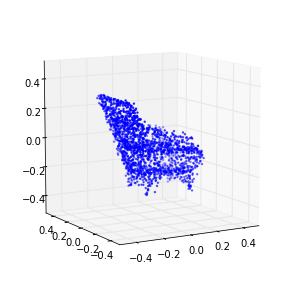

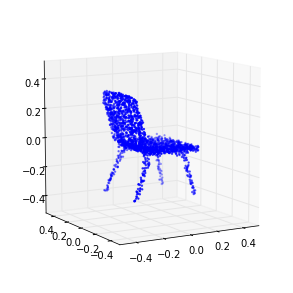

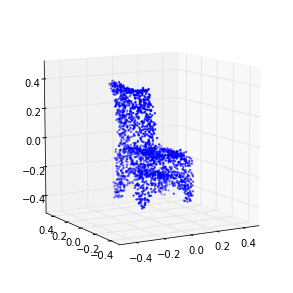

1441 (-0.21554966767628989, 0.23336178064346313)
1442 (-0.21641272714844456, 0.24037100319509153)
1443 (-0.21659855119608068, 0.23838912778430515)
1444 (-0.21326021419631111, 0.24390475231188316)
1445 (-0.21580349736743504, 0.24361361066500345)
1446 (-0.21867041852739122, 0.2365256917697412)
1447 (-0.21429173361372064, 0.233631725664492)
1448 (-0.21705965278325257, 0.24386487018179009)
1449 (-0.21725208880724731, 0.24757246176401773)
1450 (-0.21590633348182395, 0.23346283976678495)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


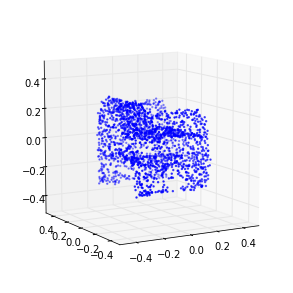

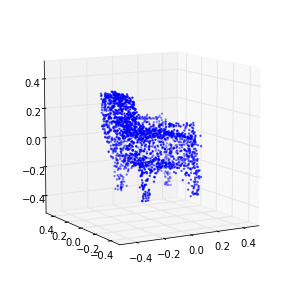

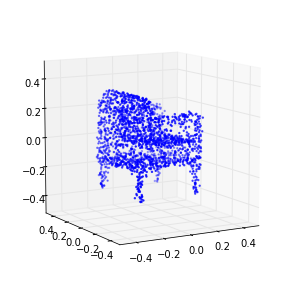

1451 (-0.21924567310898394, 0.23977133686895724)
1452 (-0.21690607876689347, 0.24435345276638312)
1453 (-0.21486004767594513, 0.24556111737533851)
1454 (-0.21750429272651672, 0.23707694643073612)
1455 (-0.21701079220683486, 0.23421664370430839)
1456 (-0.21794692410363092, 0.24168051282564798)
1457 (-0.2157131317589018, 0.24164986886360026)
1458 (-0.21815798900745534, 0.23856378429465824)
1459 (-0.21637366800396532, 0.2444052149852117)
1460 (-0.21708887451224856, 0.23525522483719719)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


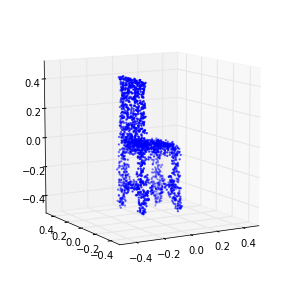

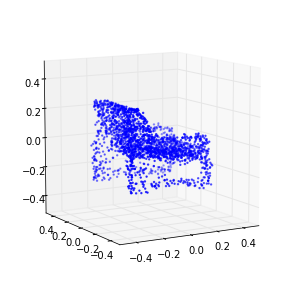

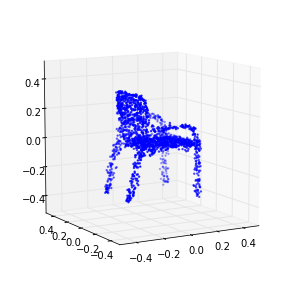

1461 (-0.21768834723366631, 0.23444977789013474)
1462 (-0.2156221768370381, 0.23357559685353879)
1463 (-0.21477341497385943, 0.23503605359130436)
1464 (-0.21471659750850111, 0.2362636305667736)
1465 (-0.21643809069086004, 0.23652697602907816)
1466 (-0.21687296220549832, 0.24427634919131244)
1467 (-0.21702329394993958, 0.24020405831160369)
1468 (-0.21334595779577892, 0.24484526283211178)
1469 (-0.21653106775548722, 0.2473176458367595)
1470 (-0.21379397323837987, 0.24525145634456916)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1470 is not in all_model_checkpoint_paths. Manually adding it.


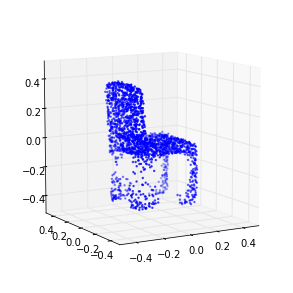

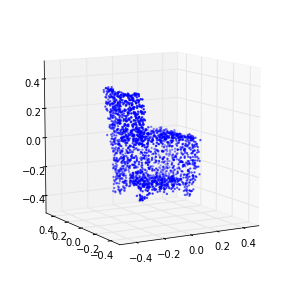

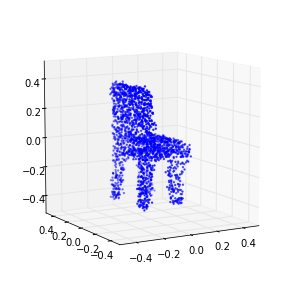

1471 (-0.21550452046924168, 0.23952404547620704)
1472 (-0.21779873801602256, 0.23379993273152244)
1473 (-0.21417869450869384, 0.24180544084972805)
1474 (-0.21630391920054401, 0.23551038293926804)
1475 (-0.2159559863585013, 0.23922738598452675)
1476 (-0.21819631667048842, 0.24759260371879296)
1477 (-0.21584754199893386, 0.24675068479997139)
1478 (-0.21762989869824162, 0.2388094354558874)
1479 (-0.21847086063137761, 0.23963517116175759)
1480 (-0.22017946817256787, 0.24354871500421454)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1480 is not in all_model_checkpoint_paths. Manually adding it.


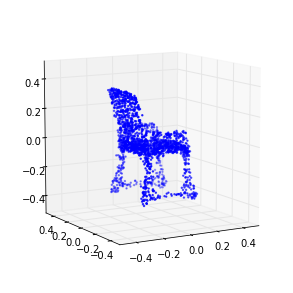

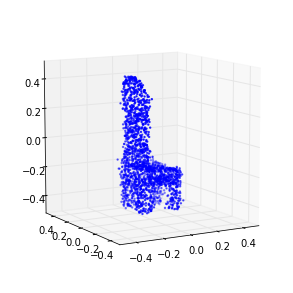

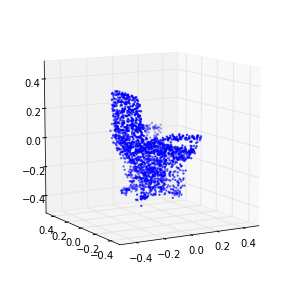

1481 (-0.21796826367025021, 0.24807010811788063)
1482 (-0.21852940133324375, 0.24131509330537584)
1483 (-0.21271790928310819, 0.24187065053869178)
1484 (-0.21428933276070489, 0.23725728635434751)
1485 (-0.2152892059750027, 0.2445828158546377)
1486 (-0.21897828667252153, 0.22509188563735397)
1487 (-0.21768597022250846, 0.24177391882295962)
1488 (-0.21710697291073977, 0.25035933267187188)
1489 (-0.21862801147831812, 0.2554113644140738)
1490 (-0.21679762844686154, 0.23923551870716941)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1490 is not in all_model_checkpoint_paths. Manually adding it.


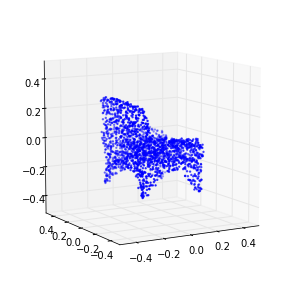

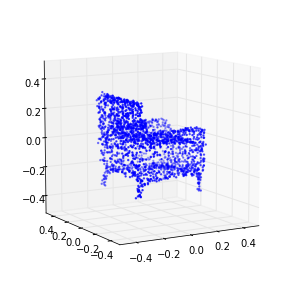

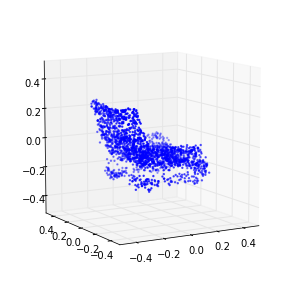

1491 (-0.21711895145751811, 0.23681861769270013)
1492 (-0.21538320172716069, 0.23613151797541865)
1493 (-0.21560030071823685, 0.24174641127939578)
1494 (-0.21478638163319341, 0.23566391401820713)
1495 (-0.21671995686160195, 0.24878284611083842)
1496 (-0.2169542951716317, 0.23169556867193292)
1497 (-0.2171154291541488, 0.23715291365429206)
1498 (-0.21748771954465795, 0.24431856307718489)
1499 (-0.21790352364381155, 0.23361500766542223)
1500 (-0.21652481213763908, 0.23080548588876371)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_12_emd_chair_2048_best_epoch/models.ckpt-1500 is not in all_model_checkpoint_paths. Manually adding it.


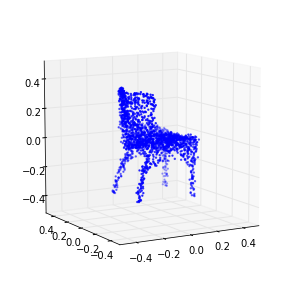

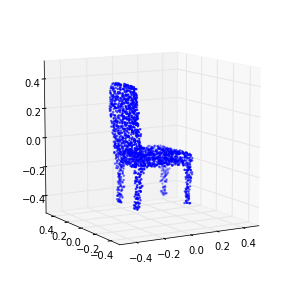

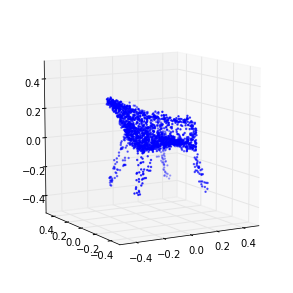

In [10]:
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
save_dir = create_dir(save_dir)

buf_size = 1 # flush each line
if do_training:    
    train_stats = []
    log_file = open(osp.join(train_dir, 'train_stats.txt'), 'a', buf_size)
    for _ in range(max_epochs):        
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss                
        log_file.write('%04d\t%.9f\t%.9f\t%.4f\n' % (epoch, loss[0], loss[1], duration / 60.0))        

        if save_model and (epoch % saver_step == 0 or epoch <= 5):
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_latent_data = gan.generate(n_syn_samples, noise_params)
            syn_data = ae.decode(syn_latent_data)
            np.savez(osp.join(save_dir, 'epoch_' + str(epoch)), syn_data)
            for k in range(3):
                Point_Cloud(syn_data[k]).plot(in_u_sphere=True)
                        
        train_stats.append((epoch,) + loss)
    log_file.close()

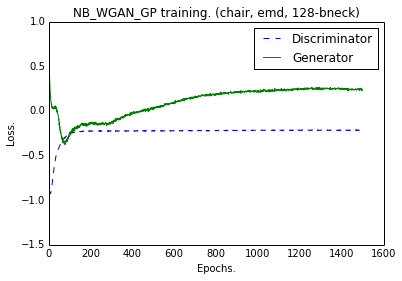

In [11]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('NB_WGAN_GP training. (%s, %s, %s-bneck)' %(class_name, ae_loss, ae.bottleneck_size))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')
    
    plt.savefig(osp.join(train_dir, 'training_curve.png'))